<h1><span style='color:Blue'><u>Classification automatique des biens de consommation
</u><br></span></h1>

Une entreprise souhaite lancer une marketplace e-commerce. Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs. Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

Ce notebook a pour but de réaliser une étude de faisabilité d'un moteur de classification d'articles, basé sur une image et une description, pour l'automatisation de l'attribution de la catégorie de l'article.

Ainsi il est réalisé un prétraitement des descriptions des produits et des images, une réduction de dimension, puis un clustering. Les résultats de la réduction de dimension et du clustering sont présentés sous la forme de graphiques en deux dimensions, et confirmés par un calcul de similarité entre les catégories réelles et les clusters afin d'illustrer le fait que les caractéristiques extraites permettent de regrouper des produits de même catégorie.
    
    


# I. Initialization

In [ ]:
#------------------------------------------------------------------------------
# Import of the modules needed


import sys
import os
import string
import gc
import json
import time
import re
import multiprocessing

from IPython.core.debugger import set_trace
from IPython.display import Audio, display

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
import seaborn as sns

# To use interactive matplotlib in kaggle need to install the package below
#   but it takes like 15' and after need to restart session and if restart
#   computer have to do it again!
# conda install -c conda-forge ipympl 
import ipympl 

from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.cluster import KMeans, SpectralClustering, MiniBatchKMeans
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from scipy.cluster.hierarchy import dendrogram, ward, linkage

import nltk
from nltk.tokenize import word_tokenize

import cv2

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import tensorflow_hub as hub
# import tensorflow_text   #if needed: !pip install tensorflow-text
# import tensorflow.keras

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam

from gensim.models import Word2Vec

import transformers  # HuggingFace
# from transformers import AutoTokenizer, TFAutoModel
# from transformers import RobertaTokenizer, TFRobertaModel
from transformers import *  # if removed: ok except error importing if use mpnet

!pip install sentence_transformers
from sentence_transformers import SentenceTransformer


import logging
logging.disable(logging.WARNING) # disable WARNING, INFO and DEBUG logging 



In [ ]:
### Helper functions (general)


print('\nLibraries version :\n')
print('Python     : ' + sys.version)
print('NumPy      : ' + np.__version__)
print('Pandas     : ' + pd.__version__)
print('Matplotlib : ' + mpl.__version__)
print('Seaborn    : ' + sns.__version__)
# import sklearn
# print('SkLearn    : ' + sklearn.__version__)


%matplotlib inline
sns.set_theme(context='paper')   

pd.set_option('display.max_columns', None)  # print all columns
# pd.set_option('display.width', 120)
# pd.set_option('display.show_dimensions', True)  

# np.set_printoptions(formatter={'float': '{: 0.3f}'.format})
np.set_printoptions(edgeitems=5, linewidth=120,
                    formatter={'float': '{: 0.3f}'.format})

nl = "\n"

CEND    = '\33[0m'  ; CBOLD   = '\33[1m'  ; CITALIC = '\33[3m'   
CUDL    = '\33[4m'  ; CYELLOW = '\33[33m' ; CWHITE  = '\33[37m'
CBLACK  = '\33[30m' ; CRED    = '\33[31m' ; CGREEN  = '\33[32m' 
CBLUE   = '\33[34m' ; CVIOLET = '\33[35m' ; CBEIGE  = '\33[36m' 




def myprint(text, color, bold=False, udl=False, italic=False):  
    """Print in color, bold, underlined or italic"""
    # [Or use html from ipython]
    
    s = ''
    if bold:   s += CBOLD
    if udl:    s += CUDL
    if italic: s += CITALIC
    s += color + text + CEND + '\n'
    print(s)


    
def explore(df, miss=True, valcount=True): 
    """Basic exploration on a dataframe"""

    # pb when lists in the column and do df.count_values()
    # the pb is the memory size, it works for 10k lines but not 100k
       
    myprint('\n----- FIRST LINES -----', CVIOLET, bold=True, udl=True, 
            italic=False)
    display(df.head(5))
    # print(df.shape, '\n') ; # print(df.dtypes, '\n')
    
    myprint('\n----- INFO -----', CVIOLET, bold=True, udl=True, 
            italic=False)
    display(pd.DataFrame(df.info(memory_usage='deep', verbose=True, 
                                 show_counts=True)))  
    
    myprint('\n----- DESCRIBE -----', CVIOLET, bold=True, udl=True, 
            italic=False)
    try: 
        display(pd.DataFrame(df.describe(include=['number'])))
        display(pd.DataFrame(df.describe(include=['object'])))
        # display(pd.DataFrame(df.describe(include=['category'])))
    except ValueError:  # if no number columns or no object columns
        pass
    
    # Unique and missing values per column
    if miss:
        uni_miss(df)
    
    # Value counts per column
    if valcount: 
        myvalcount(df, 10)
    
            

def uni_miss(df):
    """
    For the chosen columns of a DF, gives the number/% of missing 
    values and the number of unique values.
    Example: uni_miss(data0[['len code']])
    """
    
    print('\n-----', namestr(df, globals()))
    myprint('----- MISSING AND UNIQUE VALUES -----', CVIOLET, bold=True, 
            udl=True, italic=False)
    df1 = pd.Series(df.isna().mean())
    df2 = pd.Series(df.isna().sum())
    df3 = pd.concat([df1,df2], axis=1)
    df3.columns = ['%missing', '#missing']
    df3['#values'] = df.shape[0] - df3['#missing'] 
    df3['#unique'] = [len(df[c].apply(lambda x: str(x)).unique()) 
                      for c in df.columns]  # includes NaN
        # substract 1 when NaN in list to have count w/o NaN
    df3['type'] = [df[c].dtypes for c in df.columns] 
    # Use incremental number index to get number of indicators
    df3['column'] = df3.index
    df3.reset_index(drop=True, inplace=True)
    df3.sort_values('%missing', inplace=True)
    df3.index = np.arange(1, len(df3) + 1)
    # Arrange the order of the columns
    cols = list(df3.columns)
    cols = [cols[-1]] + cols[:-1]
    df3 = df3[cols]
    
    with pd.option_context('display.max_rows', None):
        display(df3.sort_values(by='%missing'))
    

     
def myvalcount(df, n_top=10):
    """
    For each DF column, gives the list of the n_top most frequent 
       values and the number of occurences
    Example: myvalcount(data0[['len code']])
    Too slow (jam) if 100k lines of lists
    """
    
    if isinstance(df,pd.DataFrame):
        cols = df.columns
    else:   # if df is a Series or one column of a DataFrame
        cols = df.name  
    myprint('\n----- VALUE COUNTS -----', CVIOLET, bold=True, udl=True, 
            italic=False)
    for col in cols:
        res = pd.DataFrame(df[col].value_counts(dropna=False)).head(n_top)
        myprint('\nTop ' + str(n_top) + ' value counts for ' + str(col) 
                + ' (' + str(len(res)) + ' mod.):', 
                CGREEN, bold=True, udl=True, italic=False)
        display(res)
    return res    


        
def visudf(df, n=10):
    """Display some infos on a dataframe/series"""
    
    print('\nObject:', type(df))
    print('Shape:', df.shape)
    print('Types:', df.dtypes)
    display(df.head(n))
    
    
    
def mem_usage(pandas_obj, list_typ):
    """
    Display the memory usage of a dataframe by type.
    Example: mem_usage(data0, ['float','int','object'])  
    """
    
    if isinstance(pandas_obj, pd.DataFrame):
        usage_b = pandas_obj.memory_usage(deep=True).sum()
    else:  # we assume if not a df it's a series
        usage_b = pandas_obj.memory_usage(deep=True)
    usage_mb = usage_b / 1024 ** 2  # convert bytes to megabytes
    print("\n{:03.2f} MB".format(usage_mb))  
        # same as sys.getsizeof (data0)/1024**2

    for dtype in list_typ:
        selected_dtype = data0.select_dtypes(include=[dtype])
        sum_usage_b = selected_dtype.memory_usage(deep=True).sum()
        sum_usage_mb = sum_usage_b / 1024 ** 2
        print("Total memory usage for {} columns: {:03.2f} MB"
              .format(dtype,sum_usage_mb))
        

        
def mydisplay(df, gen_width=300, gens=None, dig=2, digs=None):
    """
    Pretty and custmed display of a DataFrame.
    gen_width is the width in pixels for all columns
    gens is a dictionary giving specified width for some columns 
       (ex: gens['colname']=60)
    dig is the number of digits after the dot for all numeric columns
    digs is a dictionary giving specified dig for some columns
    """
    
    if isinstance(df, pd.Series):
        df = df.to_frame()
    dfs = (df.style
             .set_table_styles([dict(selector="table, th, td", 
                                     props=[('border', '1px solid indigo'),   
                                            # {N}px solid {color}  
                                            ('border-collapse', 'collapse'),  
                                            # or ('border-color', '#96D4D4')
                                            ])], overwrite=False)
#              # To change the background one row out of two 
#              .set_table_styles([dict(selector="tr:nth-child(even)", 
#                                      props=[('background-color', 
#                                                  '#0a3948'), #2E2E2E
#                                             ])], overwrite=False)
             # Header
             .set_table_styles([dict(selector="th", 
                                     props=[('text-align', 'center'),
                                            ('word-break', 'break-all'),
                                            ('min-width', str(gen_width) 
                                             + 'px'),   #'120px' or '30em'
                                            ('max-width', str(gen_width) 
                                             + 'px'),
                                            ('overflow', 'hidden'), 
                                            ('text-overflow', 'ellipsis'), 
                                            ('white-space', 'nowrap'),
                                            ])], overwrite=False)             
             # Data (cells)
             .set_table_styles([dict(selector="td", 
                                     props=[('text-align', 'center'),
                                            ('word-break', 'break-all'), 
                                              # ('word-wrap', 'break-word')
                                            ('min-width', str(gen_width) 
                                             + 'px'), 
                                            ('max-width', str(gen_width) 
                                             + 'px'),
                                            ('overflow', 'hidden'),      
                                              # necessary to cut text when 
                                              #   arrives at column width
                                            ('text-overflow', 'ellipsis'), 
                                            ('white-space', 'nowrap'),
                                            ])], overwrite=False)
             #To change only selected columns (may need to do the 
             #  same for th also)
#              if gens is not None:
#                    for col in gens.keys:
#                      .set_table_styles({col :[dict(selector='td', 
#                                              props=[('min-width', 
#                                              str(gens[col]) + 'px'),
#                                                     ('max-width', 
#                                                      str(gens[col]) 
#                                                          + 'px'),
#                                                   ])]}, overwrite=False) 
             # To show the full text when the mouse hover a cut text
             .set_table_styles([dict(selector="td:hover", 
                                     props=[('overflow', 'visible'),
                                            ('white-space', 'unset'),
                                           ])], overwrite=False) 
             .set_table_styles([dict(selector="th:hover",  
                                     props=[('overflow', 'visible'),
                                            ('white-space', 'unset'),
                                           ])], overwrite=False)
#              .set_properties(subset=df.columns[0:3].values, 
#                              **{'width': '10px'}, 
#                              **{'max-width': '10px'})
           
    # If not overwrite=False, the parameters set before are deleted
           
    # For color code like '#2E2E2E' : 
    #   https://htmlcolorcodes.com/fr/selecteur-de-couleur/
    # For color name like 'indigo':  
    #   https://www.computerhope.com/jargon/w/w3c-color-names.htm 

    # .set_properties(**{'white-space': 'wrap'}) 
    # .set_properties(subset=['url'], **{'width': '46px'})#, 
    #                 **{'max-width:'46px'})   # for only some columns
    # num_col_mask = df.dtypes.apply(lambda d: issubclass(np.dtype(d).type,
    #                       np.number)) / subset=df.columns[num_col_mask]    
    # #To change only selected col. (may need to do the same for th also)
    ) 
    
    if gens is not None:   #why also above
        for col in gens.keys():
             dfs = dfs.set_table_styles({col :[dict(selector='td', 
                                     props=[('min-width', str(gens[col]) 
                                             + 'px'),
                                            ('max-width', str(gens[col]) 
                                             + 'px'),
                                           ])]}, overwrite=False)        
            
    dfs = dfs.format(precision=dig) 
#     df.style.format(precision=0, na_rep='MISSING', thousands=" ",
#                 formatter={('Decision Tree', 'Tumour'): "{:.2f}",
#                            ('Regression', 'Non-Tumour'): lambda x: 
#                                "$ {:,.1f}".format(x*-1e6)  })

    print(len(df), 'lines')
    display(dfs) 

    

    
def sep_func():
    """
    Display a separator line & the function name at the start 
    of a function.
    """
    
    print(nl, 50*'-', sys._getframe().f_back.f_code.co_name, nl)
    #print(nl, 50*'-', sys._getframe().f_code.co_name, nl)
    


    
def ordered_boxplot(x, y, data):
    """
    Draw a boxplot of data[x] by data[y] ordered according to the 
    mean value of the boxes.
    x and y are column names from dataframe data
    The count of each modality is added to y tick labels, as well 
    as a marker for the mean of each box
    """
    
    grouped = (data.loc[:,[x, y]]
                   .groupby(y)
                   .agg({x:['median', 'count']})
                   .sort_values(by=(x, 'median'), ascending=False)
    )
    fig, ax = plt.subplots(figsize=(15,11)) 
    g = sns.boxplot(x=x, 
                    y=y, 
                    data=data, 
                    ax=ax, 
                    order=grouped.index, 
                    showmeans=True,   
                    # showfliers=False, orient='h'
                    meanprops={"marker":"s","markerfacecolor":"white", 
                               "markeredgecolor":"blue", "markersize":"3"})  
    # g.set_xticklabels(g.get_xticklabels(), rotation=45, fontsize=10, 
    #   horizontalalignment='right')
    ax.set_yticklabels([ind + ' (' + str(grouped.loc[ind, (x, 'count')]) 
                        + ')' for ind in grouped.index])
                        #, fontdict={'fontsize': 7})
    plt.show()    
#     print([ind + ' (' + str(grouped.loc[ind, (x, 'count')]) + ')' 
#            for ind in grouped.index])




def mysound(): 
    """Play a sound (when program finishes, when error, ...)"""
    
    play_time_seconds = 1  ;  framerate = 4410
    t = np.linspace(0, play_time_seconds, framerate*play_time_seconds)
    audio_data = np.sin(2*np.pi*300*t) + np.sin(2*np.pi*240*t)
    display(Audio(audio_data, rate=framerate, autoplay=True))
    
    
    
def custom_exc(shell, etype, evalue, tb, tb_offset=None):
    """This function will be called on exceptions in any cell"""
    
    shell.showtraceback((etype, evalue, tb), tb_offset=tb_offset)
    mysound()    
    
# Play a sound when any error occurs    
get_ipython().set_custom_exc((Exception,), custom_exc)



    
def mygarbage():
    """Manual garbage collection (but doesn't seem to be effective)"""
    
    print(nl*3, "Garbage Collection", nl, "threshold:", gc.get_threshold()) 
    # gc.set_threshold()  # to get/set the threshold of automatic 
    #                     # garbage collection for the 3 generations
    print("len(get_objects):",len(gc.get_objects()))
    print("stats:",gc.get_stats())
    print("count:",gc.get_count())  # number of objects for each generation
    # gc.garbage
    print("nb of collected:", gc.collect(),'\n')  # manual garbage collection
    print("len(get_objects):",len(gc.get_objects()))
    print("stats:",gc.get_stats())
    print("count:",gc.get_count(), nl*3)  # number of objects for each gen.

mygarbage()
    
    
    
    
# Quick function to pretty print & format numbers in a list
f_pr0 = lambda list1: print(' - '.join('{:10,.0f}'.format(f)
                                       .replace(',', ' ') for f in list1))
f_pr3 = lambda list1: print(' - '.join('{:10,.3f}'.format(f)
                                       .replace(',', ' ') for f in list1))



# Get the name (as a string) of the variable
def namestr(obj, namespace):
    """
    Get the name (as a string) of the variable.
    Example: namestr(a, globals())[0]
    """
    
    return [name for name in namespace if namespace[name] is obj]



# Plot all numerical and categorical variables in a df
def project_plot(data0, x_log0=True, y_log0=True):
    """
    Plots to explore numerical and categoricaldata and look for outliers.
    x_log & y_log to choose the scale of the plots on numeric 
    variables (easier to find outliers)
    """
    
    data0 = data0.copy()
    max_mod = 30  # max number of modalities displayed per categorical var.
    
    # General data histograms
    data0.hist(figsize=(15,14), bins=30)
    plt.tight_layout()
    plt.show()
    
    
    # Pairplot (takes several minutes)
    # sns.pairplot(data0, hue='BuildingType', corner=True)
    # plt.savefig('./pairplot5.png', dpi=400) 
#     lcol = list(data0.select_dtypes(include=[np.number]).columns)
#     sns.pairplot(data0, vars=lcol, kind='reg', diag_kind='kde', 
#                  plot_kws={'scatter_kws': {'alpha': 0.1}})
#     plt.show()
    
    
    
    # Plot numeric (and date) data to see if outliers (use log on x and y)
    num_cols = data0.select_dtypes(include=['number', 'datetime64[ns]']
                                  ).columns
    for c in num_cols:
        print(nl, c)
        x_log, y_log = x_log0, y_log0
        if data0[c].dtype == 'datetime64[ns]':
            x_log = False
            format1 ="%Y/%m/%d"
            data_date = pd.to_datetime(data0[c]).dt.date  # dtype=object 
                # if dt.date   or better use dt.floor('d') to keep type
            val1 = pd.to_datetime(
                    np.unique(data_date.sort_values().values)[:15])  
            val2 = pd.to_datetime(
                    np.unique(data_date.sort_values().values)[-15:][::-1])
            print(' unique min =', 
                  [x.strftime(format1) if x==x else 'NaN' for x in val1])
            print(' unique max =', 
                  [x.strftime(format1) if x==x else 'NaN' for x in val2])  
        else:
            print(' unique min =', 
                  [round(x, 1) if (abs(x)>=1) else round(x, 3) 
                   for x in np.unique(data0[c].sort_values()
                                              .values)[:15]
                  ])
            print(' unique max =', 
                  [round(x, 1) if (abs(x)>=1) else round(x, 3) 
                   for x in np.unique(data0[c].sort_values()
                                              .values)[-15:][::-1]
                  ])
        # data0b = data0.loc[data0[c]>0, c]  # remove value 0 just for 
        # plotting (for a better zoom)   
        # to update if values negative possible
        data0b = data0[c]
        fig, ax = plt.subplots(figsize=(15,7))
        x_min, x_max = data0b.min(), data0b.max() 
        if x_min == 0:
            x_min=1e-5
        if x_log and ((x_max-x_min)>100):
            bins = np.geomspace(x_min, x_max, 250) # error if 0 in geomspace
            ax.set_xscale('log')
        else:
            bins = 250
            
        data0b.hist(bins=bins, log=y_log)  
        
        ax.tick_params(axis='both', which='minor', bottom=True, left=True)
        ax.tick_params(axis='both', which='major', bottom=True, left=True)

        myxticks = [x for x in ax.get_xticks(minor=True) 
                    if (x>=x_min)*(x<=x_max)]
        myxlabels = [str(x) for x in myxticks]
        ax.set_xticks(myxticks, minor=True)  # to avoid warning (xticks are 
            # the location and xticklabels their labels)
        ax.set_xticklabels(myxlabels, rotation=30, fontsize=8, minor=True, 
                           horizontalalignment='right')

        ax.set_xticks(ax.get_xticks())  # to avoid warning
        ax.set_xticklabels(ax.get_xticklabels(), rotation=30, fontsize=8, 
                           horizontalalignment='right')
        
        if data0[c].dtype != 'datetime64[ns]':
            print(data0[c].dtype)
            nb = 1 if x_max >= 100 else 2
            ax.get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(
                lambda x, p: format(round(x, nb), ','))) #int(x)
            ax.get_xaxis().set_major_formatter(mpl.ticker.FuncFormatter(
                lambda x, p: format(round(x, nb), ',')))
            ax.get_yaxis().set_minor_formatter(mpl.ticker.FuncFormatter(
                lambda x, p: format(round(x, nb), ',')))
            ax.get_xaxis().set_minor_formatter(mpl.ticker.FuncFormatter(
                lambda x, p: format(round(x, nb), ',')))
            ax.set_xlim(x_min, x_max)
                #must be at the end to get only plot for [x_min, x_max]
        plt.show()

        

    # Plot categorical data (count plot)
    for c in data0.select_dtypes(include=['object']).columns:
        # trick because miss the case where we have like [1] which 
        #  is not considered as a list in pyhton
        if 1:  #(str(data0.iloc[1].loc[c])[0] != '[') and 
            #(sum(data0[c].isna())==0): 
            print(nl, c)
            # if it contains a list, simply take the 1st element 
            #   (often there is only one element in the list)
            data0[c] = data0[c].map(lambda x: x[0] if isinstance(x, list) 
                                              else x)
            col_order = data0[c].value_counts().index
            col_order = col_order[0:min(max_mod, len(col_order))]
            mydisplay(data0[c].head())
            print(type(col_order), col_order[:10])
            fig, ax = plt.subplots(figsize=(15, 0.35*len(col_order)))
            sns.countplot(y=c, order=col_order, data=data0)

            # Print the value next to each bar
            xmin, xmax = plt.xlim()
            for p in ax.patches:
                width = p.get_width()  # get bar length
                ax.text(width + np.sqrt(xmax - 3)/10,  
                        # set the text just after the bar
                p.get_y() + p.get_height() / 2,  
                        # get Y coordinate + X coordinate / 2
                '{:1.0f}'.format(width), ha = 'left', va = 'center')  
                        # vertical alignment
            plt.show()
        
#         # Display the counts for each modality 
#         with pd.option_context('display.max_rows', None):
#             mydisplay(data0[c].value_counts().sort_index()
#                               .reset_index().head(100))



def mytimer(message):   
    """ 
    Multi-Chronometer.
    Use first start_time = time.time()
    """
    
    print(f"\n**** {time.time() - start_time:.2f} seconds --- {message}\n")



In [11]:
# GLOBAL CONSTANTS/FLAGS


ROOT = '../input/oc-proj6/Flipkart/'   
PATH_IMAGES = ROOT + 'Images/'

SEED = 0

funcs = {
        "Xception": tf.keras.applications.Xception,
        "Dense121": tf.keras.applications.DenseNet121,
        "Dense169": tf.keras.applications.DenseNet169,
        "Dense201": tf.keras.applications.DenseNet201,
        "MobileNet": tf.keras.applications.MobileNet,
        "MobileV2": tf.keras.applications.MobileNetV2,
        "MobileV3small": tf.keras.applications.MobileNetV3Small,
        "MobileV3large": tf.keras.applications.MobileNetV3Large,
        "NASlarge": tf.keras.applications.NASNetLarge,   
        "NASmobile": tf.keras.applications.NASNetMobile, 
        "VGG16": tf.keras.applications.VGG16, 
        "VGG19": tf.keras.applications.VGG19, 
        "InceptionRes2": tf.keras.applications.InceptionResNetV2,
        "InceptionV3": tf.keras.applications.InceptionV3, 
        "EffB0": tf.keras.applications.efficientnet.EfficientNetB0,
        "EffB1": tf.keras.applications.efficientnet.EfficientNetB1,
        "EffB2": tf.keras.applications.efficientnet.EfficientNetB2,
        "EffB3": tf.keras.applications.efficientnet.EfficientNetB3,
        "EffB4": tf.keras.applications.efficientnet.EfficientNetB4,
        "EffB5": tf.keras.applications.efficientnet.EfficientNetB5,
        "EffB6": tf.keras.applications.efficientnet.EfficientNetB6,
        "EffB7": tf.keras.applications.efficientnet.EfficientNetB7,
        "ResNet50": tf.keras.applications.resnet50.ResNet50,
        "ResNet101": tf.keras.applications.resnet.ResNet101,
        "ResNet152": tf.keras.applications.resnet.ResNet152,
        "ResNet50V2": tf.keras.applications.resnet_v2.ResNet50V2,
        "ResNet101V2": tf.keras.applications.resnet_v2.ResNet101V2,
        "ResNet152V2": tf.keras.applications.resnet_v2.ResNet152V2,
}

prepro = {
        "Xception": tf.keras.applications.xception,
        "Dense121": tf.keras.applications.densenet,
        "Dense169": tf.keras.applications.densenet,
        "Dense201": tf.keras.applications.densenet,
        "MobileNet": tf.keras.applications.mobilenet,
        "MobileV2": tf.keras.applications.mobilenet_v2,
        "MobileV3small": tf.keras.applications.mobilenet_v3,
        "MobileV3large": tf.keras.applications.mobilenet_v3,
        "NASlarge": tf.keras.applications.nasnet,
        "NASmobile": tf.keras.applications.nasnet,
        "VGG16": tf.keras.applications.vgg16,
        "VGG19": tf.keras.applications.vgg19,
        "InceptionRes2": tf.keras.applications.inception_resnet_v2,
        "InceptionV3": tf.keras.applications.inception_v3,
        "EffB0": tf.keras.applications.efficientnet,  # better use noisy students weights
        "EffB1": tf.keras.applications.efficientnet,
        "EffB2": tf.keras.applications.efficientnet,
        "EffB3": tf.keras.applications.efficientnet,
        "EffB4": tf.keras.applications.efficientnet,
        "EffB5": tf.keras.applications.efficientnet,
        "EffB6": tf.keras.applications.efficientnet,
        "EffB7": tf.keras.applications.efficientnet,
        "ResNet50": tf.keras.applications.resnet,
        "ResNet101": tf.keras.applications.resnet,
        "ResNet152": tf.keras.applications.resnet,
        "ResNet50V2": tf.keras.applications.resnet_v2,
        "ResNet101V2": tf.keras.applications.resnet_v2,
        "ResNet152V2": tf.keras.applications.resnet_v2,
}


# II. Preprocessing for Texts

In [12]:

# Common words and bi-words from WordCloud (the most common with frequency>0.2)
# Used (or not) in preprocess_text function

s0 = ['and', 'Specifications of', 'Ideal For', 'Sales Package', 'Number of', 
      'General Details', 'In the', 'of Contents', 'Contents in', 'in Sales', 
      'Pack of', 'the Box', 'to', 'Key Features', 'Features of', 
      'Package Pack', 'Price Rs', 'Do not', 'the', 'this', 
      'Additional Details', 'Free Shipping', 'Shipping Cash', 'Cash On', 
      'On Delivery', 'Only Genuine', 'Genuine Products', 'is'] 

s1 = ['Flipkart com', 'and', 'for Rs', 'Free Shipping', 'Shipping Cash', 
      'Cash On', 'On Delivery', 'Only Genuine', 'Genuine Products', 
      'Products Day','Replacement Guarantee',  'Rs from', 'from Flipkart', 
      'Guarantee Free', 'com Buy', 'Delivery Flipkart', 'only for', 
      'com Only', 'Set online', 'online only', 'Specifications of', 
      'the', 'In the'] 

s2 = ['Day Replacement', 'for Rs', 'Only Genuine', 'Genuine Products', 
      'Products Day', 'Replacement Guarantee', 'Free Shipping', 'Shipping Cash', 
      'Cash On', 'On Delivery', 'Guarantee Free', 'only for', 'Rs from', 
      'from Flipkart', 'Flipkart com', 'com Only', 'Delivery Buy', 'and', 
      'Price Rs', 'Warranty Warranty', 'Key Features', 'Covered in', 
      'Sales Package', 'General Brand', 'In the',  'Combo Set', 'Features of', 
      'can be', 'Designed for', 'Warranty Summary', 'the product', 
      'High Quality', 'its quality', 'you can', 'easy to', 'of the', 
      'Rs online', 'at best', 'best prices', 'prices with', 'with FREE', 
      'delivery Only', 'Use', 'is a', 'a']

s3 = ['and', 'the', 'of', 'at best', 'best prices', 'to', 'for Rs', 
      'Rs online', 'prices with', 'with FREE', 'FREE shipping', 
      'shipping cash', 'cash on', 'on delivery', 'delivery Only', 
      'Only Genuine', 'Genuine Products', 'Products Day', 'Day Replacement', 
      'Replacement Guarantee', 'This', 'Price Rs', 'is', 'cm for', 'cm at', 
      'in', 'it', 'In the', 'a', 'Guarantee Buy', 'Sales Package', 
      'beautiful', 'or', 'cm' , 'Pack of', 'Specifications of'] 

s4 = ['and', 'Pack of', 'at Rs', 'Rs at', 'at Flipkart', 'Flipkart com', 
      'com Only', 'Only Genuine', 'Genuine Products', 'Products Free', 
      'Free Shipping', 'Shipping Cash', 'Cash On', 'On Delivery', 
      'Sales Package', 'inch cm', 'Price Rs', 'In the', 'Delivery Buy', 
      'Specifications of', 'the Box', 'with', 'of Contents', 'Number of', 
      'Contents in', 'in Sales', 'Box Number', 'General Brand', 'cm In', 
      'Package Pack', 'Key Features', 'Features of',  'Width inch', 
      'cm Width', 'your', 'This', 'Length inch', 'of General', 'to your', 
      'it', 'a', 'For', 'Model Name', 'Model ID', 'Width cm'] 

s5 = ['It is', 'to your', 'a perfect', 'Price Rs', 'your loved', 'Pack of', 
      'for Rs', 'FREE shipping', 'shipping cash', 'cash on', 'on delivery', 
      'Only Genuine', 'Genuine Products', 'in this', 'Products Day', 
      'Day Replacement', 'Replacement Guarantee', 'Rs online', 'at best', 
      'best prices', 'prices with', 'with FREE', 'delivery Only', 
      'loved ones', 'on the', 'bring on', 'perfect for', 'making it', 
      'In the', 'An exclusive', 'Product details', 'Give a', 'a thrilling', 
      'thrilling yet', 'start to', 'your day', 'day An', 
      'exclusive creation', 'creation by', 'ensuring the', 'the design', 
      'design stays', 'stays permanent', 'permanent for', 'for years', 
      'years to', 'to come', 'come and', 'and making', 'it a', 
      'perfect pick', 'pick to', 'to gift', 'gift your', 'ones too', 
      'details and', 'and specifications', 'you can', 'made of', 
      'Specifications of', 'and a', 'the Box', 'Type', 'is a', 
      'Sales Package', 'gift to', 'you the', 'is made', 'Key Features', 
      'Features of', 'a fantastic', 'looks very', 'Box Sales', 'Safe Yes', 
      'with your', 'It looks', 'is also', 'to be', 'loved one']

s6 = ['Online at', 'at Rs', 'Rs in', 'in India', 'India Only', 'Only at', 
      'at Flipkart', 'Flipkart com', 'Great Discounts', 'Discounts Only', 
      'Only Genuine', 'Genuine Products', 'Products Day', 
      'Day Replacement', 'Replacement Guarantee', 'Guarantee Free', 
      'Free Shipping', 'Shipping Cash', 'Cash On', 'On Delivery', 
      'com Great'] 

sx = ['flipkart.com'] #'boy\'s', 'girl\'s']  #'Flipkart', 'com', 
commonW0 = set(s0 + s1 + s2 + s3 + s4 + s5 + s6 + sx)
print(len(commonW0), list(commonW0)[:20], nl)  #157

commonW = [s.replace("'", "")
            .replace(",", "")
            .replace("{", "")
            .replace("}", "")
            .lower()
           for s in str(commonW0).split(' ')]
# commonW = commonW + sx
print(len(commonW), commonW[:20], nl)

commonW = set(commonW)
print(len(commonW), sorted(list(commonW)[:]), nl)  

# removing these common words decreases ARI for tf-idf from 0.48 to 0.46 and 
# word2vec from 0.36 to 0.32 but gives better wordClouds


158 ['your', 'Give a', 'Free Shipping', 'Package Pack', 'Specifications of', 'Do not', 'prices with', 'details and', 'making it', 'Great Discounts', 'Warranty Warranty', 'Guarantee Buy', 'FREE shipping', 'of the', 'Product details', 'of', 'is also', 'Discounts Only', 'to come', 'with'] 

297 ['your', 'give', 'a', 'free', 'shipping', 'package', 'pack', 'specifications', 'of', 'do', 'not', 'prices', 'with', 'details', 'and', 'making', 'it', 'great', 'discounts', 'warranty'] 

108 ['a', 'additional', 'also', 'an', 'and', 'at', 'be', 'beautiful', 'best', 'box', 'brand', 'bring', 'buy', 'by', 'can', 'cash', 'cm', 'com', 'combo', 'come', 'contents', 'covered', 'creation', 'day', 'delivery', 'design', 'designed', 'details', 'discounts', 'do', 'easy', 'ensuring', 'exclusive', 'fantastic', 'features', 'flipkart', 'flipkart.com', 'for', 'free', 'from', 'general', 'genuine', 'gift', 'give', 'great', 'guarantee', 'high', 'id', 'ideal', 'in', 'inch', 'india', 'is', 'it', 'its', 'key', 'length', 'lo

In [13]:

# Preprocessing of the text for the bag of words


def preprocess_text(text_series):
    # Do the preprocessing needed for bag of words methods
    # For each strings in a series, put lowercase + remove punctuation, 
    # numbers, stopwords + lemmatize words
    
    # Put to lower case
    text_series = text_series.map(lambda x: x.lower())
    
    # Tokenization
    text_series = text_series.map(lambda x: word_tokenize(x))
    
    # Remove punctuation & leading/trailing spaces
    punct = string.punctuation  # + string.digits
    text_series = text_series.map(lambda slist: 
                                  [s.strip() for s in slist if s not in punct])
    
    # Remove tokens if they have one or more digits
    text_series = text_series.map(lambda slist: 
                                  [s for s in slist if not re.search(r'\d+', s)])
    
    # Remove stopwords
    stopwords = nltk.corpus.stopwords.words('english') # + list(commonW)
    text_series = text_series.map(lambda slist: 
                                  [s for s in slist if s not in stopwords])    
    # print(len(stopwords), nl, stopwords)
    
#     # doesn't help
#     text_series = text_series.map(lambda slist: 
#                                   [s for s in slist if (('-' not in s) and 
#                                                         ('.' not in s))])  
#     # Take only nouns and adjectives (decreases ARI)
#     text_series = text_series.map(lambda s: [word for word, tag in nltk.pos_tag(s) 
#                                              if ('NN' or 'JJ') in tag])

#     # Remove short words (decreases ARI)
#     text_series = text_series.map(lambda slist: 
#                                   [s for s in slist if len(s)>3])     
    
    # Lemmatize
    lemmatizer = nltk.stem.WordNetLemmatizer()
    text_series = text_series.map(lambda slist: 
                                  [lemmatizer.lemmatize(s) for s in slist]) 
     
    # Join back the words in one string
    text_series = text_series.map(lambda slist: " ".join(slist))     
    
    return text_series
    

# IV. Dimension reduction & Clustering & ARI & T-SNE visualisation

In [14]:

def ARI_fct(features, y_cat_num, perplex=30, dim3=False, algo='kmeans') :
    # Dimension reduction + clustering + ARI
    #
    # features: data used to find the clusters
    # y_cat_num: true labels

    
    # Dimension reduction
    # eg. with bag of words we get 1 to 4 thousands columns/features
    #   so pb of curse of dimensionality -> dimension reduction
    time1 = time.time()
    
#     # PCA (linear)
#     X_tsne = pca_data(features, 0.99, y_cat_num)
    
    # T-SNE (non-linear, manifold)
    tsne = TSNE(n_components = 2 + dim3, perplexity=perplex, n_iter=2000, 
#               method='exact',  # to use if n_comp>4 but slower and ARI/3!
                init='random', learning_rate=200, random_state=SEED) 
    X_tsne = tsne.fit_transform(features)
    # why ARI_pca=ari_tsne/3?why 20(30%) or 200(80%) comp. gives same ARI
    
    
#     scaler = StandardScaler()  # gives ARI close to 0!
#     scaler.fit(features)
#     features = scaler.transform(features)
    
    
    # Détermination des clusters à partir des données après Tsne 

    # Clustering
    if algo=='kmeans':
        # KMeans
        cls = KMeans(n_clusters=N_CATEG, n_init=100, random_state=SEED)
        cls.fit(X_tsne)
        labels = cls.labels_
    elif algo=='hac':
        # HAC gives 0.52 when KMeans gives 0.48 for CNN
        # linkage = ‘ward’, ‘complete’, ‘average’, ‘single’
        model = AgglomerativeClustering(n_clusters=N_CATEG, 
                                        affinity='euclidean', linkage='ward')
        labels = model.fit_predict(X_tsne)
    elif algo=='dbscan':
        # DBSCAN gives 0.51 for CNN 
        # for i in [3.1,3.2,3.3, 3.275, 3.325]:
        model = DBSCAN(eps=3.3, min_samples=4, n_jobs=-1)
                # algorithm = ‘ball_tree’, ‘kd_tree’, ‘brute’   
        # labels = model.fit_predict(data)  
        model.fit(X_tsne)
        labels = model.labels_
    else:
        print('Choose kmeans, hac or dbscan in ARI_fct function')
        raise ValueError

    ARI = np.round(adjusted_rand_score(y_cat_num, labels), 2)
    time2 = np.round(time.time() - time1, 0)
    print(nl, "ARI :", ARI, "( time :", time2, "s )")

    return ARI, X_tsne, labels



def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI, dim3=False) :
    # Visualisation du t-sne selon les vraies catégories & selon les clusters
    
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0], X_tsne[:,1], c=y_cat_num, 
                         cmap='Set1', alpha=0.5)
    ax.legend(handles=scatter.legend_elements()[0], 
              labels=[CATEGS[i] for i in range(N_CATEG)],
              loc="best", 
              title="Categories")
    plt.title('Représentation des produits par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, 
                         cmap='Set1', alpha=0.5)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), 
              loc="best", 
              title="Clusters")
    plt.title('Représentation des produits par clusters')
    plt.show()

    
    # tT-SNE plot (3D)
    if dim3:
        fig = plt.figure(figsize=(7, 7))
        ax = plt.axes(projection='3d')
        scatter = ax.scatter(xs=X_tsne[:,0], ys=X_tsne[:,1], 
                             zs=X_tsne[:,2], c=labels,  # c=y_cat_num,
                             cmap='Set1', alpha=0.5)
        ax.set_xlabel('tsne1')
        ax.set_ylabel('tsne2')
        ax.set_zlabel('tsne3')
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
        # fig.canvas.layout.width = '1000px'  #change window size
        legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", 
                            title="Clusters")
        ax.add_artist(legend1) 
        # elevation of 60 degrees (that is, 60 degrees above the x-y plane) 
        #  and an azimuth of 35 degrees 
        #  (that is, rotated 35 degrees counter-clockwise about the z-axis)
        # print('ax.elev {}'.format(ax.elev))
        # print('ax.azim {}'.format(ax.azim))
        ax.view_init(10, 60)
#         plt.xlim(-10,10)
#         plt.ylim(-10,10)
#         ax.set_zlim(-10, 10) # plt.zlim(-15,15)
        plt.show()
    
    
    
def pca_data(gp, n_comp, labels):
    # PCA decomposition & scree plot
    
    pca = PCA(n_components=n_comp)
    pca.fit(gp)
    reduced_data = pca.transform(gp) 
    # reduced_data = PCA(0.90).fit_transform(gp)  
    # to get 90% of total variance & corresponding number of components
    print('Nb of components:', pca.n_components_)

    # Explained variance for each component (plot)
    plt.figure(figsize=(5,3))
    exp_var = pd.Series(pca.explained_variance_ratio_) 
    print(nl)
    display(exp_var)
    print(nl)
    exp_var.plot(kind="bar", alpha=0.7) 
    
    # Scree plot
    total = 0
    var_ls = []
    for x in exp_var:
        total = total+x
        var_ls.append(total)
    pd.Series(var_ls).plot(marker="o", alpha=0.7) 
    display(pd.Series(var_ls)) ; print(nl)
    plt.xlabel("Principal Components")
    plt.ylabel("Percentage Variance Explained")
    plt.title("Scree Plot", fontsize="xx-large")
    plt.subplots_adjust(left=0.1, right=1, top=1, bottom=0.1)
    plt.show()


#     # PCA 2D drawing
#     fig = plt.figure()
#     ax = fig.add_subplot(111)
#     scatter = ax.scatter(reduced_data[:,0], reduced_data[:,1], 
#                          c=labels, cmap='tab10')
#     ax.legend(handles=scatter.legend_elements()[0], 
#               labels=[CATEGS[i] for i in range(N_CATEG)],
#               loc="best", title="Categorie")
#     plt.subplots_adjust(left=0.1, right=1, top=1, bottom=0.1)
#     plt.legend()
#     plt.show()

#     # PCA 3D drawing
#     fig = plt.figure(figsize=(8,5))
#     ax = fig.add_subplot(111, projection='3d')
#     ax.scatter(reduced_data[:,0], reduced_data[:,1], reduced_data[:,2], 
#       c=labels, cmap='tab10')
#     ax.set_xlabel('pca1')
#     ax.set_ylabel('pca2')
#     ax.set_zlabel('pca3')
#     plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
#     plt.show()
    
    return reduced_data


# V. Analysis of the errors made by the algorithms

In [15]:

def results_analysis(y_true, y_pred, data) :
    """
    Gives the Confusion Matrix (and the associated histograms), 
      the Classification Report
    """
    
    data2 = data.copy()
    # Bar charts to compare predicted to real classes
    data2['n_cluster'] = y_pred
    data2_gp = (data2.groupby(['label_categ', 'n_cluster'])['n_cluster']
                     .agg('count')
                     .unstack(fill_value=0)
                     .stack())
    mydisplay(data2_gp, gen_width=100)
    fig, ax = plt.subplots(nrows=int(N_CATEG / 4) + 1, 
                           ncols=4, 
                           figsize=(15, 6), 
                           dpi=80, 
                           sharey=True) 
    ax = np.ravel(ax) 
    for i, s in enumerate(CATEGS):
        ax[i].bar(data2_gp.loc[s].index, data2_gp.loc[s])
        ax[i].set(xlabel=s) 
        ax[i].set_xticks(range(N_CATEG))
        ax[i].set_xticklabels(list(range(N_CATEG)))
    fig.delaxes(ax[7])
    plt.tight_layout() ; plt.show()
    
    # Matrice de confusion
    conf_mat = confusion_matrix(y_true, y_pred)
    print(conf_mat)
    corresp = np.argmax(conf_mat, axis=0)  
        # doesn't always work but ok if ARI>0.5
#     corresp = [1,4,6,0,3,5,2] #list(range(N_CATEG))
    print (nl, "Correspondance des clusters : ", corresp, nl)
    labels = y_true.to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = \
        labels['y_pred'].apply(lambda x : corresp[x])     
    
    print('Change the predicted classes id to correspond to ' + 
          'true classes...', nl)
    cls_labels_transform = labels['y_pred_transform']   
    conf_mat = confusion_matrix(y_true, cls_labels_transform)
    print('Confusion matrix:', nl, conf_mat, nl)
    
    # Classification report & Heatmap
    print('Classification report:', nl,
          classification_report(y_true, cls_labels_transform), nl)
    df_cm = pd.DataFrame(conf_mat, 
                         index = [label for label in CATEGS],
                         columns = [i for i in range(N_CATEG)])
    plt.figure(figsize = (6,4))
    sns.heatmap(df_cm, annot=True, fmt='g', cmap="Blues")
    plt.show()
        
#     # List the categories where errors
#     data2['n_cluster'] = data2['n_cluster'].apply(lambda x : corresp[x]) 
#     mask = (data2['label'] != data2['n_cluster'])
#     # print(sum(mask))
#     df2 = data2.loc[mask, ['n_cluster', 'label', 'product_category_tree']]
#     d_gens = {'n_cluster':30, 'label':30, 'product_category_tree':100}
#     mydisplay(df2.sort_values(['n_cluster', 'label']), d_gens)

    return

    
def show_errors(n_true, n_pred, y_pred, data): 
    """Display the images where errors occured sorted by categories"""
#        CATEGS = ['Baby Care ' 'Beauty and Personal Care ' 'Computers ' 
#                  'Home Decor & Festive Needs ' 'Home Furnishing '  
#                  'Kitchen & Dining ' 'Watches ']
    
    data2 = data.copy()
    conf_mat = confusion_matrix(data2['label'], y_pred)
    corresp = np.argmax(conf_mat, axis=0) 
    data2['n_cluster'] = y_pred  #before intervertion
    print(nl*2, '*** Products which are', n_true, 'but predicted as', 
          CATEGS[corresp[n_pred]], ': ***', nl*2)
    
    mydisplay(data2.head(5))
    mydisplay(data2.loc[(data2['label_categ'] == n_true)].head(5))
    mydisplay(data2.loc[(data2['n_cluster'] == n_pred)].head(5))
    df = data2.loc[(data2['label_categ'] == n_true) 
                    & (data2['n_cluster'] == n_pred)]
    mydisplay(df.head(10))
    
    
    fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 6)) 
    ax = np.ravel(ax) 
    print(len(df))
    for i in range(min(10, len(df))):
        try:
            image = load_img(PATH_IMAGES + df.iloc[i]['image'], 
                             target_size=(300, 300, 3)) 
        except IndexError:
            print('Index out of bound')
        ax[i].imshow(img_to_array(image)/255)
        ax[i].axis('off');
    plt.show()
    
    
    

# VI. Dataset Exploration

In [16]:
# Impoort the dataset

data0 = pd.read_csv(ROOT + 'flipkart_com-ecommerce_sample_1050.csv', 
                    parse_dates=[4])
            #, sep='\t', dtype=dtypes, encoding='utf-8', engine='c')  
            # nrows=50000   usecols=[0,1,2]   chunksize=50000 


print(data0.columns)

COLS = ['description', 'pid', 'product_name', 'product_category_tree', 
        'image', 'brand']


# With these variables, no missing values and no duplicates


Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')


In [17]:
"""
Some infos on the dataset:

pid = product id
uniq_id = customer id

-
No rating available for 889/1050 achats
It seems that product rating and overall rating are the same

- 

? Remove generic sentences not useful and appearing regularly like:  
- at best prices with FREE shipping & cash on delivery. Only Genuine Products.
30 Day Replacement Guarantee, 
- Key Features of, 
- buy, ...

-
100 Rps. = 1.2 €

-
Flipkart Advantage provides warehousing, packaging, and shipment facilities 
for businesses that are registered with this platform. This platform helps 
sellers delegate responsibility for the performance of these tasks to Flipkart.
Sellers store their inventory at the warehousing facilities used by the online
platform. After the seller receives an order from their customer, Flipkart 
starts assembling, quality check and packaging these products. It also ensures
that these products are shipped to their destinations with Flipkart’s assured
delivery within the stipulated time. It is also responsible for handling 
returns requests from customers.
https://eunimart.com/sme/what-is-flipkart-advantage/

Only 57/1050 are True

""";

In [18]:
# Informations & plots about the dataset variables

# explore(data0)
# project_plot(data0)


In [ ]:
# Duplicates
print('Nb of duplicates:', sum(data0.duplicated(['product_name'])))

mydisplay(data0.head(10))

# VII. Choice of the product category

In [20]:
# Determine the products category



# largest categories (n>=10) from the 179 found after pruning
biggest_categ = ['Watches ', 'Home Furnishing ', 'Kitchen & Dining ',
       ' Laptop Accessories ', ' Showpieces ', ' Network Components ',
       'Home Decor & Festive Needs ', ' Pots & Pans ', ' Deodorants ',
       'Beauty and Personal Care ', ' Dresses ', ' Baby & Kids Gifts ',
       ' Coffee Mugs ', ' Computer Accessories Combos ',
       ' Curtains & Accessories ', ' Kitchen Implements ', ' Face Care ']

# largest categories (n>=5) from the 179 found
# biggest_categ = ['Watches ', 'Home Furnishing ', 'Kitchen & Dining ',
#        'Home Decor & Festive Needs ', ' Laptop Accessories ',
#        'Beauty and Personal Care ', ' Deodorants ', ' Showpieces ',
#        ' Network Components ', ' Infant Wear ', 'Baby Care ', 
#        ' Dresses ', ' Baby & Kids Gifts ', ' Kitchen Implements ',
#        ' Computer Accessories Combos ', ' Coffee Mugs ', ' Face Care ',
#        ' Curtains & Accessories ', ' Baby Bath Towels ',
#        ' Nappies & Cloth Diapers ', ' Pots & Pans ',  ' Baby Blankets ']


products = pd.DataFrame(columns=['brand', 'category', 'tree_prod', 'cat0',  
                                 'cat1', 'cat2', 'cat3', 'cat4', 'cat5', 
                                 'cat6'])

def dispatch_prod(row):
    # Extract the different level categories from the tree category
    #   and choose the category to use
    
    list_prod = row['tree_prod'].replace('["', '')
                                .replace('"]', '')
                                .split('>>')
    
    if len(list_prod)<=2:
        row['category'] = list_prod[0]
        row['cat0'] = list_prod[0]
        return list_prod
    
    # Put each category level in a separate column
    for i in range(len(list_prod)):  
        # last categ. is too specific(with brand name,...)
        if not (row['brand'] in list_prod[i]):  
            # if brand name is in 2nd last categ but 1/3 missing
            row['cat'+str(i)] = list_prod[i]
    
    # One before last category level is used for Category if enough 
    # products in it. Move one or more levels up if not enough products 
    # in the category
    if (i-1>=0) and (list_prod[i-1] in biggest_categ):
        row['category'] = list_prod[i-1]
    elif (i-2>=0) and (list_prod[i-2] in biggest_categ):
        row['category'] = list_prod[i-2]
    elif (i-3>=0) and (list_prod[i-3] in biggest_categ):
        row['category'] = list_prod[i-3]
    elif (i-4>=0) and (list_prod[i-4] in biggest_categ):
        row['category'] = list_prod[i-4]
    elif (i-5>=0) and (list_prod[i-5] in biggest_categ):
        row['category'] = list_prod[i-5]
    else:
        row['category'] = list_prod[1] # 17 cases. 'yo'
#     if row['category'] == list_prod[0]: 
#         # to avoid the main categories(lack details)
#         # but gives too many small categ
#         row['category'] = list_prod[1]
    return list_prod


products['tree_prod'] = data0['product_category_tree'].copy()
products['brand'] = data0['brand'].copy()
products['brand'].fillna('unknown', inplace=True)

products['tree_prod'] = products.apply(lambda row: dispatch_prod(row),
                                       axis=1)


# 2nd idea -> probably better than the one in dispatch_prod
# Take cat1 except if not enough products in the category then use cat0
products['n_cat1'] = products.groupby('cat1')['cat1'].transform('count')
products['n_cat1'].fillna(0, inplace=True)

products['category'] = products['cat0'] + '/' + products['cat1']
mask = (products['n_cat1'] < 50)  
    # tfidf: 0.55 if 7 cat and 0.57 if use 50 here, but the contrary for USE
products.loc[mask, 'category'] = products['cat0']
products.loc[products['category'] == 'Watches ', 'category'] = \
    'Watches / Wrist Watches '

mydisplay(products.head(10), gen_width=100)
print(nl)

# Number of products per category level
for i in range(7):
    print('Number of products with level', i, 
          'category:', sum(~products['cat'+str(i)].isna()))

# Number of products in each category
chosen_cat = 'category'
top_categ = products[chosen_cat].value_counts()
# print(top_categ[top_categ>=10].index) 
#     # to get the biggest categories as most<3
print(nl, top_categ.sort_index())
print(len(top_categ), 'categories')
# with pd.option_context("display.max_rows", None):
#     myvalcount(products[[chosen_cat]], n_top=200)
    
# products[chosen_cat].hist(bins=50)



# to start, only take 7 categories (cat0)
products['category'] = products['cat0']


10 lines


,brand,category,tree_prod,cat0,cat1,cat2,cat3,cat4,cat5,cat6,n_cat1
0,Elegance,Home Furnishing,"['Home Furnishing ', ' Curtains & Accessories ', ' Curtains ', ' Elegance Polyester Multicolor Abstract Eyelet Do...']",Home Furnishing,Curtains & Accessories,Curtains,nan,nan,nan,nan,19.00
1,Sathiyas,Baby Care,"['Baby Care ', ' Baby Bath & Skin ', ' Baby Bath Towels ', ' Sathiyas Baby Bath Towels ', ' Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...']",Baby Care,Baby Bath & Skin,Baby Bath Towels,nan,nan,nan,nan,14.00
2,Eurospa,Baby Care,"['Baby Care ', ' Baby Bath & Skin ', ' Baby Bath Towels ', ' Eurospa Baby Bath Towels ', ' Eurospa Cotton Terry Face Towel Set (20 PIECE FA...']",Baby Care,Baby Bath & Skin,Baby Bath Towels,nan,nan,nan,nan,14.00
3,SANTOSH ROYAL FASHION,Home Furnishing / Bed Linen,"['Home Furnishing ', ' Bed Linen ', ' Bedsheets ', ' SANTOSH ROYAL FASHION Bedsheets ', ' SANTOSH ROYAL FASHION Cotton Printed King sized ...']",Home Furnishing,Bed Linen,Bedsheets,nan,nan,nan,nan,65.00
4,Jaipur Print,Home Furnishing / Bed Linen,"['Home Furnishing ', ' Bed Linen ', ' Bedsheets ', ' Jaipur Print Bedsheets ', ' Jaipur Print Cotton Floral King sized Double Bed...']",Home Furnishing,Bed Linen,Bedsheets,nan,nan,nan,nan,65.00
5,unknown,Watches / Wrist Watches,"['Watches ', ' Wrist Watches ', ' Maserati Time Wrist Watches']",Watches,Wrist Watches,Maserati Time Wrist Watches,nan,nan,nan,nan,149.00
6,unknown,Watches / Wrist Watches,"['Watches ', ' Wrist Watches ', ' Camerii Wrist Watches']",Watches,Wrist Watches,Camerii Wrist Watches,nan,nan,nan,nan,149.00
7,unknown,Watches / Wrist Watches,"['Watches ', ' Wrist Watches ', ' T STAR Wrist Watches']",Watches,Wrist Watches,T STAR Wrist Watches,nan,nan,nan,nan,149.00
8,unknown,Watches / Wrist Watches,"['Watches ', ' Wrist Watches ', ' Alfajr Wrist Watches']",Watches,Wrist Watches,Alfajr Wrist Watches,nan,nan,nan,nan,149.00
9,unknown,Watches / Wrist Watches,"['Watches ', ' Wrist Watches ', ' TAG Heuer Wrist Watches']",Watches,Wrist Watches,TAG Heuer Wrist Watches,nan,nan,nan,nan,149.00




Number of products with level 0 category: 1050
Number of products with level 1 category: 1044
Number of products with level 2 category: 974
Number of products with level 3 category: 293
Number of products with level 4 category: 164
Number of products with level 5 category: 8
Number of products with level 6 category: 0

 Baby Care                                    66
Baby Care / Infant Wear                      84
Beauty and Personal Care                     85
Beauty and Personal Care / Fragrances        65
Computers                                    63
Computers / Laptop Accessories               87
Home Decor & Festive Needs                   79
Home Decor & Festive Needs / Showpieces      71
Home Furnishing                              85
Home Furnishing / Bed Linen                  65
Kitchen & Dining                             76
Kitchen & Dining / Coffee Mugs               74
Watches / Wrist Watches                     150
Name: category, dtype: int64
13 categories


In [21]:

data1 = data0[COLS].copy()

# Transform the categories to numbers
le = LabelEncoder()
le.fit(products['category'])
data1['label'] = le.transform(products['category'])  # category code number
data1['label_categ'] = products['category']  # category name


# Preprocess the text in the description
mydisplay(data1.head(10))
data1['description'] = preprocess_text(data1['description'] 
#                                        + ' . ' + data1['product_name']
                                      )
mydisplay(data1.head(10))


# # 338 products don't have brands
# # can use the 1st word of the description for imputing (sometimes would need 
# #   the first 2 words but 1 is ok)
# mydisplay(data1.loc[data1['brand'].isna()].tail(20))
# print(sum(data1['brand'].isna()))  


# y_cat_num = data1['label']
# le.inverse_transform(
### +standardscaler

N_CATEG = len(data1['label'].unique())
CATEGS = le.classes_

print(nl, 'Nb of categories:', N_CATEG, nl)
print(CATEGS, nl)

print(data0.loc[1, 'description'], nl)
print(data1.loc[1, 'description'], nl)


10 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
0,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing
1,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care
2,"Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product is 100% cotton, so it is susceptible to shrinkage. Product color may vary from the picture. Size may vary by ±3% WASH CARE: Wash in cold Water, Do not Iron, Do not Bleach, Flat dry, Wash before first use. SIZE- FACE TOWEL - 23 cms X 23 cms.,Specifications of Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Bath Towel Features Material Cotton Terry Design SHUVAM General Brand Eurospa GSM 360 Type Face Towel Set Model Name SHUVAM20PCFTSETASSORTED Ideal For Boys, Girls, Men, Women Model ID SHUVAM20PCFTSETASSORTED Size small Color Assorted Dimensions Weight 350 g Length 9 inch Width 9 inch In the Box Number of Contents in Sales Package 20 Sales Package 20 PIECE FACE TOWEL SET",BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care
3,"Key Features of SANTOSH RO

10 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Print


 Nb of categories: 7 

['Baby Care ' 'Beauty and Personal Care ' 'Computers ' 'Home Decor & Festive Needs ' 'Home Furnishing '
 'Kitchen & Dining ' 'Watches '] 

Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel 

specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel 



In [22]:
# Number of words in each preprocessed description

print('Before text preprocessing:')
display(data0['description'].head())
ser = data0['description'].map(lambda s: len(s.split(' ')))
print(ser.value_counts())
print('max min mean sum:', max(ser), min(ser), 
      round(np.mean(ser), 1), sum(ser), nl)

print('After text preprocessing:')
display(data1['description'].head())
ser = data1['description'].map(lambda s: len(s.split(' ')))
print(ser.value_counts())
print('max min mean sum:', max(ser), min(ser), 
      round(np.mean(ser), 1), sum(ser))


Before text preprocessing:


0    Key Features of Elegance Polyester Multicolor ...
1    Specifications of Sathiyas Cotton Bath Towel (...
2    Key Features of Eurospa Cotton Terry Face Towe...
3    Key Features of SANTOSH ROYAL FASHION Cotton P...
4    Key Features of Jaipur Print Cotton Floral Kin...
Name: description, dtype: object

21     42
43     36
45     36
29     33
31     30
       ..
157     1
187     1
321     1
42      1
303     1
Name: description, Length: 220, dtype: int64
max min mean sum: 589 18 80.3 84338 

After text preprocessing:


0    key feature elegance polyester multicolor abst...
1    specification sathiyas cotton bath towel bath ...
2    key feature eurospa cotton terry face towel se...
3    key feature santosh royal fashion cotton print...
4    key feature jaipur print cotton floral king si...
Name: description, dtype: object

25     66
19     63
23     59
13     45
17     34
       ..
88      1
122     1
77      1
90      1
224     1
Name: description, Length: 162, dtype: int64
max min mean sum: 366 12 52.2 54829


Baby Care  



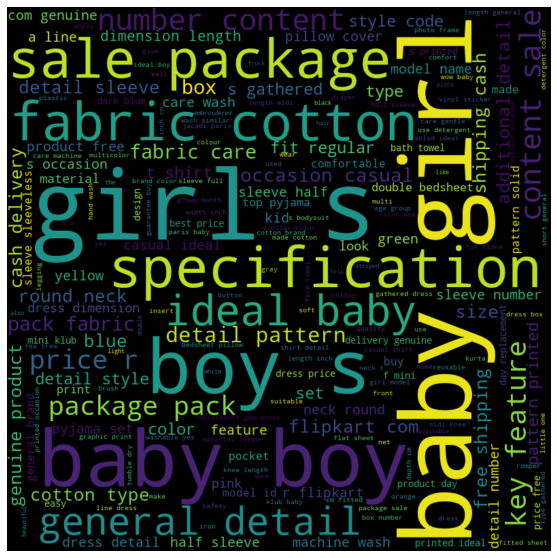

['baby girl', 'girl s', 'baby boy', 'boy s', 'specification', 'sale package', 'fabric cotton', 'ideal baby', 'general detail', 'number content', 'content sale', 'key feature', 'package pack', 'price r', 'detail pattern', 'fabric care', 'box', 'pack fabric', 'occasion casual', 'size', 'blue', 'cotton type', 'round neck'] 



Beauty and Personal Care  



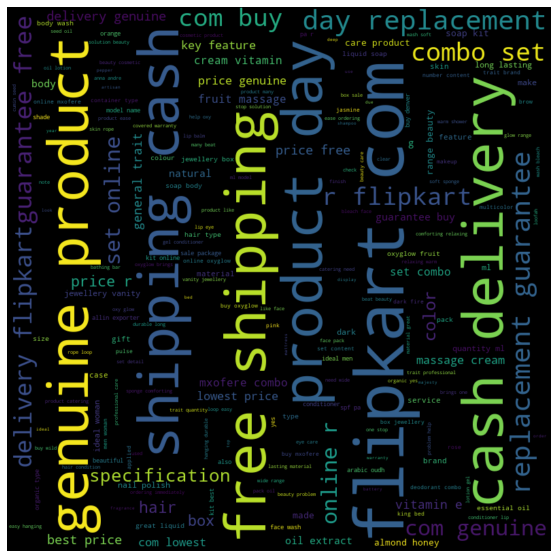

['flipkart com', 'free shipping', 'shipping cash', 'cash delivery', 'genuine product', 'product day', 'day replacement', 'replacement guarantee', 'combo set', 'r flipkart', 'guarantee free', 'com buy', 'delivery flipkart', 'com genuine', 'set online', 'online r', 'specification', 'color', 'hair'] 



Computers  



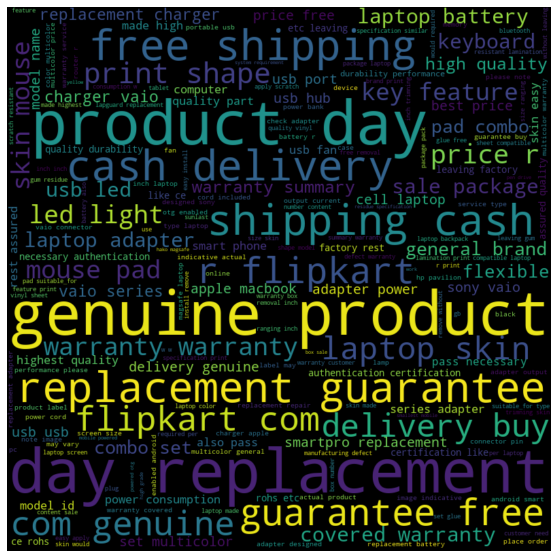

['genuine product', 'product day', 'day replacement', 'replacement guarantee', 'free shipping', 'shipping cash', 'cash delivery', 'guarantee free', 'r flipkart', 'flipkart com', 'com genuine', 'delivery buy', 'laptop skin', 'print shape', 'price r', 'warranty warranty', 'led light', 'skin mouse', 'mouse pad', 'key feature', 'covered warranty', 'laptop adapter', 'keyboard', 'usb led', 'sale package', 'laptop battery', 'general brand', 'pad combo', 'combo set', 'flexible', 'warranty summary', 'high quality', 'replacement charger', 'charger vaio', 'vaio series', 'smartpro replacement', 'best price', 'price free', 'delivery genuine', 'usb port', 'model name', 'apple macbook', 'adapter power', 'cell laptop', 'usb hub', 'usb usb', 'set multicolor', 'sony vaio', 'power consumption', 'skin easy', 'computer', 'usb fan', 'model id', 'made high', 'series adapter', 'rest assured'] 



Home Decor & Festive Needs  



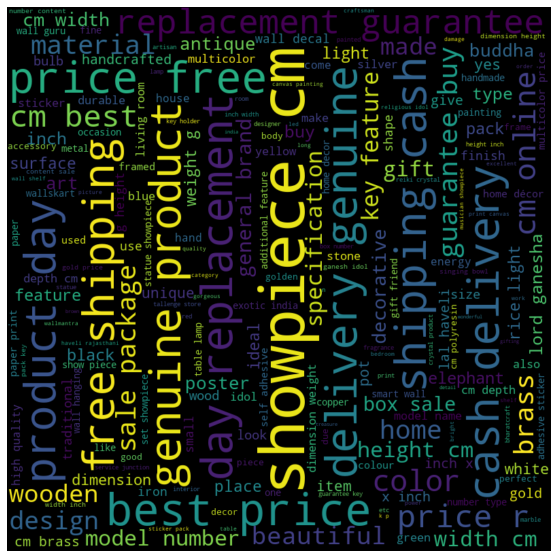

['showpiece cm', 'best price', 'price free', 'free shipping', 'shipping cash', 'cash delivery', 'delivery genuine', 'genuine product', 'product day', 'day replacement', 'replacement guarantee', 'price r', 'cm online', 'cm best', 'color', 'brass', 'guarantee buy', 'material', 'sale package', 'home', 'design'] 



Home Furnishing  



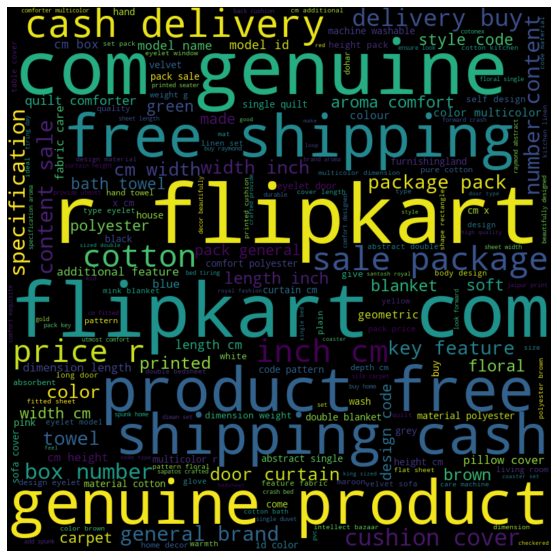

['r flipkart', 'flipkart com', 'com genuine', 'genuine product', 'product free', 'free shipping', 'shipping cash', 'cash delivery', 'sale package', 'price r', 'cotton', 'inch cm', 'delivery buy', 'cushion cover', 'number content', 'content sale', 'specification', 'box number', 'general brand', 'package pack', 'key feature', 'towel', 'cm width', 'color', 'width inch', 'door curtain', 'printed', 'floral', 'brown', 'soft', 'blanket', 'length inch', 'aroma comfort', 'green', 'style code', 'bath towel', 'polyester', 'made', 'carpet', 'pack general', 'width cm', 'design code', 'quilt comforter', 'model name', 'model id', 'length cm', 'cm box', 'blue', 'cm height', 'dimension length', 'pillow cover', 'fabric care', 'additional feature', 'colour', 'geometric', 'color multicolor', 'material polyester', 'material cotton', 'pink', 'velvet', 'furnishingland', 'curtain cm', 'single quilt', 'multicolor r', 'double blanket', 'comfort polyester'] 



Kitchen & Dining  



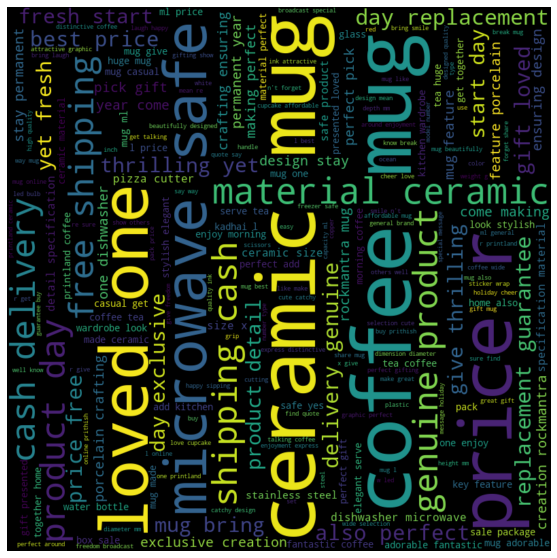

['ceramic mug', 'coffee mug', 'price r', 'loved one', 'microwave safe', 'material ceramic', 'free shipping', 'shipping cash', 'cash delivery', 'genuine product', 'product day', 'day replacement', 'replacement guarantee', 'best price', 'price free', 'delivery genuine', 'gift loved', 'also perfect', 'mug bring', 'product detail', 'give thrilling', 'thrilling yet', 'yet fresh', 'fresh start', 'start day', 'day exclusive', 'exclusive creation', 'creation rockmantra', 'rockmantra mug', 'mug feature', 'feature porcelain', 'porcelain crafting', 'crafting ensuring', 'ensuring design', 'design stay', 'stay permanent', 'permanent year', 'year come', 'come making', 'making perfect', 'perfect pick', 'pick gift', 'one dishwasher', 'dishwasher microwave', 'safe product', 'detail specification', 'specification material', 'ceramic size', 'size x', 'pizza cutter', 'mug ml', 'stainless steel', 'kadhai l', 'pack', 'glass', 'sale package', 'mug made', 'made ceramic', 'tea coffee', 'mug give', 'key feature

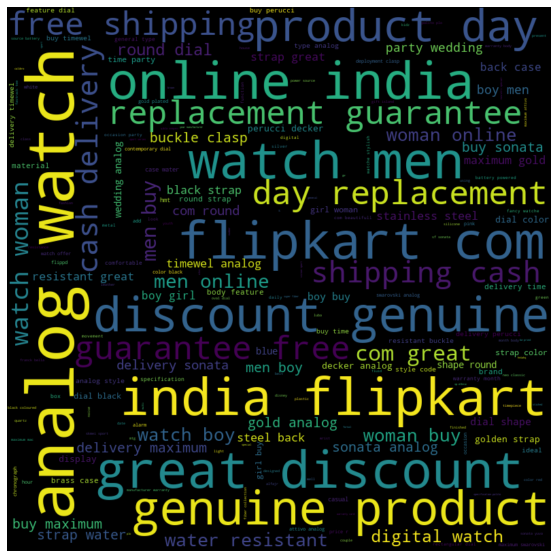

['analog watch', 'watch men', 'online india', 'india flipkart', 'flipkart com', 'great discount', 'discount genuine', 'genuine product', 'product day', 'day replacement', 'replacement guarantee', 'guarantee free', 'free shipping', 'shipping cash', 'cash delivery', 'watch woman', 'com great', 'men buy', 'men online', 'water resistant'] 





In [23]:
# Word clouds for each categories

from wordcloud import WordCloud

for i in range(N_CATEG):  
    print(CATEGS[i], nl)
    text = " ".join(data1.loc[data1['label_categ']==CATEGS[i], 'description'])
    wordcloud = WordCloud(random_state = SEED,
            normalize_plurals = False,
            width = 800, height= 800,
            max_words = 200,
            #collocations=False,
            stopwords = [])
    wordcloud.generate_from_text(text)
    # Create a figure
    fig, ax = plt.subplots(1,1, figsize = (10,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    print([s for s in wordcloud.words_.keys() if wordcloud.words_[s]>0.2], 3*nl) 
    
# many are 'double' words like 'baby boy', that's why baby/girl/boy/...
#   appears twice. Use collocations=False to get only one word



 Category Baby Care 
21 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care
66,specification chhote janab cozy mattress protector set multi baby

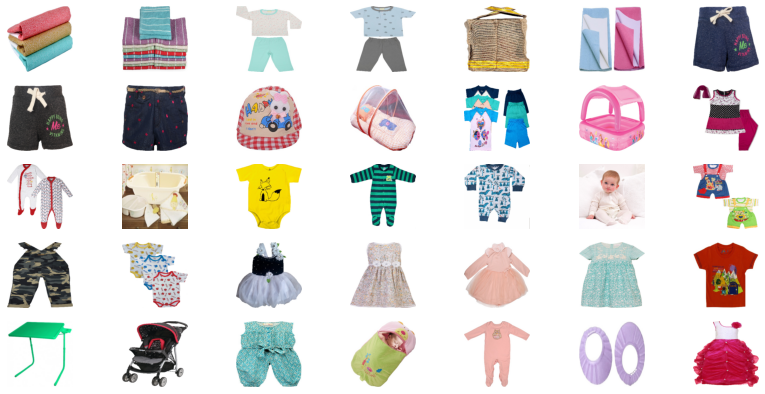


 Category Beauty and Personal Care 
21 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
43,key feature burt bee hair repair shea grapefruit deep conditioner ideal boy girl applied deep conditioning hair condition damaged hair hair type dry hair specification burt bee hair repair shea grapefruit deep conditioner ml conditioner trait hair condition damaged hair hair type dry hair applied deep conditioning ideal boy girl general trait brand burt bee quantity ml model name hair repair shea grapefruit deep conditioner box conditioner,CNDEGVE65UWDPCYC,Burt s Bees Hair Repair Shea And Grapefruit Deep Conditioner,"[""Beauty and Personal Care >> Hair Care >> Conditioners >> Burt s Bees Conditioners >> Burt s Bees Hair Repair Shea And Grapefruit Deep...""]",2d50e4c6ccf8befe9335ac8f97a11712.jpg,Burt s Bees,1,Beauty and Personal Care
49,key feature suave natural everlasting sunshine conditioner ideal boy girl applied conditioning hair condition damaged hair hair type dry hair specification suave natural everlasting sunshine conditioner ml conditioner trait hair condition damaged hair hair type dry hair applied conditioning ideal boy girl general trait brand suave quantity ml model name natural everlasting sunshine conditioner box conditioner,CNDEGVE6PR98MZHU,Suave Naturals Everlasting Sunshine Conditioner,"[""Beauty and Personal Care >> Hair Care >> Conditioners >> Suave Conditioners >> Suave Naturals Everlasting Sunshine Conditioner ...""]",02a53d335775b652f22f41b529b9d646.jpg,Suave,1,Beauty and Personal Care
56,buy borse make jewellery vanity case online borse make jewellery vanity case best price free shipping cash delivery genuine product day replacement guarantee,VANEABFPKGGZTYVQ,Borse N16 Make Up And Jewellery Vanity Case,"[""Beauty and Personal Care >> Makeup >> Vanity Boxes >> Borse Vanity Boxes""]",24e85c590481a7cedfe66597f253f2b2.jpg,nan,1,Beauty and Personal Care
57,specification rythmx fb nail polish black lipstick important combo set combo set detail number content combo set combo set content nail polish lipstick organic yes ideal woman general trait professional care yes warranty use lipstick exchange return,CBKEJ3AZMZGTQ9F5,RYTHMX FB NAIL POLISHES BLACK LIPSTICKS IMPORTANT COMBO 51,"[""Beauty and Personal Care >> Combos and Kits >> RYTHMX Combos and Kits >> RYTHMX FB NAIL POLISHES BLACK LIPSTICKS IMPORTAN...""]",5e84d36ad6db970548498829db8b15de.jpg,RYTHMX,1,Beauty and Personal Care
58,key feature rythmx fb nail polish black lipstick important combo hour stay made india soft smooth creamy matte rythmx fb nail polish black lipstick important combo set price r rythmx best quality intense fashionable color come chic vivid shades.its ultra-creamy texture glide smoothly covering creases. specification rythmx fb nail polish black lipstick important combo set combo set detail number content combo set combo set content nail polish lipstick organic yes ideal woman general trait professional care yes warranty use lipstick exchange return,CBKEJ3ANG8NRZJPT,RYTHMX FB NAIL POLISHES BLACK LIPSTICKS IMPORTANT COMBO 60,"[""Beauty and Personal Care >> Combos and Kits >> RYTHMX Combos and Kits >> RYTHMX FB NAIL POLISHES BLACK LIPSTICKS IMPORTAN...""]",3c4604dba348a99a2dfbbc2cd3928101.jpg,RYTHMX,1,Beauty and Personal Care
59,specification brillare science dandruff control shampoo intenso creme combo set combo set detail combo set content dandruff control shampoo dandruff control intenso creme ideal woman men organic general trait professional care yes,CBKEJ5PZWGGSBBSC,Brillare Science Dandruff Control Shampoo & Intenso Creme Combo,"[""Beauty and Personal Care >> Combos and Kits >> Brillare Science Combos and Kits >> Brillare Science Dandruff Control Shampoo & Inte...""]",0abfcbe0e17dd50c4cf5fb1d6037d514.jpg,Brillare Science,1,Beauty and Personal Care
60,mar queen eye liner lip gloss eyeliner set price r queen eye liner lip gloss eyeliner specification mar queen eye liner lip gloss eyeliner set combo set detail number content combo set combo set conte

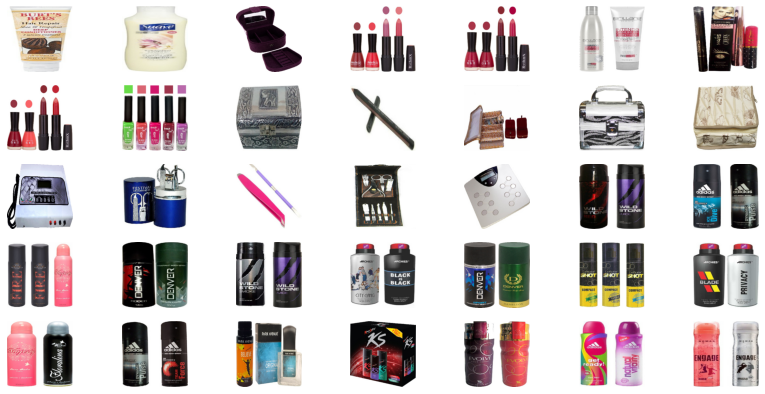


 Category Computers 
21 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
47,key feature d-link qrs app io android specification d-link white speed wireless speed mbps dsl modem speed mbps general brand d-link box extender plug model type range extenders/repeaters color white warranty covered warranty damage warranty summary service type damage covered warranty damaged repair dimension weight g connectivity number antenna number usb port antenna internal supported protocol standard ieee ieee operating condition operating humidity operating non-condensing // storage non-condensing temperature operating °c °f //storage °c °f degree c additional feature certification fcc ic ce,RTREGG8F83DMYHPE,D-Link DAP1320,"[""Computers >> Network Components >> Routers >> D-Link Routers >> D-Link DAP1320 (White)""]",d1899ab1d5c79ddaa311bc9f04d198ed.jpg,D-Link,2,Computers
51,key feature roq slim multimedia flexible wired usb flexible keyboard size handheld roq slim multimedia flexible wired usb flexible keyboard white price r working environment fit easily briefcase backpack keyboard cleaned water alcohol disinfectant help prevent spread disease germ suitable public place use school restaurant hospital clean keyboard requirement sealed keyboard easily cleaned also good use dusty area factory outdoor quiet keystroke good match library use used keyboard may push key tiny bit harder get output dustproof washable usb plug weight operation temperature storage temperature specification roq slim multimedia flexible wired usb flexible keyboard white general specification interface wired usb brand roq model slim multimedia flexible sale package keyboard type flexible keyboard model name slim multimedia flexible keyboard color white size handheld warranty covered warranty manufacturing damage warranty summary day 's replacement warranty service type replacement covered warranty physical damage,ACCEGYPGD9XH3RKR,RoQ Slim Multimedia 105key Flexible Wired USB Flexible Keyboard,"[""Computers >> Tablet Accessories >> Keyboards >> RoQ Keyboards >> RoQ Slim Multimedia 105key Flexible Wired USB Fl...""]",b4d35b6536b623c83b293eb3a1c02bba.jpg,RoQ,2,Computers
53,key feature jrb smallest mobile powered otg enabled android smart phone portable usb fan system requirement otg enabled android smart phone material plastic specification jrb smallest mobile powered otg enabled android smart phone portable usb fan multicolor general brand jrb type usb fan model name smallest mobile powered otg enabled android smart phone material plastic system requirement otg enabled android smart phone model id portable color multicolor box sale package micro usb fan,USGEJPQKBNS5KDTE,JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan,"[""Computers >> Laptop Accessories >> USB Gadgets >> JRB USB Gadgets >> JRB 1038 Smallest Mobile Powered By OTG Enabled ...""]",6329ddb46087cb8c09ced95471dd9643.jpg,JRB,2,Computers
54,key feature jrb smallest mobile powered otg enabled android smart phone portable usb fan system requirement otg enabled android smart phone material plastic specification jrb smallest mobile powered otg enabled android smart phone portable usb fan multicolor general brand jrb type usb fan system requirement otg enabled android smart phone material plastic model name smallest mobile powered otg enabled android smart phone model id portable color multicolor box sale package micro usb fan,USGEJPQHFM7CVCYH,JRB 1033 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1033 USB Fan,"[""Computers >> Laptop Accessories >> USB Gadgets >> JRB USB Gadgets >> JRB 1033 Smallest Mobile Powered By OTG Enabled ...""]",7e6ae1b372e8e0b509b83ba3658b8107.jpg,JRB,2,Computers
55,key feature jrb smallest mobile powered otg enabled android smart phone portable usb fan system requirement otg enabled android smart phone material plastic specification jrb smallest mobile powered otg enabled android smart phone portable usb fan multicolor general

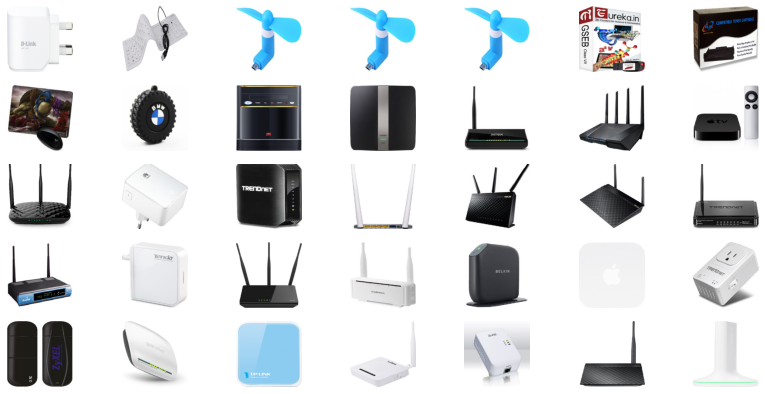


 Category Home Decor & Festive Needs 
21 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
36,myesquire ceramic burner pot lemongrass liquid air freshener ml price r illuminate every corner living room style home fragrance electric burner combo fragrance brought myesquire unique useful value money product home decoration fragrance unique combo contains aroma burner accessory ready use put small amount tea spoon aroma oil bowl surface light tea light minute oil heat fragrance spread room set enjoy captivating aroma keep away child surface becomes hot illuminate every corner living room style home fragrance electric burner combo fragrance brought myesquire unique useful value money product home decoration fragrance unique combo contains aroma burner accessory ready use put small amount tea spoon aroma oil bowl surface light tea light minute oil heat fragrance spread room set enjoy captivating aroma keep away child surface becomes hot,AIREDJGYAHPBXTZS,Myesquire Ceramic Burner Pot Lemongrass Liquid Air Freshener,"[""Home Decor & Festive Needs >> Candles & Fragrances >> Home Fragrances >> Aroma Oils >> Myesquire Aroma Oils""]",f0938b0d88eac91deee6d5add54097d3.jpg,Myesquire,3,Home Decor & Festive Needs
80,key feature vareesha wooden key holder hand made using wrought iron mango wood color brown material sheesham wood care instruction clean wet cloth wipe gently. vareesha wooden key holder hook multicolor price r traditional design combined utility wood iron designed keybox convenient place store key iron design glass back protect dust make box manageable hook inside key le frequently used bigger hook outside car key bigger key used daily. specification vareesha wooden key holder hook multicolor general brand vareesha model number material wooden number hook color multicolor box sale package keyhanger pack dimension weight g dimension cm,KHREH26ZBZCPVPSJ,VarEesha Wooden Key Holder,"[""Home Decor & Festive Needs >> Wall Decor & Clocks >> Key Holders >> VarEesha Key Holders >> VarEesha Wooden Key Holder (8 Hooks, Multicolor)""]",57578c1e6ec61a880a6f3f971f5f77b8.jpg,VarEesha,3,Home Decor & Festive Needs
81,key feature treasure showpiece cm polyresin height cm width cm specification treasure showpiece cm polyresin blue general brand treasure model number type fengshui material polyresin color blue dimension height cm width cm depth cm box sale package show piece,SHIEGHNCZBRTKZCR,Treasure Showpiece - 23 cm,"[""Home Decor & Festive Needs >> Table Decor & Handicrafts >> Showpieces >> Fengshui >> Treasure Fengshui >> Treasure Showpiece - 23 cm (Polyresin, Blue)""]",4e130ed339dcfe20d2c8b66892278a94.jpg,Treasure,3,Home Decor & Festive Needs
84,specification home glass vase inch grey general brand home suitable table model number type garden decor material glass color grey dimension height inch width inch depth inch box sale package vase pack,VASEHU9W3N9RDPGZ,@home Glass Vase,"[""Home Decor & Festive Needs >> Flowers, Plants & Vases >> Flower Vase >> @home Flower Vase >> @home Glass Vase (18 inch, Grey)""]",374e63028d691c380bc43b0dc60e460d.jpg,@home,3,Home Decor & Festive Needs
85,key feature smart wall guru medium adhesive sticker showcase variety wall decal category study room looking awesome living room bath room attractive guest room kitchen easy install easy remove easy clean wall decal front matte finish water resistant packaged two layers. smart wall guru medium adhesive sticker pack price r 'smart wall guru '' give u pure beautiful house decoration wall sticker wall decal kind design home decoration.these sticker made self adhesive pvc vinyl easy apply plane surface great suppliment wallpaper wall color another decoration method thnkss… specification smart wall guru medium adhesive sticker pack box number content sale package pack sale package sticker general ideal use home child bedroom bedroom scratch-resistant yes brand smart wall guru laminated yes type adhesive size number cm number sticker material self adhesive pvc vinyl size medium dimen

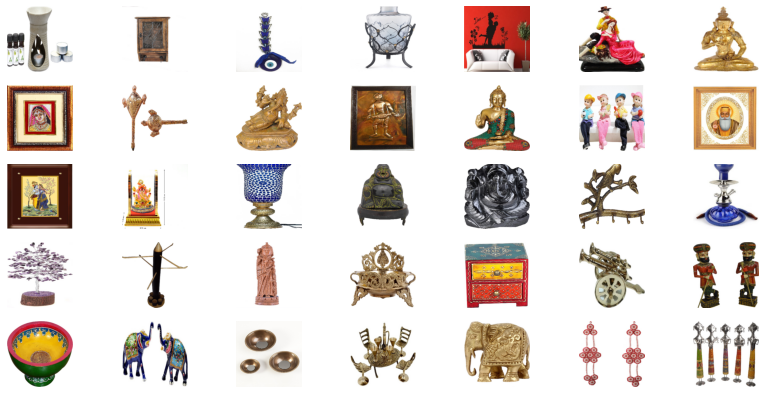


 Category Home Furnishing 
21 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ...""]",d4684dcdc759dd9cdf41504698d737d8.jpg,SANTOSH ROYAL FASHION,4,Home Furnishing
4,key feature jaipur print cotton floral king sized double bedsheet cotton jaipur print cotton floral king sized double bedsheet bed sheet pillow cover white price r nice bed sheet made cotton give comfort bed sheet hand printed bedsheet give nice look room fast colour good quality give bedsheet long life. specification jaipur print cotton floral king sized double bedsheet bed sheet pillow cover white general machine washable yes brand jaipur print type flat model name material cotton thread count model id fabric care machinewash bleach size king color white warranty waranty product manufacturing defect product exchange onle used returne origional packing dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm weight g fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package bed sheet pillow cover,BDSEJTHNGWVGWWQU,Jaipur Print Cotton Floral King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed...""]",6325b6870c54cd47be6ebfbffa620ec7.jpg,Jaipur Print,4,Home Furnishing
33,key feature santosh royal fashion cotton embroidered diwan set color multicolor content diwan sheet cm cushion cover cm santosh royal fashion cotton embroidered diwan set price r add oodles style home exciting range designer furniture furnishing decor item kitchenware promise deliver best quality product best prices. specification santosh ro

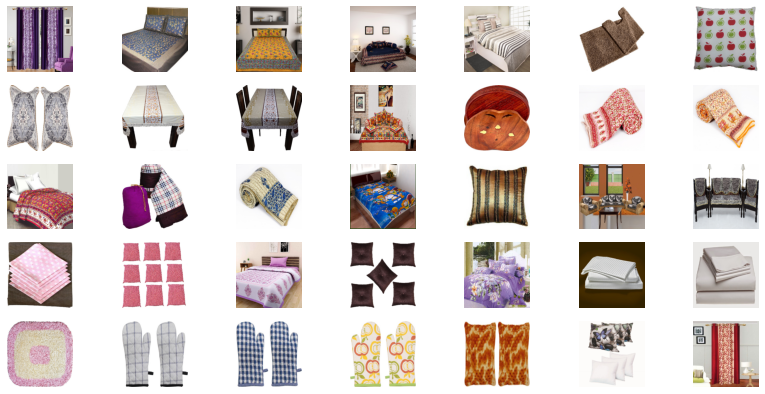


 Category Kitchen & Dining 
21 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
37,key feature dungri india craft jug glass set jug height- inch dia inch depth inch width inch capacity ml weight gram dungri india craft jug glass set copper price r copper utensil serving copper ware helped prevent spread disease many test showed bacteria copper alloy surface greater copper content eliminated within hour exposure according research southampton university u.k. mrsa microbe remain alive stainless steel surface three day whereas microbe copper surface eliminated within minute copper serving ware preferred durable excellent characteristic ageless use copper bear testimony myriad virtue everlasting appeal therapeutic value handed u age fact water stored copper ware virtually elixir life purified help regulate digestion cardiac order basis good health practiced ayurveda rishits old vedic time care tip clean copperware hand avoid dishwasher detergent cause oxidation leading permanat damage use solution equal quantity vinegar lemon juice salt diluted water time n't use regularly avoid scratchy cleaner like steel wool simple soft cleaning liquid soap base hot water soft washing cloth best daily use. specification dungri india craft jug glass set copper general brand dungri india craft number glass model number type jug glass set glass shape tumbler material copper capacity per glass ml jug capacity l color gold dimension jug height mm glass diameter mm jug depth mm dimension glass dia '' height '' capacity ml weight gram box jug glass set additional feature microwave safe care instruction better washing result wash pitambari cleaning power,JGTECTXNJJFCUCJK,Dungri India Craft Ducjug010-ducgl012-2 Jug Glass Set,"[""Kitchen & Dining >> Tableware & Cutlery >> Jug, Glass & Tray Sets >> Dungri India Craft Jug, Glass & Tray Sets >> Dungri India Craft Ducjug010-ducgl012-2 Jug Glas...""]",e9420e9483f16db81c64dddf99f34841.jpg,Dungri India Craft,5,Kitchen & Dining
38,key feature bft w led bulb pack bulb bft w led bulb white price r introducing new technology led lighting led filament best suited chandelier table lamp light fixture general spread light specification bft w led bulb white general brand bft model number body design feature material glass bulb base lighting feature light color white bulb type led lumen power feature power consumption w box sale package bulb pack,BLBEJR23J2CTPFAU,BFT 6 W LED Bulb,"[""Kitchen & Dining >> Lighting >> Bulbs >> BFT Bulbs >> BFT 6 W LED Bulb (White)""]",a3dea07b2f7bf48276d32513091be717.jpg,BFT,5,Kitchen & Dining
44,key feature akup i-loves-music ceramic mug pack mug akup i-loves-music ceramic mug ml price r akup ceramic coffee mug give best quality printed mug gift loved one provide good quality product packing coffee mug made ceramic clay volume capacity buy make moment unforgettable forever specification product dimension mug height cm diameter cm item type coffee mug color multi-color material clay finish glossy specialty lovely style wash care remove dirt using soft fabric clean wipe moist cloth disclaimer fine design pattern color tone product may vary slightly shown image however would compromise quality brand akup design co specification akup i-loves-music ceramic mug ml general type mug mug capacity ml material ceramic freezer safe yes microwave safe dimension diameter mm weight g height mm depth mm box sale package mug,MUGEGZUHVZ4Y85DV,AKUP i-loves-music Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> AKUP Coffee Mugs >> AKUP i-loves-music Ceramic Mug (300 ml)""]",8050d31bffe6827c804b8222338aafb2.jpg,AKUP,5,Kitchen & Dining
45,key feature akup i-love-my-mom ceramic mug pack mug akup i-love-my-mom ceramic mug ml price r akup ceramic coffee mug give best quality printed mug gift loved one provide good quality product packing coffee mug made ceramic clay volume capacity buy make moment unforgettable forever specification product dimension mug height cm diameter cm item type coffee mug color multi-c

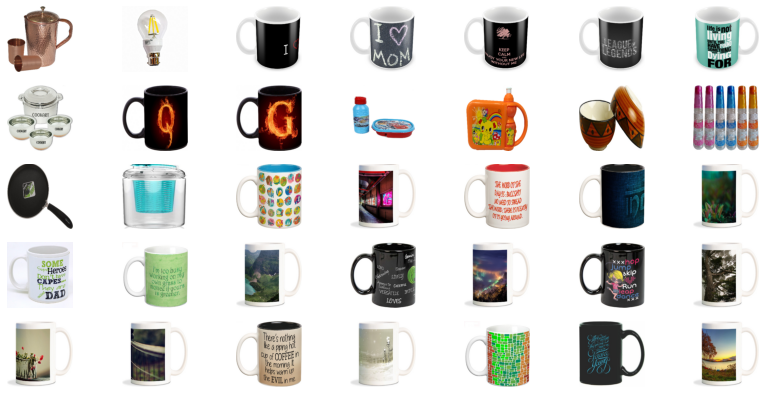


 Category Watches 
21 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ
5,maserati time analog watch boy buy maserati time analog watch boy online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATEAYAHJ8CUCAYM,Maserati Time R8851116001 Analog Watch - For Boys,"[""Watches >> Wrist Watches >> Maserati Time Wrist Watches""]",893aa5ed55f7cff2eccea7758d7a86bd.jpg,nan,6,Watches
6,camerii elegance analog watch men boy buy camerii elegance analog watch men boy online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATE6Y6D2MZHWGBZ,"Camerii WM64 Elegance Analog Watch - For Men, Boys","[""Watches >> Wrist Watches >> Camerii Wrist Watches""]",f355cc1ccb08bd0d283ed979b7ee7515.jpg,nan,6,Watches
7,star analog watch boy price r whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest,WATECFFVGFZPAD3D,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,"[""Watches >> Wrist Watches >> T STAR Wrist Watches""]",dd0e3470a7e6ed76fd69c2da27721041.jpg,nan,6,Watches
8,alfajr youth digital watch men boy buy alfajr youth digital watch men boy online india flipkart.com azan time city around world prayer reminder qibla direction hijri gregorian calnedars qur'an bookmark daily alrams great discount genuine product day replacement guarantee free shipping cash delivery,WATECHFU4QGFQEJG,"Alfajr WY16B Youth Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Alfajr Wrist Watches""]",41384da51732c0b4df3de8f395714fbb.jpg,nan,6,Watches
9,tag heuer formula analog watch boy men buy tag heuer formula analog watch boy men online india flipkart.com swiss-made quartz movement scratch resistant sapphire crystal glass water resistant metre feature chronograph great discount genuine product day replacement guarantee free shipping cash delivery,WATEA6UGFGKZKDJC,"TAG Heuer CAU1116.BA0858 Formula 1 Analog Watch - For Boys, Men","[""Watches >> Wrist Watches >> TAG Heuer Wrist Watches""]",710ed5f2393a4b9e8823aa0029f71f93.jpg,nan,6,Watches
10,calibro analog-digital watch men boy price r calibro present mtg black dial round watch fashionable watch mtg add style statement brand known usage quality material making appealing watch understands need youth well able present wide range watch customer variety design style youthful approach well executed brand get one see brilliantly lead brand style finish everything else matter calibro present mtg black dial round watch fashionable watch mtg add style statement brand known usage quality material making appealing watch understands need youth well able present wide range watch customer variety design style youthful approach well executed brand get one see brilliantly lead brand style finish everything else matter,WATECGPSDSFRHUSY,"Calibro SW-125 Analog-Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Calibro Wrist Watches""]",920154acbe49d3202ed7d2ed2df1ea13.jpg,nan,6,Watches
11,cartier analog watch boy men buy cartier analog watch boy men online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATEAK8SE2RUK7GM,"Cartier W6701005 Analog Watch - For Boys, Men","[""Watches >> Wrist Watches >> Cartier Wrist Watches""]",08452abdadb3db1e686b94a9c52fc7b6.jpg,nan,6,Watches
12,lois caron analog watch boy men buy lois caron analog watch boy men online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATED53FKKH4S8E4,"Lois Caron LCS-4032 Analog Watch - For Boys, Men","[""Watches >> Wrist W

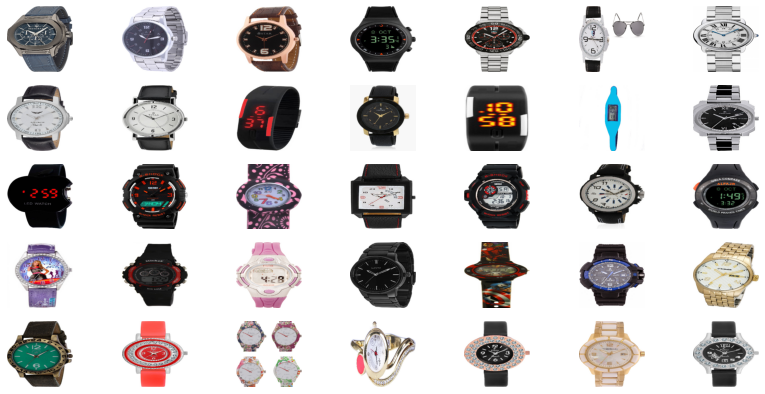

In [24]:
# Display images for each category

nrows, ncols = 5, 7

for j in range(N_CATEG):
    df = data1.loc[data1['label_categ'] == CATEGS[j]]
    print(nl, 'Category', CATEGS[j])
    mydisplay(df.head(ncols*3))
    
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols, int(1.5*nrows))) 
    ax = np.ravel(ax) 
    for i in range(nrows*ncols):
        image = load_img(PATH_IMAGES + df.iloc[i]['image'], target_size=(300, 300, 3)) 
        ax[i].imshow(img_to_array(image)/255)
        ax[i].axis('off') 
    #plt.tight_layout()
    plt.show()

    
# raise False


# VIII. Words embeddings


## VIII.1 Bag of Words (count & tf-idf)

First 10 feature_names: 
 ['aapno' 'able' 'absorbent' 'abstract' 'ac' 'accessory' 'according' 'across' 'act' 'actual']
size: 1415 

  (0, 3)	0.181
  (0, 36)	0.072
  (0, 45)	0.072
  (0, 46)	0.062
  (0, 51)	0.064
  (0, 77)	0.069
  (0, 108)	0.06
  (0, 129)	0.04
  (0, 140)	0.123
  (0, 141)	0.054
  (0, 248)	0.059
  (0, 249)	0.032
  (0, 278)	0.067
  (0, 287)	0.584
  (0, 324)	0.064
  (0, 325)	0.043
  (0, 342)	0.032
  (0, 359)	0.273
  (0, 361)	0.143
  (0, 385)	0.262
  (0, 386)	0.099
  (0, 395)	0.066
  (0, 404)	0.069
  (0, 410)	0.072
  (0, 430)	0.325
  :	:
  (0, 792)	0.064
  (0, 797)	0.064
  (0, 800)	0.113
  (0, 808)	0.152
  (0, 817)	0.037
  (0, 942)	0.3
  (0, 968)	0.043
  (0, 1002)	0.036
  (0, 1020)	0.072
  (0, 1065)	0.057
  (0, 1066)	0.067
  (0, 1071)	0.097
  (0, 1135)	0.072
  (0, 1167)	0.072
  (0, 1179)	0.072
  (0, 1184)	0.051
  (0, 1222)	0.038
  (0, 1229)	0.069
  (0, 1237)	0.053
  (0, 1268)	0.072
  (0, 1270)	0.126
  (0, 1355)	0.067
  (0, 1379)	0.066
  (0, 1390)	0.072
  (0, 1400)	0.06


 Dat

(1050, 1415)

 ARI : 0.55 ( time : 16.0 s )


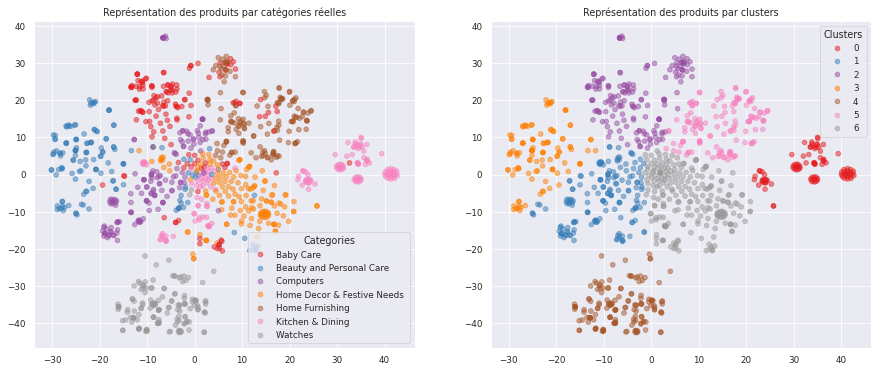

49 lines


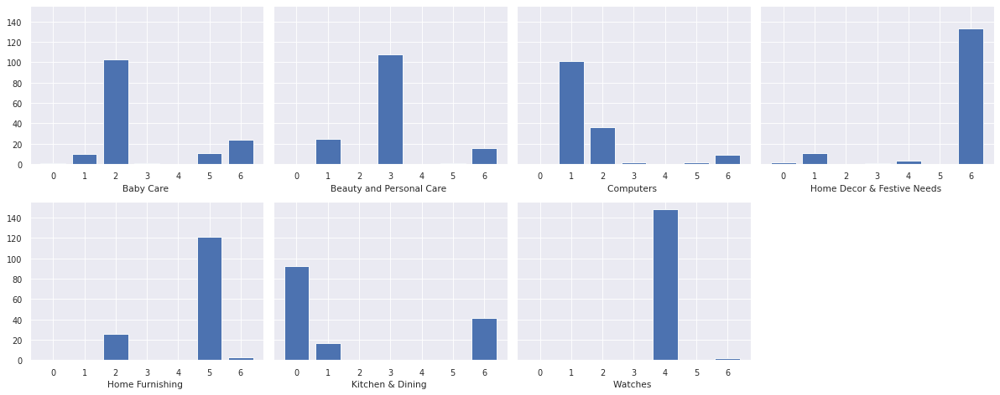

[[  1  10 103   1   0  11  24]
 [  0  25   0 108   0   1  16]
 [  0 101  36   2   0   2   9]
 [  2  11   0   1   3   0 133]
 [  0   0  26   0   0 121   3]
 [ 92  17   0   0   0   0  41]
 [  0   0   0   0 148   0   2]]

 Correspondance des clusters :  [5 2 0 1 6 4 3] 

Change the predicted classes id to correspond to true classes... 

Confusion matrix: 
 [[103   1  10  24  11   1   0]
 [  0 108  25  16   1   0   0]
 [ 36   2 101   9   2   0   0]
 [  0   1  11 133   0   2   3]
 [ 26   0   0   3 121   0   0]
 [  0   0  17  41   0  92   0]
 [  0   0   0   2   0   0 148]] 

Classification report: 
               precision    recall  f1-score   support

           0       0.62      0.69      0.65       150
           1       0.96      0.72      0.82       150
           2       0.62      0.67      0.64       150
           3       0.58      0.89      0.70       150
           4       0.90      0.81      0.85       150
           5       0.97      0.61      0.75       150
           6       0

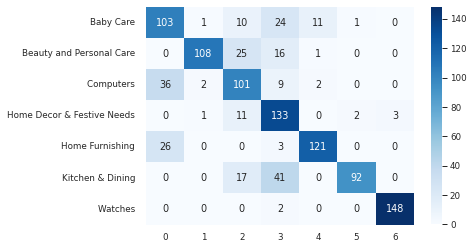



 *** Products which are Baby Care  but predicted as Home Decor & Festive Needs  : *** 


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,5
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,2
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,2
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASH

5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,2
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,2
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care,2
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care,2
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,6


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
28,vizion sport series digital watch boy girl price r brand vizion sport series watch year manufacturer warranty digital display automatic movement metal case solid body dial shape round dial strap material silicone strap water resistant night display cold backlight daily alarm hour minute second date week display hour format attractive brand packaging- tuff plastic box note case non-receipt warranty card please intimate u within hour disclaimer product color may slightly vary due photographic lighting source monitor setting image enlarged better viewing brand vizion sport series watch year manufacturer warranty digital display automatic movement metal case solid body dial shape round dial strap material silicone strap water resistant night display cold backlight daily alarm hour minute second date week display hour format attractive brand packaging- tuff plastic box note case non-receipt warranty card please intimate u within hour disclaimer product color may slightly vary due photographic lighting source monitor setting image enlarged better viewing,WATECSW5DJ3UBZYT,"Vizion 8502-7PURPLE Sports Series Digital Watch - For Boys, Girls","[""Watches >> Wrist Watches >> Vizion Wrist Watches""]",b52073e7ed9c00c4108cae4eb0c49c1a.jpg,nan,6,Watches,6
37,key feature dungri india craft jug glass set jug height- inch dia inch depth inch width inch capacity ml weight gram dungri india craft jug glass set copper price r copper utensil serving copper ware helped prevent spread disease many test showed bacteria copper alloy surface greater copper content eliminated within hour exposure according research southampton university u.k. mrsa microbe remain alive stainless steel surface three day whereas microbe copper surface eliminated within minute copper serving ware preferred durable excellent characteristic ageless use copper bear testimony myriad virtue everlasting appeal therapeutic value handed u age fact water stored copper ware virtually elixir life purified help regulate digestion cardiac order basis good health practiced ayurveda rishits old vedic time care tip clean copperware hand avoid dishwasher detergent cause oxidation leading permanat damage use solution equal quantity vinegar lemon juice salt diluted water time n't use regularly avoid scratchy cleaner like steel wool simple soft cleaning liquid soap base hot water soft washing cloth best daily use. specification dungri india craft jug glass set copper general brand dungri india craft number glass model number type jug glass set glass shape tumbler material copper capacity per glass ml jug capacity l color gold dimension jug height mm glass diameter mm jug depth mm dimension glass dia '' height '' capacity ml weight gram box jug glass set additional feature microwave safe care instruction better washing result wash pitambari cleaning power,JGTECTXNJJFCUCJK,Dungri India Craft Ducjug010-ducgl012-2 Jug Glass Set,"[""Kitchen & Dining >> Tableware & Cutlery >> Jug, Glass & Tray Sets >> Dungri India Craft Jug, Glass & Tray Sets >> Dungri India Craft Ducjug010-ducgl012-2 Jug Glas...""]",e9420e9483f16db81c64dddf99f34841.jpg,Dungri India Craft,5,Kitchen & Dining,6
52,key feature cookart elegant s.s. handi hot pot pack casserole set pack cook serve casserole cookart elegant s.s. handi hot pot pack casserole set ml l price r cookart introduces perfect fusion style durability piece stainless steel casserole handi set perfect addition kitchen set made finest quality stainless steel material high quality material also take care health hygiene handi capacity ml l specification cookart elegant s.s. handi hot pot pack casserole set ml l care use feature microwave safe general brand cookart casserole type cook serve casserole model number type casserole set model name elegant s.s. handi hot pot material stainless steel capacity ml l color silver body design feature lid included yes non-stick coating box s

10 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,6
82,specification chinmay kid printed cotton padded mosquito net multicolour convenience feature washable yes general brand chinmay kid model name printed cotton padded capacity person model id color multicolour dimension weight g height inch width inch box sale package mosquito net,MNTEGKSZD2ZWUBZK,CHINMAY KIDS Printed Cotton Padded Mosquito Net,"[""Baby Care >> Baby Bedding >> Baby Mosquito Nets >> CHINMAY KIDS Baby Mosquito Nets >> CHINMAY KIDS Printed Cotton Padded Mosquito Net ...""]",601817defaff9d0e30e1b72f96d3975f.jpg,CHINMAY KIDS,0,Baby Care,6
426,specification basra uepgrn green changing table general brand basra model number shade green model name uepgrn color green body design feature changing pad included safety strap included material plastic wheel included dimension weight kg height cm width cm depth cm box changing table additional feature feature easily use,DSEEHETVWRX9FZDT,BASRA uepgrn Green Changing Table,"[""Baby Care >> Diapering & Potty Training >> Changing Tables >> BASRA Changing Tables >> BASRA uepgrn Green Changing Table""]",70461caa9038cfa34d109ea056d57f5a.jpg,BASRA,0,Baby Care,6
428,specification graco literider click connect � marco multicolor general foldable yes age group year type stroller ideal boy girl weight supported kg wheel feature wheeled bottom yes wheel feature lockable wheel type swivel fixed dimension weight kg height inch width inch depth inch safety feature locking system yes box number content sale package sale package stroller body feature storage basket yes recline setting position number cup holder cup holder yes material lightweight aluminium leg rest type adjustable canopy yes,STREDF58JH3GQZF9,Graco LiteRider Click Connect � Marco,"[""Baby Care >> Strollers & Activity Gear >> Strollers & Prams >> Graco Strollers & Prams >> Graco LiteRider Click Connect � Marco (Multicolor)""]",dd5d6f0649f40d49791bbd5c00758e2f.jpg,Graco,0,Baby Care,6
612,specification cheeky chompers neckerchew simple classic sky general brand cheeky chompers loop type knot button material cotton model name neckerchew simple classic ideal boy girl model id color sky design strip imprint box number content sale package sale package bib,BIBEJCBYFTQDKZNT,Cheeky Chompers The Neckerchew - Simple Classic,"[""Baby Care >> Feeding & Nursing >> Bibs & Hankies >> Bibs >> Cheeky Chompers Bibs >> Cheeky Chompers The Neckerchew - Simple Classic ...""]",44218245b37581c534038cc27d081093.jpg,Cheeky Chompers,0,Baby Care,6
613,specification piyo piyo four stage waterproof bib yellow general brand piyo piyo loop type velcro material plastic model name four stage waterproof bib ideal boy girl model id cp color yellow design animal box number content sale package sale package bib,BIBEJCBYSWXBFFJ9,Piyo Piyo Four Stage Waterproof Bib,"[""Baby Care >> Feeding & Nursing >> Bibs & Hankies >> Bibs >> Piyo Piyo Bibs >> Piyo Piyo Four Stage Waterproof Bib (Yellow)""]",4e03d4e81e6a876f512536f6a57c053e.jpg,Piyo Piyo,0,Baby Care,6
655,buy wood beauty wood photo frame online wood beauty wood photo frame best price free shipping cash delivery genuine product day replacement guarantee,PHFEEDJREU4HHEJG,Wood Beauty Wood Photo Frame,"[""Baby Care >> Baby & Kids Gifts >> Photo Frames >> Wood Beauty Photo Frames""]",f79c9db3abd7faca714c92aeba9b6728.

24


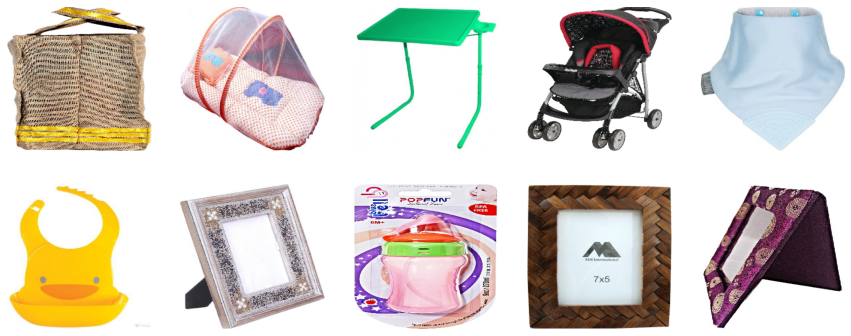

In [25]:
# Bag of words (count or tf-idf)



bow = 'tfidf'  # 'count' , 'tfidf'
data2 = data1.copy()

if bow == 'count':
    vectorizer = CountVectorizer(max_df=159, 
                                 min_df=3, 
                                 binary=False)  
                                     # 0/1 instead of count of words 
    # don't use scikit-learn preprocessing as manually done
    # can choose n-grams or could use the parameters:  max_df and min_df  
    #   to filter words that are too frequent or too rare
    # binary=False to get count of words and True to get yes/no
elif bow == 'tfidf':
    vectorizer = TfidfVectorizer(max_df=159, min_df=3)
else:
    print('Error in choice of bag of words method')
    raise False

description_count = vectorizer.fit_transform(data2['description'])

print('First 10 feature_names:', nl, 
      vectorizer.get_feature_names_out()[:10])
print('size:', len(vectorizer.get_feature_names_out()), nl)

print(round(description_count[0], 3)) #, end=' - ', sep=' * ')
print(nl*2, 'Dataset size:', description_count.shape, nl)
vv = vectorizer.vocabulary_  
print('First 10 vocabulary items (word, indice):', nl, 
      list(vv.items())[:10], nl)


# To get the most and least common words in all docs:   
sum_words = description_count.sum(axis=0)
# words_freq = []
words_freq = [(word, sum_words[0, idx]) for word, idx in vv.items()]
print(nl, 'Most common words:')
print(sorted(words_freq, key = lambda x: round(x[1], 2), 
             reverse=True)[:100], nl)
print(nl, 'Least common words:')
print(sorted(words_freq, key = lambda x: round(x[1], 2), 
             reverse=False)[:100], nl)



# Words which appears n times with 'count'
if bow == 'count':
    occ_n = {}
    for i in range(1, 300):
        occ_n[i] = len([x for x in words_freq if x[1] == i])
    print('(count, cooresponding nb of words)')
    print(nl, list(occ_n.items())[:20], nl)
    print(nl, [(i, v) for i, v in occ_n.items() if i!=0][-20:], nl)

    # Plot the number of occurences for count of words
    fig, ax = plt.subplots(figsize=(18, 7)) 
    ax.bar(occ_n.keys(), occ_n.values(), color='g')
    plt.yscale('log')
    plt.show()

    # Explore words by count
    for i in [2,3,4,5]:
        print(nl, i, ':', [x[0] for x in words_freq if x[1] == i][:100])


print(nl, 'Nb of words ignored in vectorizaton' 
      + '(stopwords, too common, too rare):',
      len(vectorizer.stop_words_), nl, 
      [el for (el, _) in zip(vectorizer.stop_words_, range(30))], nl*2)
    
    

# Transform the scipy sparse matrix to a dataframe
description_count = pd.DataFrame(description_count.todense(), 
                                 columns=vectorizer.get_feature_names_out())
mydisplay(description_count.head(5), gen_width=50)
print(description_count.shape) 

dim3 = False   #0.55 with dim3=false and perplex=40 but 0.45 for p=39!
ARI, X_tsne, labels = ARI_fct(description_count, data2['label'], 
                              perplex=40, dim3=dim3)
TSNE_visu_fct(X_tsne, data2['label'], labels, ARI, dim3=dim3)

results_analysis(data2['label'], labels, data2)
show_errors(CATEGS[0], 6, labels, data2)
    

## VIII.2 Word2Vec

[['key', 'feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'cm', 'height', 'pack', 'price', 'r', 'curtain', 'enhances', 'look', 'interiors.this', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric.it', 'feature', 'eyelet', 'style', 'stitch', 'metal', 'ring.it', 'make', 'room', 'environment', 'romantic', 'loving.this', 'curtain', 'ant-', 'wrinkle', 'anti', 'shrinkage', 'elegant', 'apparance.give', 'home', 'bright', 'modernistic', 'appeal', 'design', 'surreal', 'attention', 'sure', 'steal', 'heart', 'contemporary', 'eyelet', 'valance', 'curtain', 'slide', 'smoothly', 'draw', 'apart', 'first', 'thing', 'morning', 'welcome', 'bright', 'sun', 'ray', 'want', 'wish', 'good', 'morning', 'whole', 'world', 'draw', 'close', 'evening', 'create', 'special', 'moment', 'joyous', 'beauty', 'given', 'soothing', 'print', 'bring', 'home', 'elegant', 'curtai

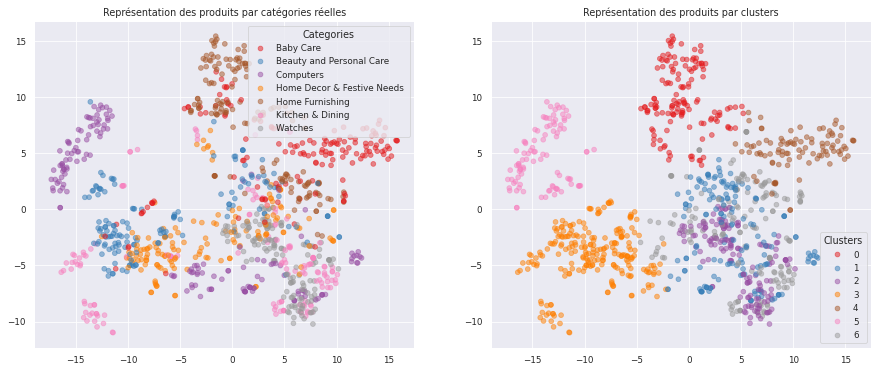

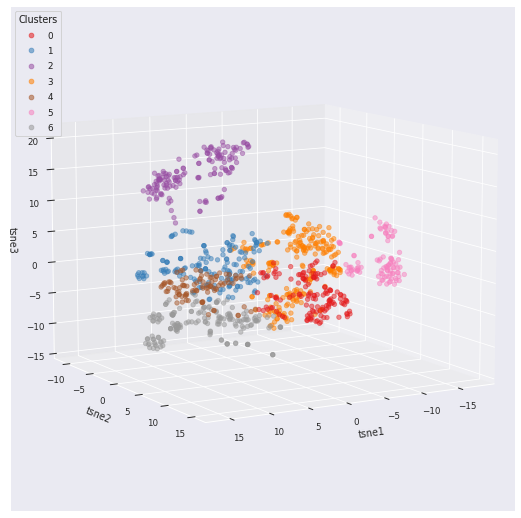

49 lines


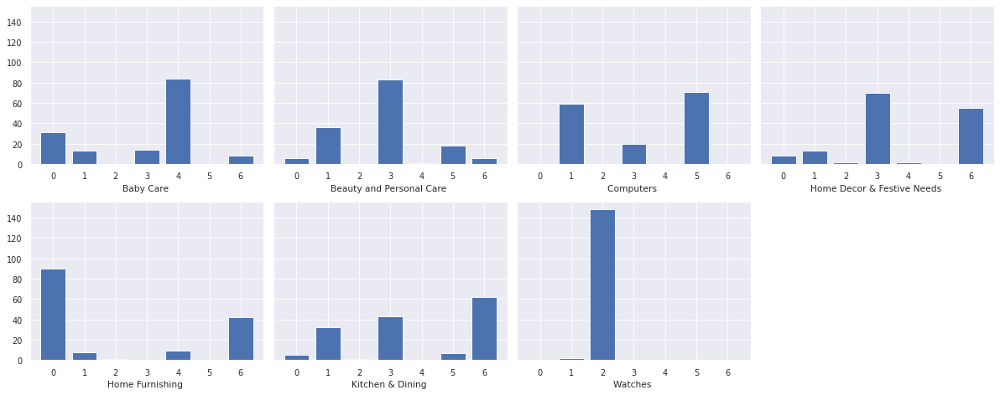

[[ 31  13   0  14  84   0   8]
 [  6  36   0  83   1  18   6]
 [  0  59   0  20   0  71   0]
 [  8  13   2  70   2   0  55]
 [ 90   8   1   0   9   0  42]
 [  5  32   1  43   0   7  62]
 [  0   2 148   0   0   0   0]]

 Correspondance des clusters :  [4 2 6 1 0 2 5] 

Change the predicted classes id to correspond to true classes... 

Confusion matrix: 
 [[ 84  14  13   0  31   8   0]
 [  1  83  54   0   6   6   0]
 [  0  20 130   0   0   0   0]
 [  2  70  13   0   8  55   2]
 [  9   0   8   0  90  42   1]
 [  0  43  39   0   5  62   1]
 [  0   0   2   0   0   0 148]] 

Classification report: 
               precision    recall  f1-score   support

           0       0.88      0.56      0.68       150
           1       0.36      0.55      0.44       150
           2       0.50      0.87      0.64       150
           3       0.00      0.00      0.00       150
           4       0.64      0.60      0.62       150
           5       0.36      0.41      0.38       150
           6       0

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


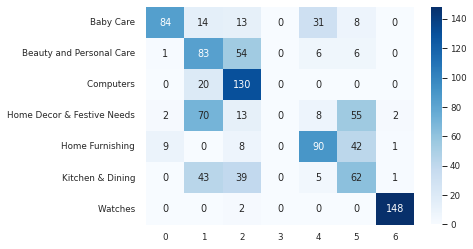



 *** Products which are Baby Care  but predicted as Kitchen & Dining  : *** 


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,6
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,4
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,4
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASH

5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,4
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,4
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care,4
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care,4
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,1


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,6
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ...""]",d4684dcdc759dd9cdf41504698d737d8.jpg,SANTOSH ROYAL FASHION,4,Home Furnishing,6
4,key feature jaipur print cotton floral king sized double bedsheet cotton jaipur print cotton floral king sized double bedsheet bed sheet pillow cover white price r nice bed sheet made cotton give comfort bed sheet hand printed bedsheet give nice look room fast colour good quality give bedsheet long life. specification jaipur print cotton floral king sized double bedsheet bed sheet pillow cover white general machine washable yes brand jaipur print type flat model name material cotton thread count model id fabric care machinewash bleach size king color white warranty waranty product manufacturing defect product exchange onle used returne origional packing dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm weight g fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package bed sheet pillow cover,BDSEJTHNGWVGWWQU,Jaipur Print Cotton Floral King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed...""]",6325b6870c54cd47be6ebfbffa620ec7.jpg,Jaipur Print,4,Home Furnishing,6
33,key feature santosh royal fashion cotton embroidered diwan set color multicolor content diwan sheet cm cushion cover cm santosh royal fashion cotton embroidered diwan set price r add oodles style home exciting range designer furniture furnishing decor item kitchenware promise deliver best quality product best prices. specific

8 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
681,cocovey metal photo frame photo size photo price r add traditional stylish look house cocovey handcrafted photo frame beautifully crafted photo frame made brass traditional tribal cultural design unique brings style home indian home getting stylish time excitement towards interior home décor.our company effort perceive excitement help choose favorite wide range painstakingly pursued beautiful handicraft item find way skilled hand craftsman directly precious place abode add traditional stylish look house cocovey handcrafted photo frame beautifully crafted photo frame made brass traditional tribal cultural design unique brings style home indian home getting stylish time excitement towards interior home décor.our company effort perceive excitement help choose favorite wide range painstakingly pursued beautiful handicraft item find way skilled hand craftsman directly precious place abode,PHFEBZ2GBSK3U43Z,Cocovey Metal Photo Frame,"[""Baby Care >> Baby & Kids Gifts >> Photo Frames >> Cocovey Photo Frames""]",fd10586bf7f01bc57e0c5364d4b2c3f7.jpg,nan,0,Baby Care,6
904,key feature relaxfeel floral single dohar white pack color white height cm cm relaxfeel floral single dohar white ac dohar price r good collection dohars good compaingns summer winter well high quality gurantee extremely soft warm perfect everyday use dohars give luxarious elegant look easy carry travelling easy storage season dohars used ac room also. specification relaxfeel floral single dohar white ac dohar general brand relaxfeel type dohar hand washable yes model id single dohar color white design floral machine washable yes suitable a/c room inner material polycotton model name single dohar ideal baby boy baby girl outer material ployester size single dimension weight g length inch cm width inch cm depth cm box number content sale package,BLAEGZRYZX6YZUZN,Relaxfeel Floral Single Dohar White,"[""Baby Care >> Baby Bedding >> Baby Blankets >> Relaxfeel Baby Blankets >> Relaxfeel Floral Single Dohar White (AC Dohar)""]",a541b3aba326d7749b4c086c3cea9273.jpg,Relaxfeel,0,Baby Care,6
967,key feature mahadev handicraft cotton cartoon double bedsheet brand mahadev handicraft sheet length cm sheet width cm specification mahadev handicraft cotton cartoon double bedsheet bedsheet pillow cover multicolor general brand mahadev handicraft machine washable yes type flat material cotton model name cartoon thread count ideal baby boy baby girl model id character angry bird color multicolor size double dimension fitted sheet width na cm fitted sheet depth na cm fitted sheet length na cm flat sheet depth cm box number content sale package sale package bedsheet pillow cover additional feature beauty bedsheet,BDSEGUPCQZVXEPAF,Mahadev Handicrafts Cotton Cartoon Double Bedsheet,"[""Baby Care >> Baby Bedding >> Baby Bedsheets >> Mahadev Handicrafts Baby Bedsheets >> Mahadev Handicrafts Cotton Cartoon Double Bedshe...""]",d627a270302d23eef773d05ad01fd03c.jpg,Mahadev Handicrafts,0,Baby Care,6
968,key feature sparkling cotton checkered double bedsheet best fit -large size double bed ft x ft thread tc package double bedsheet pillow cover sparkling cotton checkered double bedsheet double bedsheet pillow cover multicolor price r day ’ want socialise curl bed read watch favourite tv show day jazz bedroom décor spreading double bedsheet sparkling pep mood print love blend abstract floral print give bedsheet appealing look cotton ’ want leave bedroom anymore bedsheet two pillow cover made cotton help relax body mind soon hit bed. specification sparkling cotton checkered double bedsheet double bedsheet pillow cover multicolor general brand sparkling machine washable yes type flat material cotton model name ideal boy girl model id color multicolor size double fabric care first wash separately dark color wash separately cold machine wash use strong detergent bleach tumble dry iron print soak long time dry s

8


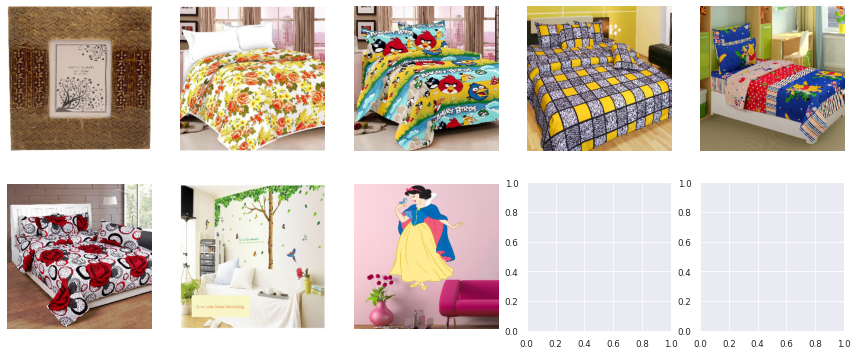

In [26]:
# Word2Vec 
# Average (via NN) of words embeddings is used for sentence embeddings


data3 = data1.copy()


all_description = []  # must be a list of list of words/tokens
# for i in range(0, len(data3)): 
#     all_description.append(data3.loc[i, 'description'].split(' '))
all_description = data3['description'].str.split(' ').to_list()

# all_description = [row.split() for row in data3['description']] 
# all_description = [s for row in data3['description'] 
#                    for s in row.split()]
print(all_description[:2])


sentences = all_description
w2v_size = 80  # from 20 to 60, ARI increases only by 0.01 (small dataset)
w2v_window = 7
w2v_min_count = 3  # if !=1 then word embedding rate < 1
# w2v_epochs=100
maxlen = 366//4  # longest sentence=366


# Création et entraînement du modèle Word2Vec

print(nl, "Build & train Word2Vec model ...", nl)
print('CPU count:', multiprocessing.cpu_count())

# Initialize a Word2Vec model
w2v_model = Word2Vec(   
            min_count=w2v_min_count,  # Ignore words appearing less than this
            vector_size=w2v_size,  # Dimensionality of word embeddings 
            sg=1,  # skipgrams method (better for small dataset?)
            window=w2v_window,  # Context window for words during training
            seed=SEED,
#             sample=0.28, #140/50000=0.003 remove words that appear more 
#             than 140 times in the corpus?
            workers=4)       # Number of epochs training over corpus

w2v_model.build_vocab(sentences, progress_per=10)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=20)
w2v_words = w2v_model.wv.index_to_key

print("Vocabulary size: %i" % len(w2v_words), nl)
print('First 10 words in vocabulary:', w2v_words[:10])  
print('Corpus count:', w2v_model.corpus_count, nl)

for index, word in enumerate(w2v_model.wv.index_to_key):
    if index == 15:
        break
    print(f"word #{index}/{len(w2v_model.wv.index_to_key)} is {word}")
    
    
# To test 'visually' the accuracy of the model
print(nl, 'Embedding for \'watch\':', nl, w2v_model.wv['watch'])  
print(nl, 'Most similar to \'watch\':', 
      w2v_model.wv.most_similar(positive='watch'), nl) 
#w2v_model.wv.similarity('bart', 'nelson')
#w2v_model.wv.doesnt_match(['jimbo', 'milhouse', 'kearney'])


# Préparation des sentences (tokenization)

# By default, all punctuation is removed, turning the texts into 
# space-separated sequences of words (words maybe include the ' character). 
# These sequences are then split into lists of tokens. They will then be 
# indexed or vectorized.
# Keras tokenizer (take a list of sentences and create a list of list of
#  tokens) keep the num_words most frequent words
# Better use layers.TextVectorization which works on tensors
tokenizer = Tokenizer() #num_words=2000)  #why 4k and not 2k voc?

# Updates internal vocabulary based on a list of texts
sentences = data3['description'].to_list()  
            # why better ARI if comment above line?
tokenizer.fit_on_texts(sentences)  

# texts_to_sequences: transforms each text in texts to a sequence of int.
# Only top num_words-1 most frequent words will be taken into account
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                            maxlen=maxlen, padding='post') 
#x_sentences used in predict
vocab_size = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % vocab_size, nl)
print("Number of unique words in x_sentences: %i" % len(x_sentences), nl)
print(x_sentences[:2])


# Création de la matrice d'embedding
i, j = 0, 0
embedding_matrix = np.zeros((vocab_size, w2v_size))
for word, idx in tokenizer.word_index.items():
    i +=1
    if word in w2v_words:  # from build_vocab ie count>min_count
        j +=1
        embedding_vector = w2v_model.wv[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector
print('i, j:', i, j)
print("Word embedding rate :", np.round(j/i,4), nl)
print("Embedding matrix:", embedding_matrix.shape, nl)
print(embedding_matrix[:2])  # for words



# Création du modèle
# It simply averages the word embeddings on each sentence (along maxlen)
# input = Input(shape=(len(x_sentences), maxlen), dtype='float64')
word_input = Input(shape=(maxlen, ), dtype='float64')  
word_embedding = Embedding(input_dim=vocab_size, 
                           output_dim=w2v_size, 
                           trainable=False,
                           weights=[embedding_matrix], 
                           input_length=maxlen
                          )(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input], word_vec)
embed_model.summary()


embeddings = embed_model.predict(x_sentences)
print(embeddings.shape, nl)
print(embeddings[:2])  # for sentences 

ARI, X_tsne, labels = ARI_fct(embeddings, 
                              data3['label'], 
                              perplex=40, 
                              dim3=True)
TSNE_visu_fct(X_tsne, data3['label'], labels, ARI, dim3=True)

results_analysis(data3['label'], labels, data3)
show_errors(CATEGS[0], 6, labels, data3)


# # To load a pretrained model
# import gensim.downloader as api
# model_glove_twitter = api.load("glove-twitter-25") 
#     #return_path=True to get filepath
# print(api.info())

# # To load a corpus 
# corpus = api.load('text8')  
#     # download the corpus and return it opened as an iterable
# model = Word2Vec(corpus, size=150, window=10, min_count=2)  
#     # train a model from the corpus
# model.most_similar("car")


# raise 0


## VIII.3 Transformers models

2.6.3 

Num GPUs Available:  1
True 



Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.37G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

['key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box n

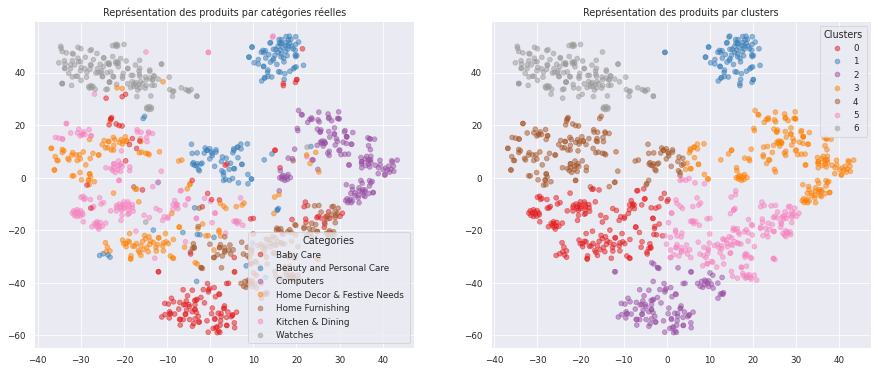

49 lines


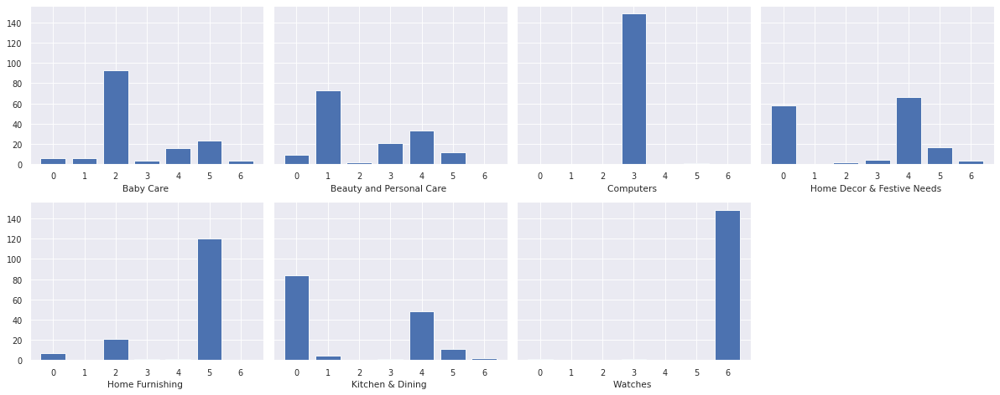

[[  6   6  93   3  16  23   3]
 [  9  73   2  21  33  12   0]
 [  0   0   0 149   0   1   0]
 [ 58   0   2   4  66  17   3]
 [  7   0  21   1   1 120   0]
 [ 84   4   0   1  48  11   2]
 [  1   0   0   1   0   0 148]]

 Correspondance des clusters :  [5 1 0 2 3 4 6] 

Change the predicted classes id to correspond to true classes... 

Confusion matrix: 
 [[ 93   6   3  16  23   6   3]
 [  2  73  21  33  12   9   0]
 [  0   0 149   0   1   0   0]
 [  2   0   4  66  17  58   3]
 [ 21   0   1   1 120   7   0]
 [  0   4   1  48  11  84   2]
 [  0   0   1   0   0   1 148]] 

Classification report: 
               precision    recall  f1-score   support

           0       0.79      0.62      0.69       150
           1       0.88      0.49      0.63       150
           2       0.83      0.99      0.90       150
           3       0.40      0.44      0.42       150
           4       0.65      0.80      0.72       150
           5       0.51      0.56      0.53       150
           6       0

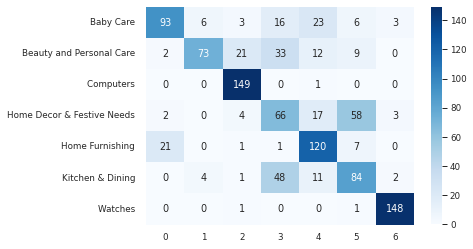



 *** Products which are Baby Care  but predicted as Watches  : *** 


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,5
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,2
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,3
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASH

5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,2
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,3
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care,2
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care,2
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,5


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
5,maserati time analog watch boy buy maserati time analog watch boy online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATEAYAHJ8CUCAYM,Maserati Time R8851116001 Analog Watch - For Boys,"[""Watches >> Wrist Watches >> Maserati Time Wrist Watches""]",893aa5ed55f7cff2eccea7758d7a86bd.jpg,nan,6,Watches,6
6,camerii elegance analog watch men boy buy camerii elegance analog watch men boy online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATE6Y6D2MZHWGBZ,"Camerii WM64 Elegance Analog Watch - For Men, Boys","[""Watches >> Wrist Watches >> Camerii Wrist Watches""]",f355cc1ccb08bd0d283ed979b7ee7515.jpg,nan,6,Watches,6
7,star analog watch boy price r whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest,WATECFFVGFZPAD3D,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,"[""Watches >> Wrist Watches >> T STAR Wrist Watches""]",dd0e3470a7e6ed76fd69c2da27721041.jpg,nan,6,Watches,6
8,alfajr youth digital watch men boy buy alfajr youth digital watch men boy online india flipkart.com azan time city around world prayer reminder qibla direction hijri gregorian calnedars qur'an bookmark daily alrams great discount genuine product day replacement guarantee free shipping cash delivery,WATECHFU4QGFQEJG,"Alfajr WY16B Youth Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Alfajr Wrist Watches""]",41384da51732c0b4df3de8f395714fbb.jpg,nan,6,Watches,6
9,tag heuer formula analog watch boy men buy tag heuer formula analog watch boy men online india flipkart.com swiss-made quartz movement scratch resistant sapphire crystal glass water resistant metre feature chronograph great discount genuine product day replacement guarantee free shipping cash delivery,WATEA6UGFGKZKDJC,"TAG Heuer CAU1116.BA0858 Formula 1 Analog Watch - For Boys, Men","[""Watches >> Wrist Watches >> TAG Heuer Wrist Watches""]",710ed5f2393a4b9e8823aa0029f71f93.jpg,nan,6,Watches,6


3 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
106,buy bestway x x sun shade inflatable play pool online bestway x x sun shade inflatable play pool best price free shipping cash delivery genuine product day replacement guarantee,IFPEEANZ88AYFQJJ,Bestway 1.47m x 1.47m x 1.22m/Play With Sun Shade Inflatable Play Pool,"[""Baby Care >> Furniture & Furnishings >> Inflatable Products >> Bestway Inflatable Products""]",184ecf07ca4e2872eaf53d2344a1e783.jpg,Bestway,0,Baby Care,6
666,portia polka print trendy cap buy multicolor portia polka print trendy cap r online india shop online apparel huge collection branded clothes flipkart.com,CAPEDKXZJYCYQANZ,Portia Polka Print Trendy Cap,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Accessories >> Caps >> Portia Caps""]",f9a8320c182841024f47ebcba284085a.jpg,nan,0,Baby Care,6
889,buy intex kid inflatable air chair online intex kid inflatable air chair best price free shipping cash delivery genuine product day replacement guarantee,IFPDFZMGZBEZ3KCZ,Intex Kids Inflatable Air Chair,"[""Baby Care >> Furniture & Furnishings >> Inflatable Products >> Intex Inflatable Products""]",b454f9f449c9dff58b90113ba984ea98.jpg,Intex,0,Baby Care,6


3


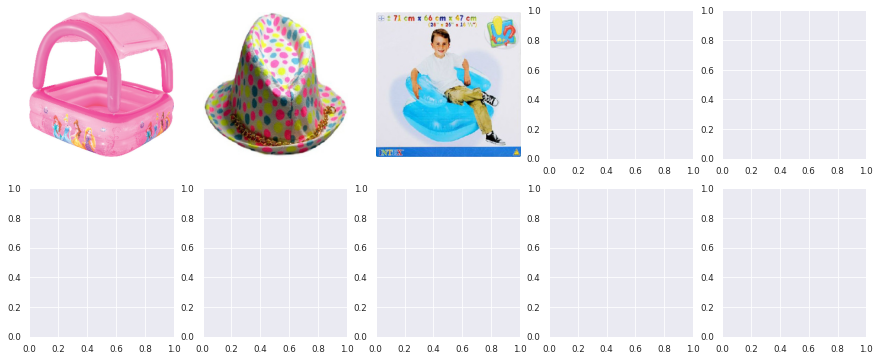

In [28]:

# Transformers like BERT, MPNET, ...



print(tf.__version__, nl)
print("Num GPUs Available: ", 
      len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda(), nl)


def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    """ Fonction de préparation des sentences."""
    
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:  
        # tokenize the sentences from the pretrained model embeddings
        bert_inp = bert_tokenizer.encode_plus(
                      sent,
                      add_special_tokens = True, # add [CLS], [SEP]
                      max_length = max_length,
                      padding='max_length', # add [PAD] tokens
                      return_attention_mask = True, 
                          # add attention mask to not focus on pad tokens 
                      return_token_type_ids=True, 
                      truncation=True,
                      return_tensors="tf")
        # As BERT can only accept/take as input only 512 tokens at a time,  
        # we must specify the truncation parameter to True. The add special 
        # tokens parameter is just for BERT to add tokens like the start, 
        # end, [SEP], and [CLS] tokens. Return_tensors = “tf” is just for
        # the tokenizer to return TF tensors
        # tokenizer.encode_plus() specifically returns a dictionary of 
        # values instead of just a list of values. Because 
        # tokenizer.encode_plus() can return many different types of 
        # information, like the attention_masks and token type ids, 
        # everything is returned in a dictionary format
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
#     vocabulary = bert_inp.get_vocab()
#     print(len(vocabulary), nl, list(vocabulary.keys())[100:120])
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    


def feature_BERT_fct(model, sentences, max_length, b_size, 
                     bert_tokenizer, mode='HF') :
    """Fonction de création des features."""
    
    if mode == 'SBERT':
        features_bert = model.encode(sentences)
        return features_bert, 0

    if mode == 'NOPRED':  
        # to use when no predict attribute but memory pb 
        # but this runs for xlnet base (but ari only 0.07! 
        # 0.17 if max_length=64 and memory error if =256)
        inputs = bert_tokenizer(sentences, max_length=max_length*2,
            truncation=True, return_tensors='tf', padding=True)   
            #pt is for pytorch, use tf!
        features_bert = model.generate(**inputs)
        return features_bert, 0    

    if mode == 'NOPRED2':  
        inputs = bert_tokenizer(sentences, max_length=max_length,
            truncation=True, return_tensors='pt', padding=True)
        features_bert = model(**inputs)
        return features_bert, 0  
    
    batch_size = b_size
    batch_size_pred = b_size
    # Initialize the tokenizer with a pretrained model
    time1 = time.time()
    vocabulary = bert_tokenizer.get_vocab()
    print(len(vocabulary), nl, list(vocabulary.keys())[2000:2040])

    # As a test, convert the string "granola bars" to 
    # tokenized vocabulary IDs
    granola_ids = bert_tokenizer.encode('granola bars')
    print(nl*2, 'granola_ids', granola_ids)
    print('type of granola_ids', type(granola_ids))
    # Convert the IDs to the actual vocabulary item
    # Notice how the subword unit (suffix) starts with "##" to
    #  indicate that it is part of the previous string
    print('granola_tokens', 
          bert_tokenizer.convert_ids_to_tokens(granola_ids), nl*2)
    
    # use CLS instead of mean? seems worse
    
    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = \
            bert_inp_fct(sentences[idx:idx+batch_size], 
                         bert_tokenizer, 
                         max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict(
                        [input_ids, attention_mask, token_type_ids], 
                        batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub  (not used here)
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((
                last_hidden_states_tot, last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1) 
#     features_bert = np.array(last_hidden_states_tot)[:, 0, :]  
#         #same result or worse
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
        
    return features_bert, last_hidden_states_tot




# BERT HuggingFace

max_length = 24  # 32: 0.44, 64: 0.32, 16: 0.43, 24: 0.48, 
batch_size = 150 # must divide 1050=7*3*5*5*2

# BERT (base)
mode = 'HF'
# model_type = 'bert-base-uncased'  
model_type = 'bert-large-uncased'  # 0.01 more than base for ari
model = TFAutoModel.from_pretrained(model_type)
tokenizer = AutoTokenizer.from_pretrained(model_type)  
        # equals BertTokenizer

# # Roberta (~Bert here)
# mode = 'HF'
# model_type = 'roberta-large'
# tokenizer = RobertaTokenizer.from_pretrained(model_type)
# model = TFRobertaModel.from_pretrained(model_type)

# # MPNET (2020, Microsoft China)  ---------- needs TPU. or use batch?
# #  takes the best of BERT and XLNET to get superior results
# mode = 'SBERT'  #https://www.sbert.net/docs/pretrained_models.html
# model_type = 'sentence-transformers/all-mpnet-base-v2'
# # model_type = 'flax-sentence-embeddings/all_datasets_v3_mpnet-base'  
#         # < v2 above
# # model_type = 'sentence-transformers/all-distilroberta-v1' # << mpnet
# tokenizer = None
# model = SentenceTransformer(model_type)

# # Distilbert (base)  (ari=0.04!)
# from transformers import AutoTokenizer, AutoModelForMaskedLM, 
# from transformers import AutoModelForSequenceClassification
# mode = 'NOPRED'
# model_type = 'distilbert-base-uncased-finetuned-sst-2-english'
# model = AutoModelForSequenceClassification.from_pretrained(model_type)
# tokenizer = AutoTokenizer.from_pretrained(model_type) 

# # model with no predict attribute 
# from transformers import AutoTokenizer, AutoModelWithLMHead
# mode = 'NOPRED'
# model_type = 't5-large'
# tokenizer = AutoTokenizer.from_pretrained(model_type)
# model = AutoModelWithLMHead.from_pretrained(model_type)

# # Models with no predict attributes
# from transformers import AutoTokenizer, AutoModelForCausalLM
# mode = 'NOPRED' 
# model_type = 'xlnet-base-cased'  
# model = AutoModelForCausalLM.from_pretrained(model_type)
# tokenizer = AutoTokenizer.from_pretrained(model_type) 

# # Deberta (memory pb even with TPU)
# from transformers import DebertaModel, DebertaTokenizer
# mode = 'NOPRED2'
# tokenizer = DebertaTokenizer.from_pretrained("microsoft/deberta-base")
# model = DebertaModel.from_pretrained("microsoft/deberta-base")



sentences = data1['description'].to_list()  
        # data1 gives better ARI than data0
# sentences = data1['product_name'].to_list()
    # normally data0 but better ari with data1
    # list of (original) sentences (not list of list of tokens)
    # using preprocess used in tfidf doesn't imptrove ari
print(sentences[:2])


# Création des features
features_bert, last_hidden_states_tot = \
    feature_BERT_fct(model, sentences, max_length, batch_size, 
                     tokenizer, mode=mode)

dim3 = False   # dim3=false and perplex=25: 0.49 (bert) and 0.58 if 
               # data1 + 0.75 for sbert(perplx=15/30)
# even 0.61 with dim3=true and perplex=15
ARI, X_tsne, labels = ARI_fct(features_bert, 
                              data1['label'], 
                              perplex=30, 
                              dim3=dim3) 
TSNE_visu_fct(X_tsne, data1['label'], labels, ARI, dim3=dim3)

results_analysis(data1['label'], labels, data1)
show_errors(CATEGS[0], 6, labels, data1)



## VIII.4 Universal Sentence Encoder

1050
Step: 0
Step: 3
Step: 6
(1050, 512)

 ARI : 0.51 ( time : 48.0 s )


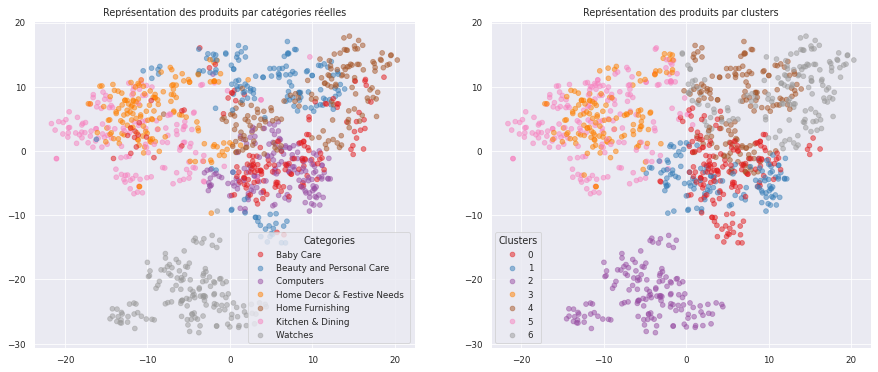

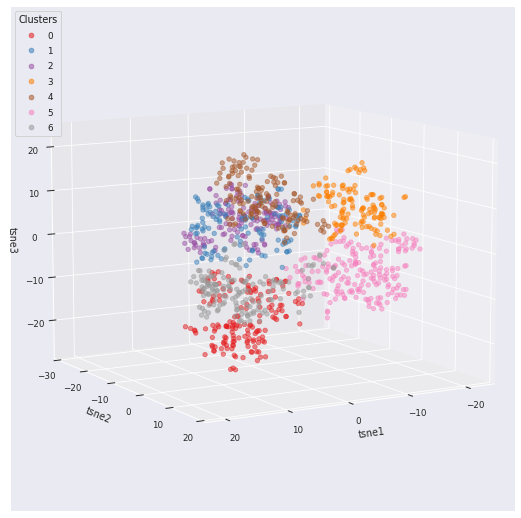

49 lines


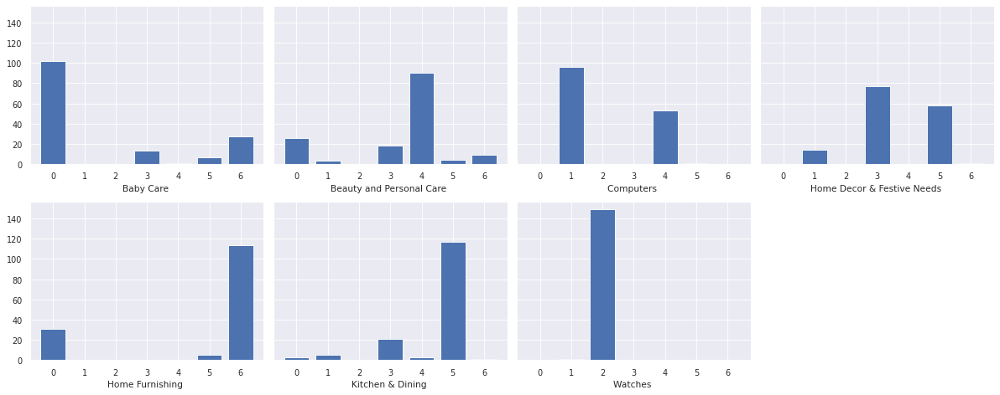

[[102   0   0  13   1   7  27]
 [ 26   3   0  18  90   4   9]
 [  0  96   0   0  53   1   0]
 [  0  14   0  77   0  58   1]
 [ 31   0   0   0   0   5 114]
 [  3   5   0  21   3 117   1]
 [  0   1 149   0   0   0   0]]

 Correspondance des clusters :  [0 2 6 3 1 5 4] 

Change the predicted classes id to correspond to true classes... 

Confusion matrix: 
 [[102   1   0  13  27   7   0]
 [ 26  90   3  18   9   4   0]
 [  0  53  96   0   0   1   0]
 [  0   0  14  77   1  58   0]
 [ 31   0   0   0 114   5   0]
 [  3   3   5  21   1 117   0]
 [  0   0   1   0   0   0 149]] 

Classification report: 
               precision    recall  f1-score   support

           0       0.63      0.68      0.65       150
           1       0.61      0.60      0.61       150
           2       0.81      0.64      0.71       150
           3       0.60      0.51      0.55       150
           4       0.75      0.76      0.75       150
           5       0.61      0.78      0.68       150
           6       1

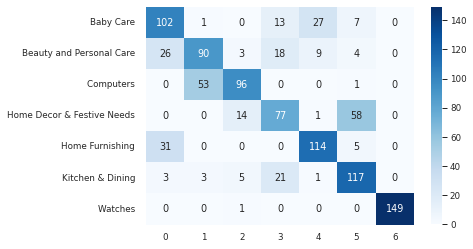



 *** Products which are Baby Care  but predicted as Home Furnishing  : *** 


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,0
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,0
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,6
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASH

5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,0
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,6
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care,0
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care,0
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,0


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,6
4,key feature jaipur print cotton floral king sized double bedsheet cotton jaipur print cotton floral king sized double bedsheet bed sheet pillow cover white price r nice bed sheet made cotton give comfort bed sheet hand printed bedsheet give nice look room fast colour good quality give bedsheet long life. specification jaipur print cotton floral king sized double bedsheet bed sheet pillow cover white general machine washable yes brand jaipur print type flat model name material cotton thread count model id fabric care machinewash bleach size king color white warranty waranty product manufacturing defect product exchange onle used returne origional packing dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm weight g fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package bed sheet pillow cover,BDSEJTHNGWVGWWQU,Jaipur Print Cotton Floral King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed...""]",6325b6870c54cd47be6ebfbffa620ec7.jpg,Jaipur Print,4,Home Furnishing,6
35,buy riva carpet cotton free bath mat classic loop shag r flipkart.com genuine product free shipping cash delivery,MATEB88TYRSSX8SH,Riva Carpets Cotton Free Bath Mat Classic Loop Shag Bathmat_RI-527,"[""Home Furnishing >> Bath Linen >> Bath Mats""]",81e739c7f3be737152f2e6f520e3494b.jpg,Riva Carpets,4,Home Furnishing,6
39,key feature jmd printed cushion cover printed size made cotton specification jmd printed cushion cover pack cm multicolor general brand jmd suitable cushion design code type square material cotton style code pattern printed color multicolor dimension height inch cm width inch cm additional feature reversible box number content sale package pack sale package cushion pillow cover,CPCEJMM7HWCNNGBR,JMD Printed Cushions Cover,"[""Home Furnishing >> JMD Home Furnishing >> JMD Printed Cushions Cover (Pack of 2, 40 cm*40 ...""]",66191b4a311b5d9babfc00a71ef97c5b.jpg,JMD,4,Home Furnishing,6
41,key feature kripa 's printed cushion cover length cm width cm specification kripa 's printed cushion cover pack cm grey general brand kripa 's suitable cushion design code type square material cotton style code pattern printed color grey dimension height inch cm width inch cm additional feature reversible yes box number content sale package pack,CPCEJMHZEHTQFACN,Kripa's Printed Cushions Cover,"[""Home Furnishing >> Kripa's Home Furnishing >> Kripa's Printed Cushions Cover (Pack of 2, 45 cm...""]",a79117ea49a0533f641facdb4c99f502.jpg,Kripa's,4,Home Furnishing,6


10 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,6
114,flipkart.com offering lollipop lane tiddly wink safari bath set r flipkart.com genuine product free shipping cash delivery,BBCDPFZM6V585ZZE,Lollipop Lane Tiddly Wink Safari Bath Set,"[""Baby Care >> Baby Grooming >> Baby Grooming Combos >> Lollipop Lane Baby Grooming Combos""]",bc784846bd59a16832454416ac708003.jpg,nan,0,Baby Care,6
651,buy marvel cotton bath towel r flipkart.com genuine product free shipping cash delivery,BTWEE4HMGWFQPGWH,Marvel Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Marvel Baby Bath Towels""]",705b90361aeda1849a728d80625a78a9.jpg,Marvel,0,Baby Care,6
654,buy intellect bazaar cotton bath towel baby towel r flipkart.com genuine product free shipping cash delivery,BTWEE2GMPQGD56ZT,"The Intellect Bazaar Cotton Bath Towel, Baby Towel","[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> The Intellect Bazaar Baby Bath Towels""]",e1d8c5b60f9157f8e21c77cf795952f2.jpg,The Intellect Bazaar,0,Baby Care,6
656,buy bornbabykids cotton bath towel r flipkart.com genuine product free shipping cash delivery,BTWEE2FFGXVH3MFW,BornBabyKids Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> BornBabyKids Baby Bath Towels""]",260c74b5a09272dec1a8207db3541a0d.jpg,BornBabyKids,0,Baby Care,6
665,buy welhouse cotton hand face towel set r flipkart.com genuine product free shipping cash delivery,BTWEE9APJJHT7ZHA,Welhouse Cotton Hand & Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Welhouse Baby Bath Towels""]",d6a50203fad654981605a70a7bde52b7.jpg,Welhouse,0,Baby Care,6
669,buy shrikant trader cotton bath towel r flipkart.com genuine product free shipping cash delivery,BTWEEAHUFNKU2YJH,Shrikant Traders Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Shrikant Traders Baby Bath Towels""]",d0fee79693c7dc3132d30491323b6407.jpg,Shrikant Traders,0,Baby Care,6
672,indha craft cloth photo frame photo size x cm photo price r outer shell frame made polyster bland fabric hard board fabric inner material carbord photo frame x inch outer shell frame made polyster bland fabric hard board fabric inner material carbord photo frame x inch,PHFDWUHW25WAWXHY,Indha Craft Cloth Photo Frame,"[""Baby Care >> Baby & Kids Gifts >> Photo Frames >> Indha Craft Photo Frames""]",6eabdbbbffdfae86c3c5177ba0f96ea7.jpg,nan,0,Baby Care,6
675,buy babybucket cotton bath towel r flipkart.com genuine product free shipping cash delivery,BTWEEA7F2NTYYHCF,BabyBucket Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> BabyBucket Baby Bath Towels""]",7f6678a6217c831b716feca796f689fd.jpg,BabyBucket,0,Baby Care,6
678,buy neyth cotton set towel r flipkart.com genuine product free shipping cash de

27


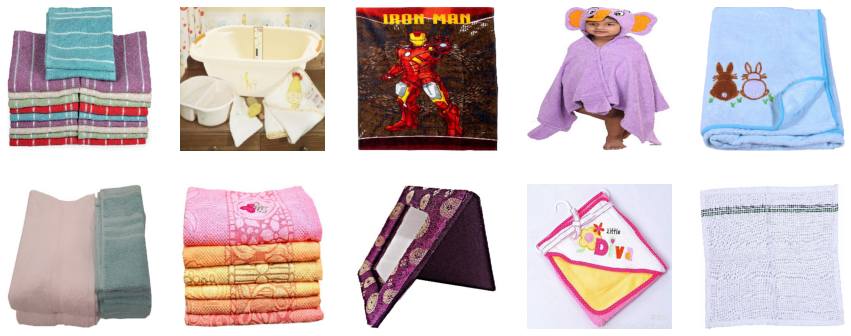

In [29]:
# USE 


# embed = hub.load("https://tfhub.dev/google/"
#                  + "universal-sentence-encoder/4")  # DAN
embed = hub.load("https://tfhub.dev/google/" 
                 + "universal-sentence-encoder-large/5") # Transformer

def feature_USE_fct(sentences, b_size):
    batch_size = b_size
    time1 = time.time()
    print(len(sentences))
    
    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))
        if step % 3 == 0: print('Step:', step)
    time2 = np.round(time.time() - time1, 0)
    
    return features


batch_size = 150  # 1050=2*3*5*5*7
sentences = data0['description'].to_list()

features_USE = feature_USE_fct(sentences, batch_size)
print(features_USE.shape)

# transf: dim3=true et perp=30: 0.58, dim3=false et perp=15: 0.56
# dan: dim3=true et perp=30 et batc=15 au lieu de 150: 0.48
ARI, X_tsne, labels = ARI_fct(features_USE, 
                              data1['label'], 
                              perplex=30, 
                              dim3=True)
TSNE_visu_fct(X_tsne, data1['label'], labels, ARI, dim3=True)

results_analysis(data1['label'], labels, data1)
show_errors(CATEGS[0], 6, labels, data1)



# IX. Images Embeddings


## IX.1 SIFT

1050 images
0
100
200
300
400
500
600
700
800
900
1000
sift_keypoints[0] : 
 [[ 34.000  9.000  8.000  2.000  3.000 ...  10.000  10.000  16.000  22.000  6.000]
 [ 24.000  6.000  10.000  8.000  8.000 ...  4.000  19.000  11.000  8.000  3.000]
 [ 55.000  8.000  4.000  7.000  10.000 ...  3.000  7.000  2.000  5.000  43.000]
 [ 93.000  2.000  0.000  10.000  69.000 ...  0.000  2.000  5.000  3.000  18.000]
 [ 56.000  14.000  2.000  8.000  81.000 ...  7.000  24.000  34.000  3.000  4.000]
 ...
 [ 40.000  2.000  0.000  38.000  171.000 ...  0.000  0.000  0.000  0.000  0.000]
 [ 7.000  11.000  12.000  11.000  21.000 ...  125.000  26.000  0.000  0.000  0.000]
 [ 1.000  0.000  1.000  8.000  26.000 ...  4.000  136.000  15.000  0.000  4.000]
 [ 43.000  18.000  11.000  15.000  26.000 ...  37.000  74.000  19.000  2.000  0.000]
 [ 17.000  46.000  56.000  14.000  7.000 ...  9.000  1.000  1.000  0.000  0.000]]
(201, 128)

 Nombre de descripteurs :  (201698, 128)
 temps de traitement SIFT descriptor :        

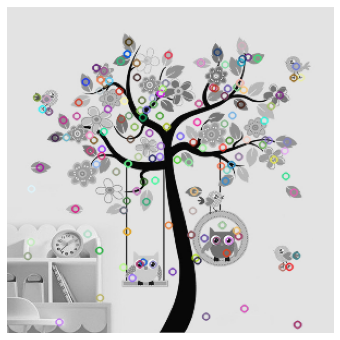


 Descripteurs de la dernière image :  (200, 128) 
 [[ 47.000  41.000  2.000  10.000  1.000 ...  33.000  3.000  1.000  1.000  1.000]
 [ 0.000  0.000  11.000  28.000  7.000 ...  17.000  0.000  0.000  0.000  0.000]
 [ 6.000  16.000  20.000  36.000  57.000 ...  114.000  16.000  0.000  0.000  0.000]
 [ 34.000  29.000  0.000  0.000  1.000 ...  0.000  3.000  92.000  107.000  4.000]
 [ 2.000  80.000  136.000  2.000  0.000 ...  6.000  43.000  65.000  0.000  0.000]
 ...
 [ 44.000  29.000  5.000  14.000  61.000 ...  42.000  18.000  6.000  9.000  2.000]
 [ 13.000  7.000  23.000  77.000  56.000 ...  0.000  7.000  114.000  72.000  6.000]
 [ 3.000  4.000  2.000  0.000  8.000 ...  6.000  1.000  0.000  2.000  14.000]
 [ 0.000  2.000  25.000  15.000  112.000 ...  18.000  6.000  45.000  60.000  4.000]
 [ 23.000  104.000  100.000  9.000  2.000 ...  19.000  8.000  4.000  1.000  1.000]] 

Nombre de clusters estimés :  449
Création de 449 clusters de descripteurs ... 

huggingface/tokenizers: The current pr

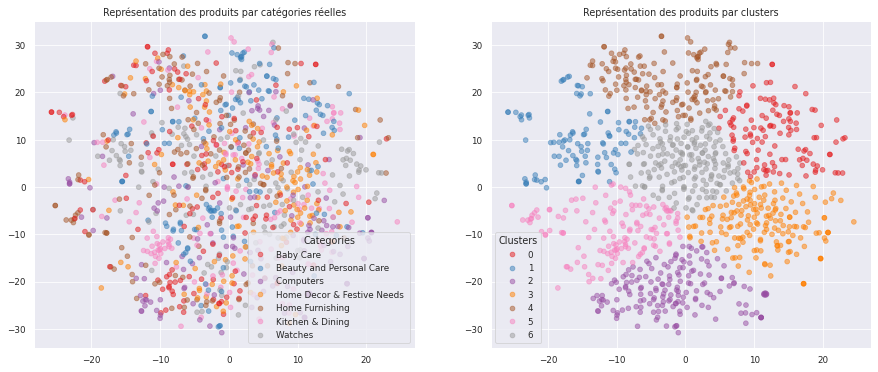

49 lines


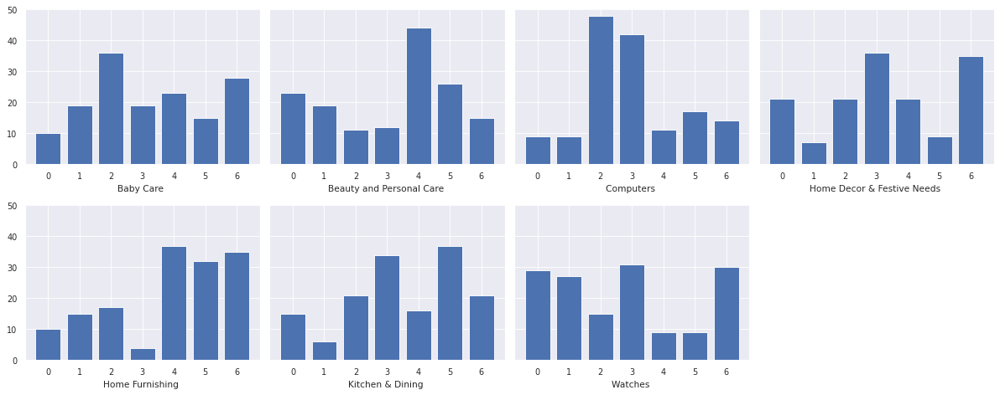

[[10 19 36 19 23 15 28]
 [23 19 11 12 44 26 15]
 [ 9  9 48 42 11 17 14]
 [21  7 21 36 21  9 35]
 [10 15 17  4 37 32 35]
 [15  6 21 34 16 37 21]
 [29 27 15 31  9  9 30]]

 Correspondance des clusters :  [6 6 2 2 1 5 3] 

Change the predicted classes id to correspond to true classes... 

Confusion matrix: 
 [[ 0 23 55 28  0 15 29]
 [ 0 44 23 15  0 26 42]
 [ 0 11 90 14  0 17 18]
 [ 0 21 57 35  0  9 28]
 [ 0 37 21 35  0 32 25]
 [ 0 16 55 21  0 37 21]
 [ 0  9 46 30  0  9 56]] 

Classification report: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       150
           1       0.27      0.29      0.28       150
           2       0.26      0.60      0.36       150
           3       0.20      0.23      0.21       150
           4       0.00      0.00      0.00       150
           5       0.26      0.25      0.25       150
           6       0.26      0.37      0.30       150

    accuracy                           0.25      1050
   macro 

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


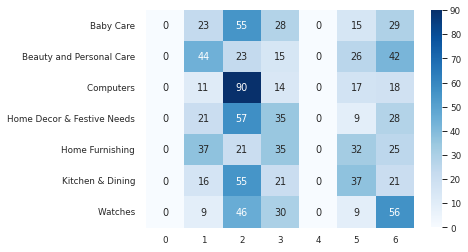



 *** Products which are Baby Care  but predicted as Home Decor & Festive Needs  : *** 


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,4
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,4
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,1
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASH

5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,4
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,1
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care,2
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care,2
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,4


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
6,camerii elegance analog watch men boy buy camerii elegance analog watch men boy online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATE6Y6D2MZHWGBZ,"Camerii WM64 Elegance Analog Watch - For Men, Boys","[""Watches >> Wrist Watches >> Camerii Wrist Watches""]",f355cc1ccb08bd0d283ed979b7ee7515.jpg,nan,6,Watches,6
7,star analog watch boy price r whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest,WATECFFVGFZPAD3D,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,"[""Watches >> Wrist Watches >> T STAR Wrist Watches""]",dd0e3470a7e6ed76fd69c2da27721041.jpg,nan,6,Watches,6
13,titan analog watch boy men buy titan analog watch boy men online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATEDBVHQ6AJX7N9,"Titan 1639SL03 Analog Watch - For Boys, Men","[""Watches >> Wrist Watches >> Titan Wrist Watches""]",189fa66a5fa6f08d2802a62ecf0be298.jpg,nan,6,Watches,6
23,skmei sport digital watch men boy buy skmei sport digital watch men boy online india flipkart.com digital chronograph alarm watch light function date month display great discount genuine product day replacement guarantee free shipping cash delivery,WATE9MVXDEVHGHAU,"Skmei DG0939-Red Sports Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Skmei Wrist Watches""]",4788f5466992da09024b8ffcc8a5cba4.jpg,nan,6,Watches,6
28,vizion sport series digital watch boy girl price r brand vizion sport series watch year manufacturer warranty digital display automatic movement metal case solid body dial shape round dial strap material silicone strap water resistant night display cold backlight daily alarm hour minute second date week display hour format attractive brand packaging- tuff plastic box note case non-receipt warranty card please intimate u within hour disclaimer product color may slightly vary due photographic lighting source monitor setting image enlarged better viewing brand vizion sport series watch year manufacturer warranty digital display automatic movement metal case solid body dial shape round dial strap material silicone strap water resistant night display cold backlight daily alarm hour minute second date week display hour format attractive brand packaging- tuff plastic box note case non-receipt warranty card please intimate u within hour disclaimer product color may slightly vary due photographic lighting source monitor setting image enlarged better viewing,WATECSW5DJ3UBZYT,"Vizion 8502-7PURPLE Sports Series Digital Watch - For Boys, Girls","[""Watches >> Wrist Watches >> Vizion Wrist Watches""]",b52073e7ed9c00c4108cae4eb0c49c1a.jpg,nan,6,Watches,6


10 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
75,specification vitamin embroidered baby girl 's denim short general detail ideal baby girl 's occasion casual pattern embroidered short detail type denim short fabric cotton pocket mitered patch pocket thigh number content sale package pack fabric care gentle machine wash lukewarm water bleach additional detail style code rani box short,SRTEHHXGEVDQMEQV,Vitamins Embroidered Baby Girl's Denim Shorts,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Shorts & Trousers >> Shorts >> Vitamins Shorts >> Vitamins Embroidered Baby Girl's Denim Shorts""]",ae45b64d808a883aa35f2bf4de879cac.jpg,Vitamins,0,Baby Care,6
79,key feature baby cap red check cap red check cotton specification baby cap red check cap cap detail number content sale package pack fabric cotton type baby cap red check general detail occasion casual ideal baby boy 's baby girl 's additional detail style code baby cap red check,CAPEGW7UTGHRJBEW,florence9 baby cap red checks Cap,"[""Baby Care >> Infant Wear >> Baby Boys' Clothes >> Accessories >> Caps >> florence9 Caps >> florence9 baby cap red checks Cap""]",320833ab08c9a94ef83520612899a85f.jpg,florence9,0,Baby Care,6
114,flipkart.com offering lollipop lane tiddly wink safari bath set r flipkart.com genuine product free shipping cash delivery,BBCDPFZM6V585ZZE,Lollipop Lane Tiddly Wink Safari Bath Set,"[""Baby Care >> Baby Grooming >> Baby Grooming Combos >> Lollipop Lane Baby Grooming Combos""]",bc784846bd59a16832454416ac708003.jpg,nan,0,Baby Care,6
117,anthill baby boy 's baby girl 's bodysuit buy yellow anthill baby boy 's baby girl 's bodysuit r online india shop online apparel huge collection branded clothes flipkart.com,BOLEDQ9GWZHESQF8,"Anthill Baby Boy's, Baby Girl's Bodysuit","[""Baby Care >> Infant Wear >> Baby Boys' Clothes >> Bodysuits & Sleepsuits >> Bodysuits >> Anthill Bodysuits""]",be09f5a3a88ac10ae14c791fc8ac0dae.jpg,nan,0,Baby Care,6
282,key feature cherry crumble california baby boy 's dungaree fabric cotton brand color grey olive camouflage specification cherry crumble california baby boy 's dungaree top detail fabric cotton type dungaree general detail pattern printed ideal baby boy 's,DRPEHQY8Z5UZFP7V,cherry crumble california Baby Boy's Dungaree,"[""Baby Care >> Infant Wear >> Baby Boys' Clothes >> Dungarees & Jumpsuits >> Dungarees >> cherry crumble california Dungarees >> cherry crumble california Baby Boy's Dungaree""]",a8ea6fc2b3cd95f46bced80853ce8e0e.jpg,cherry crumble california,0,Baby Care,6
292,key feature toddla baby girl 's gathered dress raglan printed dress beautiful flower waist lining cotton toddla gathered a-line cotton floral print knee-longdress baby girl material made cotton make dress comfortable wear day long perfrect dress little princess carry cuteness style wash care normal wash cold water twist tumble .dry shade toddla baby girl 's gathered dress price r raglan printed dress beautiful flower waist lining cotton. specification toddla baby girl 's gathered dress box frock dimension length midi/knee length general detail pattern floral print ideal baby girl 's occasion casual dress detail sleeve sleeveless number content sale package pack fabric cotton type gathered neck crew neck additional detail detail product weight g product length cm,DREEG78PDRW4GCD8,Toddla Baby Girl's Gathered Dress,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Dresses & Skirts >> Dresses >> Toddla Dresses >> Toddla Baby Girl's Gathered Dress""]",7c15895bbfd7da97c219be5b28150a06.jpg,Toddla,0,Baby Care,6
297,key feature globe graphic print baby boy 's round neck orange t-shirt fit regular suitable western wear sleeve half sleeve fabric cotton color orange globe graphic print baby boy 's round neck orange t-shirt price r comfortable casual loose fitting heavyweight dark color polo t-shirt quickly become one kid favorite made cotton wear well anyone ’ double-needle stitched bottom sleeve hem extra durab

28


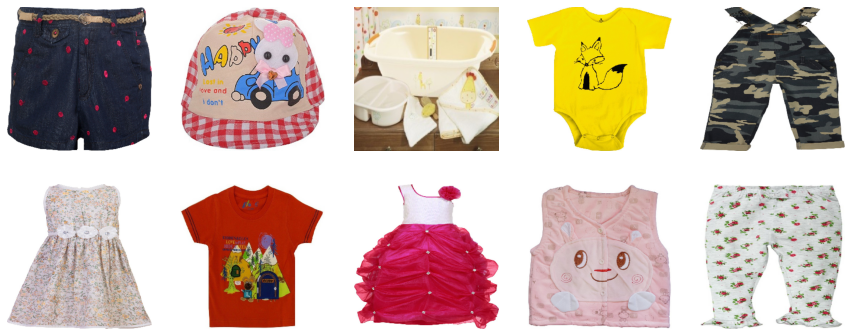

In [30]:
# SIFT embeddings (vision)



list_photos = data1['image']   
print(len(list_photos), 'images')
temps1=time.time()

# Identification of key points and associated descriptors
# Création d'une liste de descripteurs par image 
# ("sift_keypoints_by_img") qui sera utilisée pour réaliser les 
# histogrammes par image
# Création d'une liste de descripteurs pour l'ensemble des images 
# ("sift_keypoints_all") qui sera utilisé pour créer les clusters 
# de descripteurs
sift_keypoints = []
sift = cv2.SIFT_create(200)  # use the best 200 features

for image_num in range(len(list_photos)):
    if image_num%100 == 0 : 
        print(image_num) #, time.time() - temps1)
    image = cv2.imread(PATH_IMAGES + list_photos[image_num], 0)
        # convert in gray (code 0)
        # OpenCV uses BGR as its default colour order for images,
        # matplotlib uses RGB
        # plt.imshow expect a 3d matrix(RGB) or a 2D matrix and then 
        # use pseudo-color->reddish
#     plt.imshow(image) ; plt.show()
#     image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) 
#     # print(image[:5,:5])       
    image = cv2.resize(image, 
                       (300, 300))#, interpolation = cv2.INTER_AREA)
#     if image_num <15:
#         print(image.shape)    
#         plt.imshow(image, cmap='gray') ; plt.show()
    res = cv2.equalizeHist(image)   # equalize image histogram
        # normalizes the brightness and increases the contrast
#     clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
#     res = clahe.apply(image)
    kp, des = sift.detectAndCompute(res, None)
        # detect keypoints and compute descriptors. None=no mask
    sift_keypoints.append(des)

print('sift_keypoints[0] :', nl, sift_keypoints[0])
sift_keypoints_by_img = np.asarray(sift_keypoints, 
                                   dtype=object)  #shape (1050, )
print((sift_keypoints_by_img[0].shape))
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)
print(nl, "Nombre de descripteurs : ", sift_keypoints_all.shape)
duration1 = time.time() - temps1
print(" temps de traitement SIFT descriptor : ", 
      "%15.2f" % duration1, "secondes", nl)

# Display last image with keypoints
img = cv2.drawKeypoints(image, kp, image)  # input, keypoints, output
plt.figure(figsize = (6,6))
plt.axis('off') 
plt.imshow(img)
plt.show()
print(nl, "Descripteurs de la dernière image : ", des.shape, nl, des, nl)


# Determination number of clusters
temps1 = time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)), 0)) 
print("Nombre de clusters estimés : ", k)
print("Création de", k, "clusters de descripteurs ...", nl)

# Clustering
# kmeans = KMeans(n_clusters=k, 
#                 random_state=SEED, 
#                 verbose=11, 
#                 max_iter=40,
#                 algorithm='elkan', 
#                 n_init=5)
kmeans = MiniBatchKMeans(n_clusters=k, 
                         init_size=3*k, 
                         random_state=SEED, 
                         batch_size=150)
kmeans.fit(sift_keypoints_all)

duration1 = time.time() - temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, 
      "secondes", nl)


# Creation of histograms (features)
# Pour chaque image :
#   - prédiction des numéros de cluster de chaque descripteur
#   - création d'un histogramme = comptage pour chaque numéro de 
#   cluster du nombre de  descripteurs de l'image
#   - Features d'une image = Histogramme d'une image = Comptage 
#   pour une image du nombre de descripteurs par cluster

temps1 = time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des = len(des)
    if nb_des == 0 : 
        print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0 / nb_des
    return hist

# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i)
            #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1 = time.time() - temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, 
      "secondes", nl)


ARI, X_tsne, labels = ARI_fct(im_features, 
                              data1['label'], 
                              perplex=40, 
                              dim3=False, 
                              algo='kmeans')
TSNE_visu_fct(X_tsne, data1['label'], labels, ARI, dim3=False)

results_analysis(data1['label'], labels, data1)
show_errors(CATEGS[0], 6, labels, data1)



## IX.2 CNN models with Transfer Learning

1050
0 (1, 299, 299, 3)


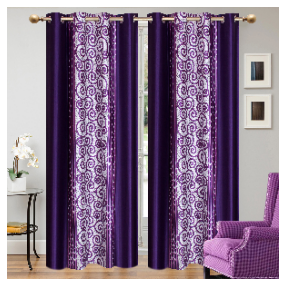

100 (1, 299, 299, 3)


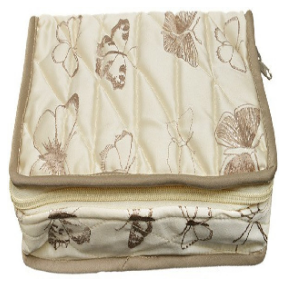

200 (1, 299, 299, 3)


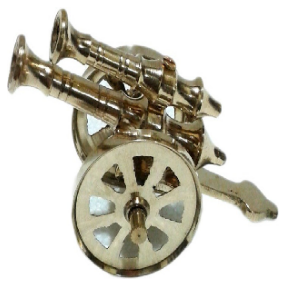

300 (1, 299, 299, 3)


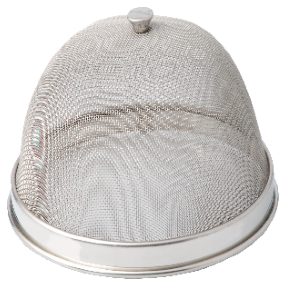

400 (1, 299, 299, 3)


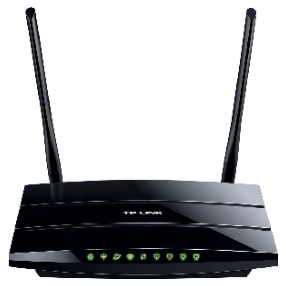

500 (1, 299, 299, 3)


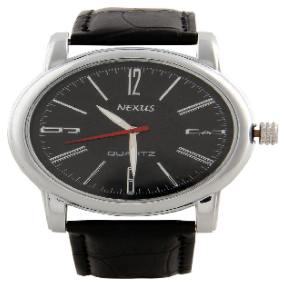

600 (1, 299, 299, 3)


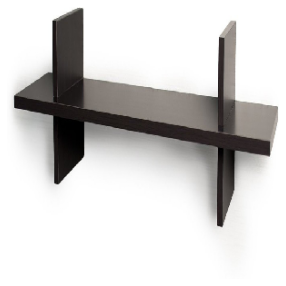

/opt/conda/lib/python3.7/site-packages/PIL/Image.py:2899: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


700 (1, 299, 299, 3)


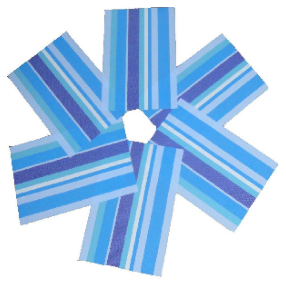

800 (1, 299, 299, 3)


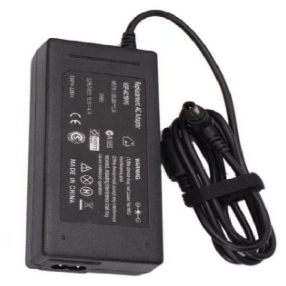

900 (1, 299, 299, 3)


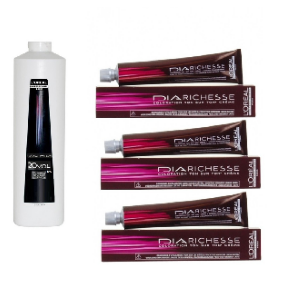

1000 (1, 299, 299, 3)


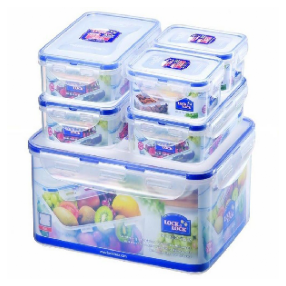

temps de traitement :           258.07 secondes 

91897856/91884032 [==============================] - 1s 0us/step

 Xception 

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0         

2022-06-25 12:51:06.496175: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1126452600 exceeds 10% of free system memory.
2022-06-25 12:51:07.692656: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1126452600 exceeds 10% of free system memory.


33/33 [==============================] - 11s 137ms/step
(1050, 2048)
temps de traitement :            12.89 secondes 


 ARI : 0.6 ( time : 14.0 s )


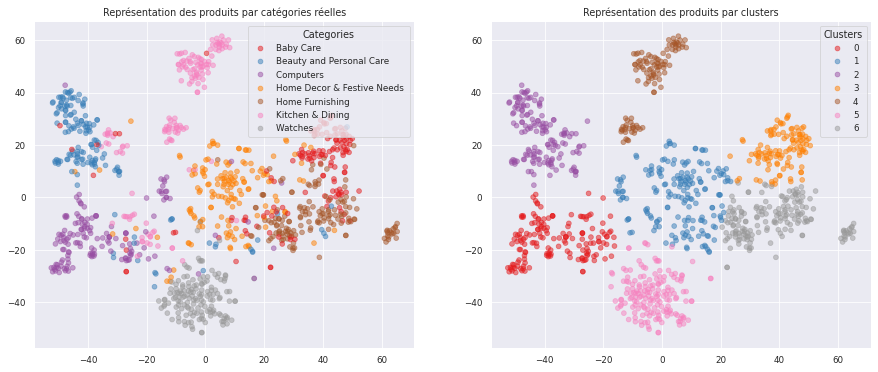

49 lines


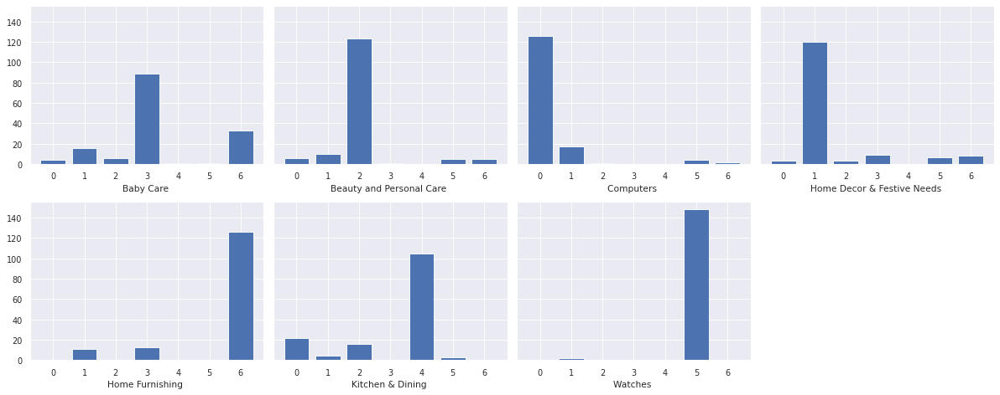

[[  4  16   6  89   1   1  33]
 [  6  10 123   1   0   5   5]
 [126  17   1   0   0   4   2]
 [  3 120   3   9   0   7   8]
 [  0  11   0  13   0   0 126]
 [ 22   4  16   0 105   3   0]
 [  0   2   0   0   0 148   0]]

 Correspondance des clusters :  [2 3 1 0 5 6 4] 

Change the predicted classes id to correspond to true classes... 

Confusion matrix: 
 [[ 89   6   4  16  33   1   1]
 [  1 123   6  10   5   0   5]
 [  0   1 126  17   2   0   4]
 [  9   3   3 120   8   0   7]
 [ 13   0   0  11 126   0   0]
 [  0  16  22   4   0 105   3]
 [  0   0   0   2   0   0 148]] 

Classification report: 
               precision    recall  f1-score   support

           0       0.79      0.59      0.68       150
           1       0.83      0.82      0.82       150
           2       0.78      0.84      0.81       150
           3       0.67      0.80      0.73       150
           4       0.72      0.84      0.78       150
           5       0.99      0.70      0.82       150
           6       0

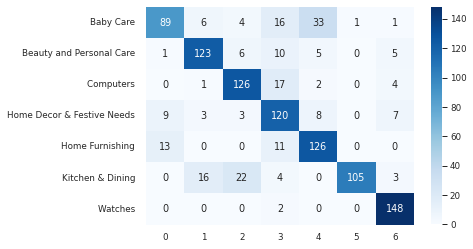



 *** Products which are Baby Care  but predicted as Home Decor & Festive Needs  : *** 


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,6
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,6
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,6
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASH

5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,6
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,6
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care,3
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care,3
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,1


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
56,buy borse make jewellery vanity case online borse make jewellery vanity case best price free shipping cash delivery genuine product day replacement guarantee,VANEABFPKGGZTYVQ,Borse N16 Make Up And Jewellery Vanity Case,"[""Beauty and Personal Care >> Makeup >> Vanity Boxes >> Borse Vanity Boxes""]",24e85c590481a7cedfe66597f253f2b2.jpg,nan,1,Beauty and Personal Care,1
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,1
67,key feature prime printed seater table cover length cm width cm prime printed seater table cover multicolor pvc price r prime center table cover printed seater specification prime printed seater table cover multicolor pvc box number content sale package pack general brand prime type table cover model name material pvc model id color multicolor dimension weight g length inch cm width inch cm seating capacity seater,TCVEHSMFAGATW2FZ,Prime Printed 4 Seater Table Cover,"[""Home Furnishing >> Kitchen & Dining Linen >> Table Covers >> Prime Printed 4 Seater Table Cover (Multicolor, ...""]",707b160df4c4dece6cde52b222ce624b.jpg,Prime,4,Home Furnishing,1
70,key feature caffeine handmade tribal print influenced katori bowl set stoneware bowl set tip bottom handmade fine detail dessert bowl used vegetable fruit custard snack etc material ceramic/stoneware capacity note set caffeine handmade tribal print influenced katori bowl set stoneware bowl set orange green pack price r caffeine ceramic handmade tribal print influenced katori bowl set perfect product handmade tribal pottery art time elegant piece ceramic work cute combination katori set piece perfect glossy ceramic finish beauty hand art field product enough highlight serving give dining elite sweet touch love food love kitchen definitely love modern approach pudding dessert bowl serve guest meal get sparkling appreciation fine hospitality tip bottom handmade fine detail dessert bowl used vegetable fruit custard snack etc material ceramic/stoneware capacity note set specification caffeine handmade tribal print influenced katori bowl set stoneware bowl set orange green pack general brand caffeine model number type bowl set model name handmade tribal print influenced katori bowl set bowl type ice cream bowl pudding bowl fruit bowl decorative bowl soup bowl vegetable bowl sauce bowl freezer safe yes microwave safe yes color orange green body design feature material stoneware box sale package bowl pack,BWLEHTBPHRBSDEYF,Caffeine Handmade Tribal Print Influenced Katori Bowl (Set of 2) Stoneware Bowl Set,"[""Kitchen & Dining >> Consumables & Disposables >> Bowls >> Caffeine Bowls >> Caffeine Handmade Tribal Print Influenced Katori...""]",9ba898ecb77ab5a6799c8b047c6b6008.jpg,Caffeine,5,Kitchen & Dining,1
71,key feature prime printed seater table cover length cm width cm prime printed seater table cover multicolor pvc price r prime dining table cover printed seater specification prime printed seater table cover multicolor pvc box number content sale package pack general brand prime type table cover model name material pvc model id color multicolor dimension weight g length inch cm width inch cm seating capacity seater,TCVEHSMFYEQGRTAZ,Prime Printed 8 Seater Table Cover,"[""Home Furnishing >> Kitchen & Dining Linen >> Table Covers >> Prime Printed 8 Seater Table Cover (Multicolor, ...""]",f2658bad8c2b7d5b08984c6ac34267f7.j

10 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,1
79,key feature baby cap red check cap red check cotton specification baby cap red check cap cap detail number content sale package pack fabric cotton type baby cap red check general detail occasion casual ideal baby boy 's baby girl 's additional detail style code baby cap red check,CAPEGW7UTGHRJBEW,florence9 baby cap red checks Cap,"[""Baby Care >> Infant Wear >> Baby Boys' Clothes >> Accessories >> Caps >> florence9 Caps >> florence9 baby cap red checks Cap""]",320833ab08c9a94ef83520612899a85f.jpg,florence9,0,Baby Care,1
82,specification chinmay kid printed cotton padded mosquito net multicolour convenience feature washable yes general brand chinmay kid model name printed cotton padded capacity person model id color multicolour dimension weight g height inch width inch box sale package mosquito net,MNTEGKSZD2ZWUBZK,CHINMAY KIDS Printed Cotton Padded Mosquito Net,"[""Baby Care >> Baby Bedding >> Baby Mosquito Nets >> CHINMAY KIDS Baby Mosquito Nets >> CHINMAY KIDS Printed Cotton Padded Mosquito Net ...""]",601817defaff9d0e30e1b72f96d3975f.jpg,CHINMAY KIDS,0,Baby Care,1
106,buy bestway x x sun shade inflatable play pool online bestway x x sun shade inflatable play pool best price free shipping cash delivery genuine product day replacement guarantee,IFPEEANZ88AYFQJJ,Bestway 1.47m x 1.47m x 1.22m/Play With Sun Shade Inflatable Play Pool,"[""Baby Care >> Furniture & Furnishings >> Inflatable Products >> Bestway Inflatable Products""]",184ecf07ca4e2872eaf53d2344a1e783.jpg,Bestway,0,Baby Care,1
114,flipkart.com offering lollipop lane tiddly wink safari bath set r flipkart.com genuine product free shipping cash delivery,BBCDPFZM6V585ZZE,Lollipop Lane Tiddly Wink Safari Bath Set,"[""Baby Care >> Baby Grooming >> Baby Grooming Combos >> Lollipop Lane Baby Grooming Combos""]",bc784846bd59a16832454416ac708003.jpg,nan,0,Baby Care,1
426,specification basra uepgrn green changing table general brand basra model number shade green model name uepgrn color green body design feature changing pad included safety strap included material plastic wheel included dimension weight kg height cm width cm depth cm box changing table additional feature feature easily use,DSEEHETVWRX9FZDT,BASRA uepgrn Green Changing Table,"[""Baby Care >> Diapering & Potty Training >> Changing Tables >> BASRA Changing Tables >> BASRA uepgrn Green Changing Table""]",70461caa9038cfa34d109ea056d57f5a.jpg,BASRA,0,Baby Care,1
428,specification graco literider click connect � marco multicolor general foldable yes age group year type stroller ideal boy girl weight supported kg wheel feature wheeled bottom yes wheel feature lockable wheel type swivel fixed dimension weight kg height inch width inch depth inch safety feature locking system yes box number content sale package sale package stroller body feature storage basket yes recline setting position number cup holder cup holder yes material lightweight aluminium leg rest type adjustable canopy yes,STREDF58JH3GQZF9,Graco LiteRider Click Connect � Marco,"[""Baby Care >> Strollers & Activity Gear >> Strollers & Prams >> Graco Strollers & Prams >> Graco LiteRider Click Connect � Marco (Multicolor)""]",dd5d6f0649f40d49791bbd5c00758e2f.jpg,Graco,0,Baby Care,1
448,key feature baby shower cap- purple easy bathing kid cap ensure shampo

16


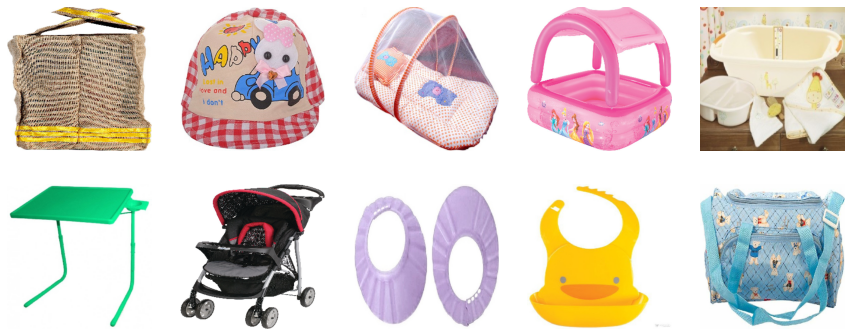

In [31]:
# CNN - Transfer Learning  *** needs GPU ***


list_photos = data1['image']   #[file for file in os.listdir(path)]
print(len(list_photos))
img_size = (299, 299, 3)
# input image size has to be fixed when include_top=True
# most models: (224, 224, 3)  
# xception, inceptionv3, inceptionres2 : (299, 299, 3) 
# naslarge : (331, 331, 3) 
# efficientnet b0 à b7: 224, 240, 260, 300, 380, 456, 528, 600
temps1 = time.time()


for image_num in range(len(list_photos)):
    # get a PIL image object
    image = load_img(PATH_IMAGES + list_photos[image_num], 
                     target_size=(img_size),
                     #color_mode='grayscale')
    )
    # convert the image pixels to a numpy array
    image = img_to_array(image)
    # reshape data for the model, 1 for 1 image 
    image = image.reshape((1, 
                           image.shape[0], 
                           image.shape[1], 
                           image.shape[2]))  
    if image_num%100 == 0: 
        print(image_num, image.shape)
        plt.figure(figsize=(5, 5)) 
        plt.imshow(np.squeeze(image)/255)
        plt.axis('off')
        plt.show()
        # plt.imshow(np.squeeze(image), cmap='gray') ; 
        # plt.axis('off') ; plt.show()
#         rgb_batch = np.repeat(grayscale_batch[..., np.newaxis], 
#                               3, -1)  
#                 # to use gray images in VGG
#     # prepare the image for the CNN model
#     image = prepro[CNN_ALGO].preprocess_input(image) 
#             # preprocess_input(image)
#     print(image.shape, images.shape)
    
    if image_num == 0:
        images2 = image
    else:
        images2 = np.vstack([images2, image])
    
    

# Preprocess after loading images to quickly check different CNN algos

# CNN_ALGO = 'EffB7'  #false, : not enough memory even with tpu!
# CNN_ALGO = 'Dense121'  #false, 35: 0.61
CNN_ALGO = 'Xception'  #false, 25 (20 if tpu): 0.62 (0.59)

images = images2.copy()
# print(images2.shape, images2[0, :, :, :].shape)  #1050,224,224,3
for i in range(images.shape[0]):
    #img = cv2.resize((images2[i, :, :, :]), (299, 299)) 
    images[i, :, :, :] = prepro[CNN_ALGO].preprocess_input(
        images[i, ...]) 
    
duration = time.time() - temps1
print("temps de traitement : ", "%15.2f" % duration, "secondes", nl)


# load model
model = funcs[CNN_ALGO](include_top=True, input_shape=(img_size),
                        weights="imagenet")

# print(nl)
# for layer in model.layers[-5:]:
#     print(layer._name)
    
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

"""
# Below is to make and train a classifier (got around 75% accuracy 
# on valid set) but not enough data for a full DL training

# class1 = Dropout(0.4)(model.layers[-1].output)
# class1 = Dense(tf.constant(512), 
                 activation='relu')(model.layers[-1].output) #(class1)
pred = Dense(tf.constant(N_CATEG), 
             activation='softmax')(model.layers[-1].output) #(class1)
model = Model(inputs=model.inputs, outputs=pred)

# mark all layers except latest layers as non-trainable
for layer in model.layers[:-8]:
	layer.trainable = False

# Freezing the batch_norm layer add 0.03 to val_acc    
model.layers[-4].trainable = False
model.layers[-7].trainable = False
model.layers[-10].trainable = False
model.layers[-13].trainable = False
model.layers[-16].trainable = False
print(model.summary())
    
model.compile(loss="sparse_categorical_crossentropy", 
                  optimizer=Adam(learning_rate=1e-5), 
                  metrics=["accuracy"])

model_info = model.fit(images, np.asarray(data1['label']), epochs=25, 
                       batch_size=64*2, verbose=2, workers=-1, 
                       validation_split=0.3)
print(np.asarray(data1['label']).shape, images.shape)

df_history = pd.DataFrame(model_info.history)
df_history.plot()
plt.show()
"""


print(nl, CNN_ALGO, nl)
print(model.summary())

# get the extracted features for all the images
temps2 = time.time()
features_CNN = model.predict(images, verbose=1)#, batch_size=64)
# features = model.layers[-1].get_weights()[0]  # [1] for the bias
print(features_CNN.shape)  # print(cnn_features.shape)
duration = time.time() - temps2
print("temps de traitement : ", "%15.2f" % duration, "secondes", nl)



dim3 = False
ARI, X_tsne, labels = ARI_fct(features_CNN, data1['label'], perplex=20, 
                              dim3=dim3, algo='kmeans')
TSNE_visu_fct(X_tsne, data1['label'], labels, ARI, dim3=dim3)

results_analysis(data1['label'], labels, data1)
show_errors(CATEGS[0], 1, labels, data1)



# X. Combined Texts + Images Embeddings

(1050, 1024) (1050, 2048)
(1050, 3072)


i0        i1        i2        i3        i4        i5        i6  \
0 -0.033690 -0.581120  0.471037  0.065067  1.955635 -0.294548 -0.906704   
1 -0.665494 -0.576790 -0.289540 -0.303245 -0.664676 -0.552573 -0.901727   
2  1.753435  1.781991  0.663946  0.025626  0.472734 -0.552573 -0.623145   
3  1.181191 -0.851365  0.596268 -0.514823 -0.637895 -0.169153 -0.868430   
4  0.505162 -0.851365  0.300858 -0.099976 -0.206111 -0.152240 -0.906704   

         i7        i8        i9       i10       i11       i12       i13  \
0  0.727383 -0.613415 -0.502130 -0.496085 -0.784206 -0.702190  0.463333   
1 -0.562106 -0.613415 -0.622359 -0.496085 -0.714102 -0.684861 -0.721176   
2 -0.562106 -0.532975 -0.574757  2.905680  2.297605  0.545977 -0.041249   
3 -0.279668 -0.237340  0.071965 -0.335777 -0.603966 -0.165351  0.270014   
4 -0.550483 -0.613415 -0.268445 -0.392716  0.560438 -0.702190 -0.411174   

        i14       i15       i16       i17       i18       i19       i20  \
0 -0.281834 -0.295540 -0.524350  1.011828  2.210538  0.361303 -0.074468   
1  0.245433 -0.413623 -0.746637 -0.595224 -0.744007 -0.696909 -0.702226   
2 -0.113634  1.306073  2.304338 -0.595224  0.052434 -0.546893 -0.507556   
3  1.158955 -0.539986  0.025594  0.547573 -0.593945 -0.091826  0.507611   
4 -0.147600 -0.581671  1.115446  1.915294 -0.740041 -0.700349  0.247325   

        i21       i22       i23       i24       i25       i26       i27  \
0  2.208350 -0.518897 -0.536270  0.332890  1.486079 -0.042980 -0.040425   
1 -0.520508 -0.526124 -0.600812 -0.666544  1.568475 -0.419440 -0.740767   
2 -0.504828 -0.698267 -0.602019 -0.121326  2.559551 -0.498647 -0.682291   
3 -0.463666  1.124532 -0.536404 -0.379537  0.272002  1.671212 -0.118030   
4  1.000657 -0.631229 -0.076440 -0.031201  1.521082 -0.269968  0.206384   

        i28       i29       i30       i31       i32       i33       i34  \
0 -0.645646  2.603401 -0.519798 -0.421915  2.526406 -0.372809 -0.172670   
1 -0.645646 -0.575094  1.256044 -0.555195 -0.730092 -0.617687 -0.626678   
2  0.589056 -0.105230  4.543042 -0.451245 -0.683254 -0.040090 -0.572485   
3 -0.633139  0.889900 -0.296546 -0.071337  0.468339 -0.033467  0.225942   
4 -0.645646  1.264856 -0.509905 -0.581892  0.205364 -0.573993 -0.204664   

        i35       i36       i37       i38       i39       i40       i41  \
0  0.283849 -0.529606  0.506585 -0.678164  0.167381  0.623260  0.612788   
1 -0.167394 -0.419104 -0.565360 -0.678164 -0.533259 -0.363908 -0.622977   
2  1.804005  0.903019 -0.051711 -0.677846 -0.448289  0.725917  0.167121   
3  1.040047 -0.529649  0.634530 -0.597142 -0.533259  0.119888 -0.491565   
4  1.635233 -0.531840 -0.482182 -0.678164 -0.275644  0.254062  0.786437   

        i42       i43       i44       i45       i46       i47       i48  \
0 -0.851837 -0.536961 -0.435022 -0.137978 -0.624425  1.762363 -0.547917   
1 -0.851837 -0.667731 -0.716378 -0.556722 -0.631606 -0.661713 -0.594506   
2  1.138188 -0.522710 -0.192343  2.271481 -0.109189 -0.503414  0.617592   
3 -0.399269 -0.439272 -0.714358 -0.556722 -0.245924 -0.221300 -0.594506   
4 -0.798311 -0.589852 -0.714141 -0.556722 -0.631606 -0.124361 -0.401886   

        i49       i50       i51       i52       i53       i54       i55  \
0 -0.758906  0.847492 -0.505532 -0.568207  1.864091 -0.757392 -0.707743   
1 -0.758906 -0.081054 -0.535157 -0.613225  0.795515 -0.671949 -0.709782   
2 -0.636179 -0.719839 -0.502146 -0.519556  0.986380  1.488975 -0.003263   
3  0.030812  0.607698 -0.535157 -0.433792 -0.261639  0.721165  0.570596   
4 -0.509926  1.387384 -0.535157 -0.613225 -0.649022 -0.402193 -0.233865   

        i56       i57       i58       i59       i60       i61       i62  \
0  2.250781 -0.565734 -0.524951  0.057027 -0.420534 -0.641422 -0.806312   
1 -0.677639 -0.677687 -0.524951 -0.602795 -0.830127 -0.641422  1.190883   
2  0.125551 -0.202128 -0.524951 -0.204826 -0.489906 -0.292122  0.434011   
3 -0.119265  0.014525  0.110089 -0.602795 -0.928414 -0.638398  2.318077   
4  0.028944 -0.696482 -0.0


 ARI : 0.65 ( time : 14.0 s )


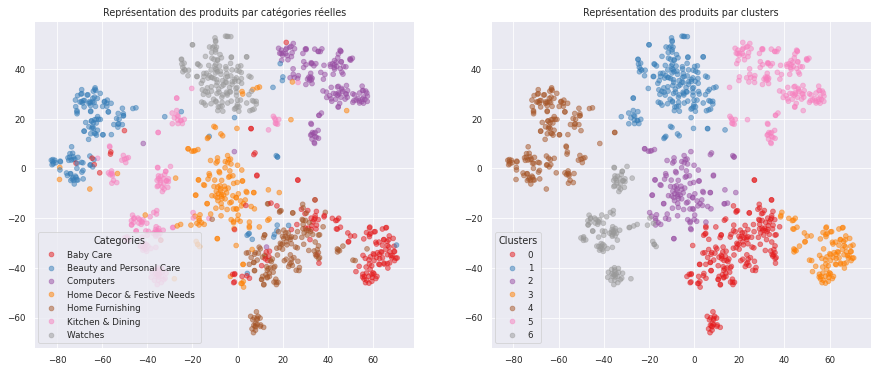

49 lines


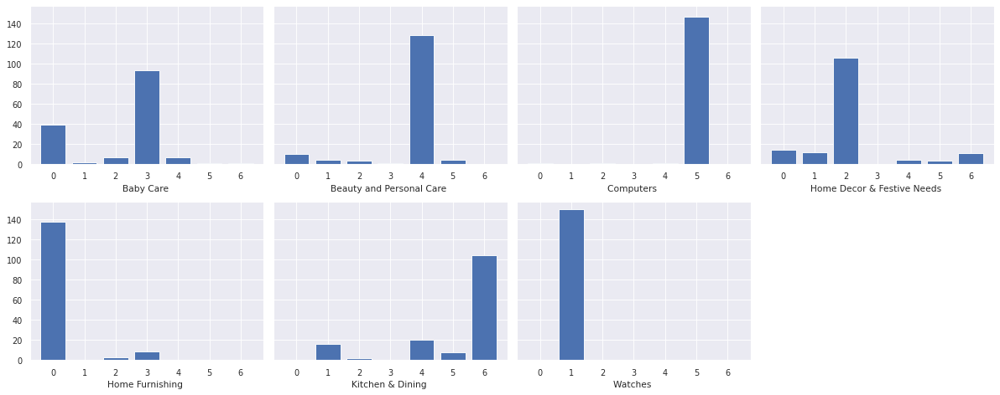

[[ 39   2   7  93   7   1   1]
 [ 10   4   3   1 128   4   0]
 [  1   0   1   0   1 147   0]
 [ 14  12 106   0   4   3  11]
 [138   0   3   9   0   0   0]
 [  0  16   2   0  20   8 104]
 [  0 150   0   0   0   0   0]]

 Correspondance des clusters :  [4 6 3 0 1 2 5] 

Change the predicted classes id to correspond to true classes... 

Confusion matrix: 
 [[ 93   7   1   7  39   1   2]
 [  1 128   4   3  10   0   4]
 [  0   1 147   1   1   0   0]
 [  0   4   3 106  14  11  12]
 [  9   0   0   3 138   0   0]
 [  0  20   8   2   0 104  16]
 [  0   0   0   0   0   0 150]] 

Classification report: 
               precision    recall  f1-score   support

           0       0.90      0.62      0.74       150
           1       0.80      0.85      0.83       150
           2       0.90      0.98      0.94       150
           3       0.87      0.71      0.78       150
           4       0.68      0.92      0.78       150
           5       0.90      0.69      0.78       150
           6       0

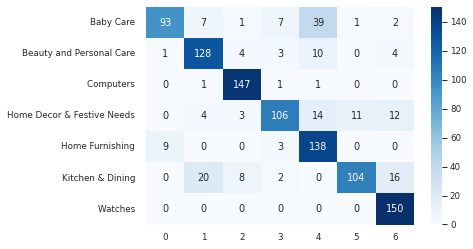



 *** Products which are Baby Care  but predicted as Watches  : *** 


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
0,key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interiors.this curtain made high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance,4,Home Furnishing,0
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,0
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,0
3,key feature santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding gifting specification santosh royal fashion cotton printed king sized double bedsheet pillow cover multicolor general brand santosh royal fashion machine washable yes type flat material cotton model name gold design royal cotton printed wedding gifted double bedsheet pillow cover model id color multicolor size king fabric care machine wash bleach dimension flat sheet width inch cm fitted sheet width cm pillow cover width inch cm pillow cover length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale package sale package pillow cover,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASH

5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
1,specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas,0,Baby Care,0
2,key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size- face towel cm x cms. specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight g length inch width inch box number content sale package sale package piece face towel set,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa,0,Baby Care,0
40,key feature mom kid baby girl 's printed green top pyjama set fabric cotton brand color green mom kid baby girl 's printed green top pyjama set price r girl pyjama set specification mom kid baby girl 's printed green top pyjama set general detail pattern printed ideal baby girl 's night suit detail fabric cotton type top pyjama set neck round neck box top pyjama set,NSTEJHERS3AKXUCW,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Green Top & Pyja...""]",90e56526f4c5892beac49f262b85150a.jpg,Mom and Kid,0,Baby Care,3
42,key feature mom kid baby girl 's printed blue grey top pyjama set fabric cotton brand color blue grey mom kid baby girl 's printed blue grey top pyjama set price r girl pyjamaset specification mom kid baby girl 's printed blue grey top pyjama set general detail pattern printed ideal baby girl 's night suit detail number content sale package pack fabric cotton type top pyjama set neck round nack box top pyjama set,NSTEJMHARPK8BXHS,"Mom and Kid Baby Girl's Printed Blue, Grey Top & Pyjama Set","[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Innerwear & Sleepwear >> Night Suits >> Mom and Kid Night Suits >> Mom and Kid Baby Girl's Printed Blue, Grey Top &...""]",5325213d84c80ad310b6e4b37a1ac824.jpg,Mom and Kid,0,Baby Care,3
63,key feature kohl wine bag yellow easy carry giftbags jutebags bit bob specification kohl wine bag yellow yellow general brand kohl insulated type bottle cover series wine bag material jute washable yes model name wine bag yellow ideal boy girl model id color yellow size large box number content sale package sale package bottle cover additional feature easy carry giftbags jutebags bit bob,BTCEJQYNBKZNZDKS,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)""]",f4e7f269319ba9cf5507a9e2febacbf5.jpg,KOHL,0,Baby Care,0


5 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
5,maserati time analog watch boy buy maserati time analog watch boy online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATEAYAHJ8CUCAYM,Maserati Time R8851116001 Analog Watch - For Boys,"[""Watches >> Wrist Watches >> Maserati Time Wrist Watches""]",893aa5ed55f7cff2eccea7758d7a86bd.jpg,nan,6,Watches,1
6,camerii elegance analog watch men boy buy camerii elegance analog watch men boy online india flipkart.com great discount genuine product day replacement guarantee free shipping cash delivery,WATE6Y6D2MZHWGBZ,"Camerii WM64 Elegance Analog Watch - For Men, Boys","[""Watches >> Wrist Watches >> Camerii Wrist Watches""]",f355cc1ccb08bd0d283ed979b7ee7515.jpg,nan,6,Watches,1
7,star analog watch boy price r whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest whether way work travelling abroad family lifestyle accessory like watch wallet belt help add touch sophistication class otherwise mundane regular daily wear come suave leather belt intricately designed finished timepiece separate rest,WATECFFVGFZPAD3D,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,"[""Watches >> Wrist Watches >> T STAR Wrist Watches""]",dd0e3470a7e6ed76fd69c2da27721041.jpg,nan,6,Watches,1
8,alfajr youth digital watch men boy buy alfajr youth digital watch men boy online india flipkart.com azan time city around world prayer reminder qibla direction hijri gregorian calnedars qur'an bookmark daily alrams great discount genuine product day replacement guarantee free shipping cash delivery,WATECHFU4QGFQEJG,"Alfajr WY16B Youth Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Alfajr Wrist Watches""]",41384da51732c0b4df3de8f395714fbb.jpg,nan,6,Watches,1
9,tag heuer formula analog watch boy men buy tag heuer formula analog watch boy men online india flipkart.com swiss-made quartz movement scratch resistant sapphire crystal glass water resistant metre feature chronograph great discount genuine product day replacement guarantee free shipping cash delivery,WATEA6UGFGKZKDJC,"TAG Heuer CAU1116.BA0858 Formula 1 Analog Watch - For Boys, Men","[""Watches >> Wrist Watches >> TAG Heuer Wrist Watches""]",710ed5f2393a4b9e8823aa0029f71f93.jpg,nan,6,Watches,1


2 lines


,description,pid,product_name,product_category_tree,image,brand,label,label_categ,n_cluster
783,flipkart.com offering small funcart party time food grade plastic r flipkart.com genuine product free shipping cash delivery,FDUE6ZHHEEHEHRQD,Funcart Party Time - Food Grade Plastic,"[""Baby Care >> Feeding & Nursing >> Utensils >> Baby Spoons & Forks >> Funcart Baby Spoons & Forks""]",9a0413117aa91c668ba5944770347cc5.jpg,Funcart,0,Baby Care,1
785,flipkart.com offering small funcart frolic birthday food grade plastic r flipkart.com genuine product free shipping cash delivery,FDUE6ZHHR9AAKU2B,Funcart Frolic Birthday - Food Grade Plastic,"[""Baby Care >> Feeding & Nursing >> Utensils >> Baby Spoons & Forks >> Funcart Baby Spoons & Forks""]",29d7a1b4d4f658fc3082905f65e1b009.jpg,Funcart,0,Baby Care,1


2


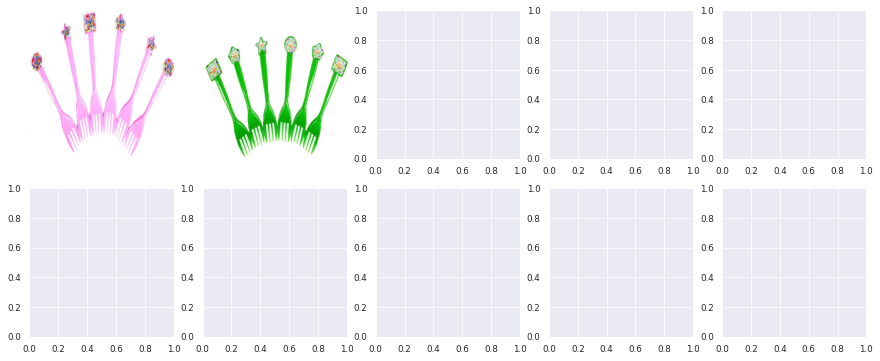

In [32]:

# Features & Clustering with the combined features of text + images


feat_text = features_bert #features_bert #features_USE
feat_img = features_CNN

print(feat_text.shape, feat_img.shape)
# pca = PCA(n_components=769) #, svd_solver='arpack')
# pca.fit(feat_img)
# feat_img = pca.transform(feat_img) 

# Transform the numpy arrays in 
cols_img = ['i'+str(i) for i in range(feat_img.shape[1])]
cols_text = ['t'+str(i) for i in range(feat_text.shape[1])]
features_all = pd.concat([pd.DataFrame(feat_img, columns=cols_img), 
                          pd.DataFrame(feat_text, columns=cols_text)], 
                         axis=1)
print(features_all.shape)

scaler = StandardScaler() 
scaler.fit(features_all)
features_all2 = pd.DataFrame(scaler.transform(features_all), 
                             columns=features_all.columns)
display(features_all2.head(5))

ARI, X_tsne, labels = ARI_fct(features_all2, data1['label'], perplex=15, 
                              dim3=False, algo='kmeans')
TSNE_visu_fct(X_tsne, data1['label'], labels, ARI, dim3=False)

results_analysis(data1['label'], labels, data1)
show_errors(CATEGS[0], 1, labels, data1)
